In [3]:
import re
import os
import pickle as pkl
import numpy as np
import pandas as pd
from pydeseq2.dds import DeseqDataSet
from pydeseq2.default_inference import DefaultInference
from pydeseq2.ds import DeseqStats


pd.set_option('display.max_rows',150)
pd.set_option('display.max_columns',30)
pd.set_option('display.max_rows',200)
# Replace this with the path to directory where you would like results to be saved
# OUTPUT_PATH = "/home/pku/Documents/PhD_Project/CO68/RNA-seq/MCB/DEGs"
# OUTPUT_PATH = '/home/pku/Documents/PhD_Project/CO68/RNA-seq/FPKM/MCB_All_FPKM/DEGs'
# OUTPUT_PATH = '/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/DEGs'
# os.chdir('/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/FPKM/')
os.listdir()

['GVAE_model.ipynb',
 'DeepMCB.ipynb',
 '.DS_Store',
 'REL_Inhibitor_Screening_CNN.ipynb',
 'cache',
 'R_figures_MCB.R',
 'pyDESeq2.ipynb',
 'qPCR_MCB.ipynb',
 'machineLearning',
 'ATAC_MCB.ipynb',
 'MCB_script_RNA-seq.ipynb',
 'innateImmune.ipynb',
 'ML_DrugDiscovery.ipynb',
 'sklearn_test.ipynb',
 'footprint.ipynb',
 'pyWGCNA_MCB.ipynb',
 'cluster_Biopython.ipynb']

In [4]:
wrkDir = '/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/'
WGCNADir = wrkDir + 'WGCNA/'
DEGsDir = '/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/DEGs/'
FPKMDir = '/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/FPKM/'
EnrichDir = '/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/enrichmentRes/'
TFsDir = '/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/TFs/'
TFsTrrustDir = '/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/TFs/TFsInforTrrustDatabase/'
GSEADir = '/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/enrichmentRes/GSEA/'
kinaseDir = '/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/Kinase/'

os.chdir(DEGsDir)
os.listdir()

['DMSO_MCB',
 '.DS_Store',
 'DEGsPvalue_LPS3_MCB2.csv',
 'volcanoLPS_MCB.pdf',
 'sig-DEGs_Padj_DMSO_vs_MCB.csv',
 'VolcanoMCBLPS.pdf',
 'Venn_DEGs-RelA_2.pdf',
 'RAW_LPS-MCB_inflammation_54_heatmap_39.pdf',
 'volcanoMCB_LPS.pdf',
 'DEGsSig_851_all.csv',
 'DEGs_markerInflammation_55.csv',
 'geneCountAll.csv',
 'LPS-MCB_dds.pkl',
 'DEGs_LPS3-MCB2_Sig.csv',
 'Venn_DEGs-RelA.pdf']

In [5]:
countData = pd.read_csv(os.path.join(DEGsDir + 'geneCountAll.csv'), index_col=0)
geneCount = countData.loc[:,['RAW-Fe68', 'RAW-DMSO','RAW-LPS', 'RAW-LPS2','RAW-LPS-MCB1', 'RAW-LPS-MCB2','RAW-MCB1', 'RAW-MCB2']]
geneCount.columns = ['DMSO_1','DMSO_2','LPS_1', 'LPS_2','LPS-MCB_1', 'LPS-MCB_2','MCB_1', 'MCB_2']
geneCount = geneCount[geneCount.apply(np.mean, axis=1)>1].reset_index()
# fpkm = fpkm.reset_index()
geneCount.head()

#或者使用FPKMFilter函数进行数值质控
# expF = FPKMFilter(fpkm.set_index('Geneid'),5)
# expF

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
0,Zc3h14,3255,3637,1876,2293,2655,2294,3627,2952
1,Troap,1019,1306,651,830,45,82,58,44
2,1810013L24Rik,1719,1601,795,987,3624,3458,4121,3259
3,Srsf7,5106,6691,4125,4947,5361,5015,5257,4018
4,Fignl2,22,21,8,7,3,2,16,18


In [6]:
fpkmData = pd.read_csv(os.path.join(FPKMDir + 'gene_fpkm_VB12_LPS_All.csv'), index_col=0)
fpkm = fpkmData.loc[:,['DMSO3','DMSO2','LPS_1', 'LPS_2','LPS-MCB1', 'LPS-MCB2','MCB1', 'MCB2']]
fpkm.columns = ['DMSO_1','DMSO_2','LPS_1', 'LPS_2','LPS-MCB_1', 'LPS-MCB_2','MCB_1', 'MCB_2']
fpkm = fpkm[fpkm.apply(np.mean, axis=1)>1].reset_index()
# fpkm = fpkm.reset_index()
fpkm.shape

#或者使用FPKMFilter函数进行数值质控
# expF = FPKMFilter(fpkm.set_index('Geneid'),5)
# expF

(10529, 9)

In [9]:
fpkm.to_csv('/Users/fenn/Documents/scriptPyRS/博士学位论文/中文图表/Co68_F2_MCB/RNA-seq/FPKM/FPKM_MCB.csv', index=None)


In [5]:
TFs_mm10_Trrust = pd.read_table(TFsTrrustDir + 'trrust_rawdata.mouse.tsv', names=['TF','Target','Mode','References'])
TFs_mm10 = list(set(TFs_mm10_Trrust['TF']))

#导入环境变量
TFs_mm10_list = pd.read_table('/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/TFs/Mus_musculus_TF.txt')
TFs_mm10_list = list(set(TFs_mm10_list['Symbol']))

kinaseMmImmunology = pd.read_csv('/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/Kinase/Kinase_mm10_list/mouse_immunology_kinase.csv', names=['kinase'])
kinaseImmunologyList = kinaseMmImmunology['kinase'].to_list()

kinaseMmAll = pd.read_csv('/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/Kinase/mouse_all_kinase.csv', names=['kinase'])
kinaseAllList = kinaseMmAll['kinase'].to_list()

FileNotFoundError: [Errno 2] No such file or directory: '/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/Kinase/Kinase_mm10_list/mouse_immunology_kinase.csv'

In [10]:
fpkm[fpkm['Geneid'].str.contains('^Atg', flags=re.IGNORECASE)].reset_index(drop=True)

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
0,Atg10,3.82,3.28,1.39,1.34,1.48,1.02,2.66,1.76
1,Atg101,12.42,14.47,7.41,5.96,28.80,29.79,22.11,22.69
2,Atg12,17.40,16.75,11.54,9.15,66.16,60.61,58.91,61.39
3,Atg13,18.11,17.25,34.57,35.82,21.48,24.80,26.84,27.13
4,Atg14,5.28,4.48,1.64,1.76,13.93,12.99,20.37,22.10
5,Atg16l1,18.46,19.29,16.91,15.25,30.24,25.26,27.03,27.41
6,Atg16l2,8.43,9.41,7.90,8.86,7.13,7.69,6.16,5.28
7,Atg2a,4.86,5.81,2.23,2.43,6.74,5.71,11.06,10.13
8,Atg2b,13.45,14.47,10.36,10.26,13.13,12.72,19.88,21.77
9,Atg3,41.51,38.57,33.93,33.00,33.36,37.78,36.72,38.32


In [8]:
# DEGsMatrix = pd.read_csv(os.path.join(DEGsDir + 'DEGsPvalue_LPS_MCB.csv'))
# DEGsMatrix
# # DEGsMatrix.head()
# DEGsMatrix = DEGsMatrix[DEGsMatrix['Geneid'].isin(fpkm['Geneid'].to_list())].reset_index(drop=True)
# DEGsMatrix.shape

In [163]:
mergeLPS = pd.merge(countDf,dataTrif,on='Geneid', how='inner')
mergeLPS.to_csv('/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/DEGs/geneCountAll.csv', index=None)

In [159]:
dataTrif = pd.read_csv('/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/FPKM/gene_count_LPS_MCB.csv')
dataTrif

,Geneid,RAW-LPS3,RAW-LPS-MyD88,RAW-LPS-TRIF,RAW-MCB-MyD88,RAW-MCB-TLR4
0,Zc3h14,1478,810,1848,2334,2803
1,Troap,256,169,219,316,522
2,Clca2,0,0,0,3,1
3,1810013L24Rik,794,1430,1504,2664,1086
4,Srsf7,5587,8104,5978,2256,2884
...,...,...,...,...,...,...
25234,Gm42517,0,8,0,0,0
25235,Gm5565,0,0,0,0,0
25236,Paqr9,0,0,0,0,0
25237,Btbd35f26,0,0,0,0,0


In [383]:
geneCount.columns

Index(['Geneid', 'DMSO_1', 'DMSO_2', 'LPS_1', 'LPS_2', 'LPS-MCB_1',
       'LPS-MCB_2', 'MCB_1', 'MCB_2'],
      dtype='object')

In [385]:
countDf = geneCount.loc[:,['Geneid', 'DMSO_1', 'DMSO_2', 'MCB_1', 'MCB_2']].set_index('Geneid')
countDf

,DMSO_1,DMSO_2,MCB_1,MCB_2
Geneid,,,,
Zc3h14,3255,3637,3627,2952
Troap,1019,1306,58,44
1810013L24Rik,1719,1601,4121,3259
Srsf7,5106,6691,5257,4018
Fignl2,22,21,16,18
...,...,...,...,...
Tpm4,9455,11899,4723,3481
Spag6,1,3,4,2
Gm10130,318,331,272,215


In [386]:
counts_df = countDf.T
# print(counts_df)
genes_to_keep = counts_df.columns[counts_df.sum(axis=0) >= 10]
counts_df = counts_df[genes_to_keep]
counts_df

Geneid,Zc3h14,Troap,1810013L24Rik,Srsf7,Fignl2,Sema6a,Anapc15,Nmb,Tcerg1,Zfp712,Fam129c,Atp5g3,Fyco1,Tlr3,Olfr1444,...,Brms1,Gm35410,Mesd,LOC114841036,Gm6657,LOC105244034,Nup85,Nat8l,Kdm2a,Eea1,Zfp36l2,Tpm4,Spag6,Gm10130,Thoc2l
DMSO_1,3255,1019,1719,5106,22,6,350,12,7342,153,150,2918,844,15,10,...,676,6,1456,46,6,819,2185,2,3953,4794,2627,9455,1,318,1266
DMSO_2,3637,1306,1601,6691,21,2,489,30,8759,127,185,4251,855,14,8,...,876,1,1642,49,1,894,3314,5,4205,4072,3084,11899,3,331,1318
MCB_1,3627,58,4121,5257,16,2,154,26,4478,321,112,2893,755,24,20,...,664,2,1745,33,10,384,568,5,3820,6190,1570,4723,4,272,1463
MCB_2,2952,44,3259,4018,18,1,83,24,3514,222,71,1969,635,20,11,...,471,2,1290,10,3,299,386,2,3022,5105,1089,3481,2,215,1272


In [387]:
#define a metadata dataframe using a list
metadata = pd.DataFrame({'condition':['con']*2 + ['trt']*2}, index=counts_df.index)
# metadata.index = counts_df.index
# metadata['condition'] = ['con']*2 + ['trt']*2
metadata

,condition
DMSO_1,con
DMSO_2,con
MCB_1,trt
MCB_2,trt


In [388]:
inference =DefaultInference(n_cpus=1)
dds = DeseqDataSet(counts=counts_df, metadata=metadata, design_factors='condition', refit_cooks=True, inference=inference)
dds.deseq2()

Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 9.07 seconds.

Fitting dispersion trend curve...
... done in 0.50 seconds.

/Users/fenn/anaconda3/lib/python3.8/site-packages/pydeseq2/dds.py:425: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 9.51 seconds.

Fitting LFCs...
... done in 4.55 seconds.

Refitting 0 outliers.



In [393]:
OUTPUT_PATH = '/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/DEGs/DMSO_MCB/'
# 保存文件
with open(os.path.join(OUTPUT_PATH, 'DMSO-MCB_dds.pkl'),'wb') as f:
    pkl.dump(dds,f)
# 读取文件
with open(os.path.join(OUTPUT_PATH,'DMSO-MCB_dds.pkl'), 'rb') as f:
    dds2 = pkl.load(f)
print(dds2)
# 查看分布
dds.varm['fitted_dispersions']

AnnData object with n_obs × n_vars = 4 × 13671
    obs: 'condition'
    uns: 'trend_coeffs', '_squared_logres', 'prior_disp_var'
    obsm: 'design_matrix', 'size_factors', 'replaceable'
    varm: 'non_zero', '_MoM_dispersions', 'genewise_dispersions', '_genewise_converged', '_normed_means', 'fitted_dispersions', 'MAP_dispersions', '_MAP_converged', 'dispersions', '_outlier_genes', 'LFC', '_LFC_converged', 'replaced'
    layers: 'normed_counts', '_mu_hat', '_mu_LFC', '_hat_diagonals', 'cooks'


array([0.00643353, 0.01462826, 0.00676526, ..., 2.18070262, 0.02394545,
       0.00883663])

In [394]:
# 构建统计分析对象
stas_res = DeseqStats(dds, inference=inference)
stas_res

In [395]:
######The necessary step
stas_res.summary()
DEGs = stas_res.results_df
DEGs.to_csv(os.path.join(OUTPUT_PATH,'DEPeaks_Pvalue_SPgroup_vs_Rgroup.csv'))
DEGs.head()

Running Wald tests...
... done in 1.31 seconds.



Log2 fold change & Wald test p-value: condition trt vs con
                  baseMean  log2FoldChange     lfcSE       stat        pvalue  \
Geneid                                                                          
Zc3h14         3353.622032        0.228096  0.111833   2.039609  4.138933e-02   
Troap           545.667825       -4.214585  0.218502 -19.288542  6.703695e-83   
1810013L24Rik  2775.455549        1.433791  0.134803  10.636224  2.021557e-26   
Srsf7          5163.565277       -0.047974  0.104666  -0.458356  6.466966e-01   
Fignl2           19.274727       -0.026139  0.772676  -0.033829  9.730136e-01   
...                    ...             ...       ...        ...           ...   
Zfp36l2        1999.769811       -0.819831  0.119342  -6.869572  6.439465e-12   
Tpm4           6999.372924       -1.087186  0.099126 -10.967752  5.461328e-28   
Spag6             2.454460        0.884760  2.083953   0.424559  6.711585e-01   
Gm10130         279.546386       -0.126350  0.2235

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
Geneid,,,,,,
Zc3h14,3353.622032,0.228096,0.111833,2.039609,4.138933e-02,8.110604e-02
Troap,545.667825,-4.214585,0.218502,-19.288542,6.703695e-83,8.552744e-81
1810013L24Rik,2775.455549,1.433791,0.134803,10.636224,2.021557e-26,5.281367e-25
Srsf7,5163.565277,-0.047974,0.104666,-0.458356,6.466966e-01,7.382071e-01
Fignl2,19.274727,-0.026139,0.772676,-0.033829,9.730136e-01,9.819054e-01


In [403]:
DEGs.to_csv(OUTPUT_PATH + '/DEGs_DMSO_vs_MCB.csv', index=True)
DEGs.head()

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
Geneid,,,,,,
Zc3h14,3353.622032,0.228096,0.111833,2.039609,4.138933e-02,8.110604e-02
Troap,545.667825,-4.214585,0.218502,-19.288542,6.703695e-83,8.552744e-81
1810013L24Rik,2775.455549,1.433791,0.134803,10.636224,2.021557e-26,5.281367e-25
Srsf7,5163.565277,-0.047974,0.104666,-0.458356,6.466966e-01,7.382071e-01
Fignl2,19.274727,-0.026139,0.772676,-0.033829,9.730136e-01,9.819054e-01


In [572]:
###DEGs of MCB
DEGsFilter = DEGs[(DEGs['padj']<0.05) & (DEGs['log2FoldChange'] < -1.5) & (DEGs['baseMean']>100)].sort_values('log2FoldChange', ascending=False).reset_index()
# DEGsFilter.to_csv(OUTPUT_PATH + 'sig-DEGs_Padj_DMSO_vs_MCB-Down.csv')
DEGsFilter

,Geneid,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
0,Cep83os,331.110913,-1.504963,0.212218,-7.091589,1.325806e-12,1.311929e-11
1,Nectin1,2516.099775,-1.505565,0.133385,-11.287395,1.514595e-29,4.842651e-28
2,Babam1,1065.152619,-1.507976,0.146909,-10.264661,1.016773e-24,2.447146e-23
3,Zfp27,223.973303,-1.509237,0.251193,-6.008285,1.874956e-09,1.322534e-08
4,St3gal5,1728.521900,-1.509896,0.129839,-11.628955,2.936711e-31,9.946216e-30
...,...,...,...,...,...,...,...
535,Chtf18,282.687712,-5.344088,0.375570,-14.229274,6.030455e-46,3.274637e-44
536,Olfr934,247.997659,-5.350353,0.386851,-13.830525,1.667987e-43,8.398091e-42
537,Ccnb2,1596.167090,-5.717031,0.185492,-30.820974,1.372241e-208,2.003625e-205
538,Sapcd2,233.289723,-5.791739,0.447333,-12.947277,2.434363e-38,1.073489e-36


In [573]:
DEGsFilter['Geneid'].to_clipboard(index=None)

In [205]:
geneList = list(set(DEGsFilter['SYMBOL']))
print(len(geneList))
# geneList = list(set(DEGsFilter['SYMBOL']))
geneList = pd.Series(geneList).dropna().to_list()
len(geneList)

7676


7675

In [402]:
DEGsFilter.head()

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
0,545.667825,-4.214585,0.218502,-19.288542,6.703695e-83,8.552744e-81
1,2775.455549,1.433791,0.134803,10.636224,2.021557e-26,5.281367e-25
2,249.418299,-1.548067,0.255506,-6.058817,1.371259e-09,9.836087e-09
3,211.187603,1.220179,0.270140,4.516832,6.277153e-06,2.766162e-05
4,1020.349358,1.393809,0.162377,8.583776,9.180843e-18,1.404487e-16


In [23]:
# fpkm
UpDEGs = DEGsFilter[DEGsFilter['Geneid'].isin(genelistUp)].reset_index(drop=True)
UpDEGs = UpDEGs.sort_values('log2FoldChange', ascending=False).reset_index(drop=True)
UpDEGs.head(50)

,Geneid,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
0,Gstp3,48.514689,8.953148,2.416138,3.705561,2.109230e-04,5.950433e-04
1,Siglech,30.048593,8.261587,2.443449,3.381117,7.219170e-04,1.868134e-03
2,Crtam,28.508771,8.187268,2.452713,3.338046,8.436970e-04,2.154780e-03
3,Lman1l,24.074943,7.942608,2.461598,3.226606,1.252677e-03,3.108949e-03
4,Morn4,19.660826,7.650501,2.481764,3.082687,2.051409e-03,4.914706e-03
5,Iqcn,19.518729,7.640883,2.488486,3.070494,2.137049e-03,5.105677e-03
6,Osr2,156.821986,7.624322,0.884785,8.617146,6.864351e-18,6.954799e-17
7,Slc22a4,17.615869,7.491791,2.493525,3.004498,2.660194e-03,6.230839e-03
8,Rasgef1a,15.732720,7.328914,2.508507,2.921623,3.482122e-03,7.982619e-03
9,Rnf122,13.931359,7.151045,2.536803,2.818920,4.818550e-03,1.070992e-02


In [63]:
up = DEGsFilter[(DEGsFilter['log2FoldChange']>2) & (DEGsFilter['padj']<0.01)].reset_index(drop=True)
# print(len(set(up['SYMBOL'])))
genelistUp = list(set(up['Geneid']))
print(len(genelistUp))
genelistUp

469


['Mxra8',
 'Wipi1',
 'Slc2a8',
 'Mief2',
 'Pdcd4',
 'Rab7b',
 'Pttg1ip',
 'Nlgn2',
 'Gata3',
 'Rps6ka5',
 'Kazald1',
 'Hsdl2',
 'Txnip',
 'Ttc9',
 'Natd1',
 'Aph1c',
 'Tnfrsf14',
 'Tsc22d3',
 'Cst7',
 'Zfp30',
 'Klhl6',
 'Cbfa2t3',
 'Ndst1',
 'Matk',
 'Gadd45a',
 'Narf',
 'Tmem170',
 'Atg14',
 'Glcci1',
 'Tmem269',
 'Oas1h',
 'Acrbp',
 'Il6ra',
 'Slc22a4',
 'Phldb3',
 'Mcam',
 'Fbxo2',
 'Efna1',
 'Zfp28',
 'Plekhg5',
 'Dgka',
 'Bspry',
 'Emp1',
 'Tafa3',
 'Casp6',
 'Fchsd1',
 'Mxd4',
 'Gpr155',
 'Acp5',
 'Tmem8b',
 'Ddit3',
 'Nbr1',
 'Gpr146',
 'Gstp3',
 'Lpin2',
 'Serpini1',
 'Npc1',
 'Hsd3b7',
 'Pdzd4',
 'Tiam2',
 'Gimap6',
 'Morn4',
 'Zfp820',
 'Nacc2',
 'Psap',
 'Bmf',
 'Arl4c',
 'Scn4a',
 'Tnfsf14',
 'Eaf2',
 'Grk5',
 'Tmem104',
 'Rmnd5a',
 'Flicr',
 'Zfp469',
 'Nat14',
 'Mocos',
 'Psd2',
 'S1pr1',
 'Creb3l2',
 'Scimp',
 'Lpin1',
 'Celsr2',
 'Rnf167',
 'P2rx5',
 'Tgfbr3l',
 'Hbegf',
 'Nceh1',
 'Spry2',
 'Tapbpl',
 'Ercc6',
 'Klf10',
 'Myh3',
 'Kifc2',
 'Pitpnc1',
 'Zfp40',
 'Zfp78

In [11]:
down = DEGsFilter[DEGsFilter['log2FoldChange']<-4].reset_index(drop=True)
print(len(set(down['Geneid'])))
# down
genelistDown = list(set(down['Geneid']))
genelistDown

993
166


['Nqo1',
 'D17H6S56E-5',
 'Gcat',
 'Mmp14',
 'Thbs4',
 'Mfsd6l',
 'Gpr183',
 'Rad51',
 'Ccr9',
 'Alpk2',
 'Mmp9',
 'Dclk1',
 'Cplx2',
 'Thbs2',
 'Bgn',
 'Hdc',
 'Rasgrf1',
 'Kntc1',
 'Crybg2',
 'Gm19410',
 'D430036J16Rik',
 'Ccnb2',
 'Lta',
 'Slc1a2',
 'Mir99a',
 'Cpe',
 'Unc80',
 'Mycl',
 'Il1rl1',
 'Lhx2',
 'Lad1',
 '2810454H06Rik',
 'Pclaf',
 'Inava',
 'Gm4890',
 'Actn3',
 'Spc24',
 'Edn1',
 'Gpr84',
 'Thy1',
 'C9',
 'Id1',
 '2500002B13Rik',
 'Zglp1',
 'Fn1',
 'Gnat2',
 'Adora2a',
 'Cacng8',
 'Snhg11',
 'Map2',
 'Slc1a1',
 'Aspn',
 'Rian',
 'Scube3',
 'Stap1',
 'Neil3',
 'Id3',
 'Ccl20',
 'Fam83d',
 'Gen1',
 'Col5a1',
 'Mpdz',
 'AW011738',
 'Htra4',
 'Fancd2',
 'Ccl4',
 'Fbn1',
 'Pmch',
 'Ube2c',
 'Myh1',
 'Hpcal4',
 'Hcar2',
 'D130017N08Rik',
 'Lipg',
 'Gm960',
 'Kdr',
 'Ltb',
 'Tnfsf15',
 'Mir6973a',
 'Meg3',
 'Acta2',
 'Saa3',
 'Myh4',
 'Tssk6',
 'Ckm',
 'Cxcl10',
 'Slc24a2',
 'Hspb7',
 'Tet1',
 '3425401B19Rik',
 'Mir7086',
 'Gab1',
 'Ptgs2os2',
 'Fhl4',
 'Nes',
 'Mir146',
 'Dpep

In [32]:
print(len(genelistUp))
genelistDown = pd.Series(genelistUp).dropna().to_list()
print(len(genelistUp))
kegg = KEGGEnrichment(genelistUp)
# kegg[kegg['P-value']<0.05].reset_index(drop=True)
# kegg.to_csv('keggUp_down/kegg-down-DEPeaks_Pvalue_Sgroup_vs_SPgroup.csv', index=None)
kegg

1585
1585


,Rank,Term name,P-value,Z-score,Combined score,Overlapping genes,Adjusted p-value,Gene count
0,1,Lysosome,9.200677e-08,3.594101,58.229480,"[SCARB2, HEXA, ABCB9, GNS, MFSD8, AP4M1, GGA2,...",0.000026,29
1,2,Autophagy,7.897704e-05,2.655627,25.085992,"[PRKAA1, PIK3R2, WIPI1, ATG14, MTMR4, ATG12, R...",0.011057,24
2,4,Herpes simplex virus 1 infection,1.033626e-03,1.641911,11.287618,"[ZFP688, ZFP963, H2-T22, ZFP809, ZFP78, ZFP30,...",0.072354,53
3,7,Longevity regulating pathway,1.435515e-02,2.012739,8.541352,"[PRKAA1, ADCY3, PIK3R2, HSPA2, FOXO3, FOXO1, A...",0.556428,15
4,8,Hematopoietic cell lineage,1.589793e-02,2.042409,8.458774,"[H2-DMA, ITGA2B, IL4RA, GP1BA, IL6RA, SIGLECH,...",0.556428,14
5,9,"Parathyroid hormone synthesis, secretion and a...",2.149141e-02,1.902832,7.307068,"[VDR, PDE4C, ADCY3, GATA3, PLD1, RUNX2, NR4A2,...",0.625884,15
6,13,Glycerophospholipid metabolism,4.240736e-02,1.804670,5.703538,"[CDS1, DGKE, PCYT1A, CHKA, DGKA, PLD1, GPCPD1,...",0.909905,13
7,14,Phosphatidylinositol signaling system,4.549526e-02,1.783341,5.510786,"[CDS1, DGKE, DGKA, PIK3R2, MTMR4, MTM1, INPP4A...",0.909905,13


In [80]:
fpkm.tail()

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
10524,Zxdc,3.07,3.49,2.37,2.16,3.99,4.64,7.07,8.18
10525,Zyg11b,9.26,9.77,6.33,6.23,17.83,18.63,23.46,24.58
10526,Zyx,1.98,1.91,8.40,8.07,4.56,5.23,2.57,2.34
10527,Zzef1,7.16,7.87,4.82,5.17,6.98,5.66,8.47,8.65
10528,Zzz3,14.39,14.33,24.60,24.59,27.68,25.08,28.13,30.24


In [81]:
#根据基因list提取FPKM中的表达矩阵
def GeneExpFPKM(markers, fpkm):
    print(len(markers))
    #fpkm已经自动过滤掉了mean<1的gene
    signal = fpkm[fpkm['Geneid'].str.upper().isin(markers)].reset_index(drop=True)
    print(len(signal))
    return signal

In [89]:
FilterFpkm = GeneExpFPKM(keggGenes, fpkm)
FilterFpkm

4
3


,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
0,Map1lc3a,3.03,2.45,2.20,2.07,13.67,15.63,10.84,9.48
1,Prnp,1.56,1.21,0.43,0.51,37.46,41.74,9.01,8.80
2,Trf,0.64,1.76,0.25,0.80,2.79,2.57,2.83,2.23


In [88]:
fpkm[fpkm['Geneid'].str.upper().isin(keggGenes)].reset_index(drop=True)

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
4819,Map1lc3a,3.03,2.45,2.20,2.07,13.67,15.63,10.84,9.48
6836,Prnp,1.56,1.21,0.43,0.51,37.46,41.74,9.01,8.80
9378,Trf,0.64,1.76,0.25,0.80,2.79,2.57,2.83,2.23


In [87]:
keggGenes = KEGG_up[KEGG_up['Term'] == 'Ferroptosis']['Genes'].to_list()
# 原始包含一个成员的列表
keggGenes = ['PRNP, MAP1LC3A, TRF, SLC39A8']

# 将字符串分割成单独的成员
keggGenes = keggGenes[0].split(', ')
keggGenes

['PRNP', 'MAP1LC3A', 'TRF', 'SLC39A8']

In [70]:
KEGG_up = pd.read_table(GSEADir + 'KEGG_UP_MCB.csv')
KEGG_up

,Category,Term,Count,%,PValue,Genes,List Total,Pop Hits,Pop Total,Fold Enrichment,Bonferroni,Benjamini,FDR
0,KEGG_PATHWAY,"Parathyroid hormone synthesis, secretion and a...",12,2.608696,0.000016,"NR4A2, CYP27B1, MAFB, MMP13, VDR, PDE4C, CREB3...",201,108,9463,5.231067,0.004301,0.00431,0.00431
1,KEGG_PATHWAY,Sphingolipid metabolism,5,1.086957,0.028572,"SMPD2, NEU3, PSAP, SGMS2, KDSR",201,55,9463,4.279964,0.999497,1.00000,1.00000
2,KEGG_PATHWAY,"Glycine, serine and threonine metabolism",4,0.869565,0.051891,"AOC2, SDS, PGAM2, SDSL",201,40,9463,4.707960,0.999999,1.00000,1.00000
3,KEGG_PATHWAY,Ferroptosis,4,0.869565,0.051891,"PRNP, MAP1LC3A, TRF, SLC39A8",201,40,9463,4.707960,0.999999,1.00000,1.00000
4,KEGG_PATHWAY,Other types of O-glycan biosynthesis,4,0.869565,0.061945,"ST6GAL1, B4GALT1, GXYLT1, GALNT10",201,43,9463,4.379498,1.000000,1.00000,1.00000
5,KEGG_PATHWAY,Autophagy - animal,8,1.739130,0.062177,"MAP1LC3A, NBR1, BCL2, ULK1, WIPI1, RAB7B, ATG1...",201,166,9463,2.268896,1.000000,1.00000,1.00000
6,KEGG_PATHWAY,Metabolic pathways,44,9.565217,0.064068,"PFKFB2, B4GALT1, GSTP3, GDA, RDH9, DGKA, HAAO,...",201,1625,9463,1.274771,1.000000,1.00000,1.00000
7,KEGG_PATHWAY,Lysosome,7,1.521739,0.066369,"SCARB2, NPC1, PSAP, ACP5, CTSH, ABCB9, ATP6V0D2",201,135,9463,2.441165,1.000000,1.00000,1.00000
8,KEGG_PATHWAY,Metabolism of xenobiotics by cytochrome P450,5,1.086957,0.071118,"CBR2, GSTM1, GSTO2, GSTP3, EPHX1",201,74,9463,3.181054,1.000000,1.00000,1.00000
9,KEGG_PATHWAY,Th17 cell differentiation,6,1.304348,0.071400,"H2-OB, IL4RA, IL6RA, GATA3, FOXP3, TGFBR1",201,105,9463,2.690263,1.000000,1.00000,1.00000


In [90]:
pd.Series(genelistUp).to_clipboard(index=None)

In [61]:
pd.Series(genelistUp).to_csv(GSEADir + 'UpList.csv', index=None)

In [41]:
print(len(genelistUp))
genelistUp = pd.Series(genelistUp).dropna().to_list()
print(len(genelistUp))
kegg = KEGGEnrichment(genelistUp)
# kegg[kegg['P-value']<0.05].reset_index(drop=True)
# kegg.to_csv('keggUp_down/kegg-up-DEPeaks_Pvalue_Sgroup_vs_SPgroup.csv', index=None)
kegg.head(30)

579
579


,Rank,Term name,P-value,Z-score,Combined score,Overlapping genes,Adjusted p-value,Gene count
0,1,"Parathyroid hormone synthesis, secretion and a...",0.000063,4.305430,41.659039,"[NR4A2, CYP27B1, MAFB, MMP13, VDR, CREB3L2, PD...",0.015004,12
1,2,Mineral absorption,0.001589,5.341141,34.421405,"[SLC46A1, VDR, SLC40A1, TRF, SLC26A9, CLCN2]",0.189899,6
2,3,Other types of O-glycan biosynthesis,0.003357,7.498744,42.717310,"[ST6GAL1, COLGALT2, B4GALT1, GXYLT1]",0.267471,4
3,4,Ferroptosis,0.005696,4.824788,24.934877,"[PRNP, MAP1LC3A, SLC40A1, TRF, SLC39A8]",0.272246,5
4,5,"Glycine, serine and threonine metabolism",0.005696,4.824788,24.934877,"[SDS, AOC2, PGAM2, SDSL, GNMT]",0.272246,5
5,6,Nitrogen metabolism,0.012127,7.219866,31.856470,"[CAR15, CAR14, CAR5A]",0.483052,3
6,7,Hematopoietic cell lineage,0.019320,2.719596,10.733219,"[IL7, KITL, ITGA2B, H2-OB, IL4RA, IL6RA, SIGLECH]",0.659635,7
7,8,Sulfur metabolism,0.026318,9.613271,34.968223,"[SQOR, SUOX]",0.665544,2
8,9,Hepatocellular carcinoma,0.027441,2.102414,7.559653,"[FRAT2, GSTM1, SMARCD3, GSTO2, TXNRD3, GSTA4, ...",0.665544,10
9,10,Lysosome,0.027847,2.331663,8.349752,"[SCARB2, NPC1, PSAP, ACP5, CTSH, ABCB9, CTSE, ...",0.665544,8


In [53]:
GOTerms.to_csv(GSEADir + '/GO_BP_Up-MCB.csv', index=None)

In [44]:
GOTerms = GOEnrichment(genelistUp)
GOTerms.head(30)

,Rank,Term name,P-value,Z-score,Combined score,Overlapping genes,Adjusted p-value
0,1,Negative Regulation Of Activated T Cell Prolif...,0.000127,22.510145,201.939907,"[PRNP, CRTAM, LGALS9, FOXP3]",0.226186
1,2,Negative Regulation Of Cytokine Production (GO...,0.000218,3.142214,26.493414,"[PRNP, ABCD2, SSC5D, INHBA, FOXP3, AGER, ATG12...",0.226186
2,3,Fatty Acid Catabolic Process (GO:0009062),0.000359,5.119915,40.617860,"[ABCD2, FAAH, BDH2, ABHD3, ABHD2, CROT, LPIN1,...",0.226186
3,4,Negative Regulation Of Neuroinflammatory Respo...,0.000404,15.004444,117.263121,"[CD200R1, SYT11, TAFA3, CST7]",0.226186
4,5,Negative Regulation Of T Cell Proliferation (G...,0.000533,6.768237,51.010662,"[PRNP, GPNMB, CRTAM, TNFRSF14, LGALS9, FOXP3]",0.239049
5,6,Negative Regulation Of Cell Population Prolife...,0.000731,2.215337,15.996324,"[KLF10, CGREF1, KLF11, ADARB1, GATA3, INHBA, S...",0.248025
6,7,Regulation Of Response To Wounding (GO:1903034),0.000774,25.282552,181.110075,"[VIL1, CADM4, TNFRSF12A]",0.248025
7,8,Negative Regulation Of Type II Interferon Prod...,0.001131,7.346614,49.845781,"[PRNP, DDIT3, LGALS9, INHBA, FOXP3]",0.302024
8,9,Negative Regulation Of Cytoplasmic Translation...,0.001212,20.225000,135.813853,"[PARP16, CPEB2, CPEB4]",0.302024
9,10,Positive Regulation Of Apoptotic Signaling Pat...,0.002037,4.309027,26.699966,"[PLEKHF1, TNFRSF12A, GPER1, DDIT3, CTSH, TGFBR...",0.456691


In [42]:
def GOEnrichment(DEGsList, database_specific = 'GO_Biological_Process_2023'): 
    GO_enrich = een.get_pathway_enrichment(DEGsList, gene_set_library = f'{database_specific}').iloc[:,:7]
    # GO_enrich['Gene count'] = [len(i) for i in GO_enrich['Overlapping genes'].to_list()]
    # GOsList = GO_enrich[(GO_enrich['Gene count']>10) & (GO_enrich['P-value']<0.05)].reset_index(drop=True)
    return GO_enrich

In [ ]:
genelistUp

In [48]:
enr.res2d.to_csv('/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/enrichmentRes/GSEA/GO_Terms_MCB-Up.csv', index=None)

In [49]:
GSVADir = '/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/enrichmentRes/GSEA'

In [51]:
enr.res2d.head()

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Cellular_Component_2023,Organelle Outer Membrane (GO:0031968),12/170,0.004024,0.286606,0,0,2.580269,14.231315,FAM210B;CYP27B1;CPT1A;PINK1;RSAD2;BCL2;ULK1;BM...
1,GO_Cellular_Component_2023,Mitochondrial Outer Membrane (GO:0005741),11/151,0.004559,0.286606,0,0,2.667140,14.377798,FAM210B;CYP27B1;CPT1A;PINK1;RSAD2;BCL2;ULK1;BM...
2,GO_Cellular_Component_2023,Brahma Complex (GO:0035060),3/13,0.005558,0.286606,0,0,10.109896,52.496384,SMARCD3;DPF3;SMARCA2
3,GO_Cellular_Component_2023,Lytic Vacuole (GO:0000323),14/223,0.005644,0.286606,0,0,2.277749,11.792230,PLEKHF1;PRSS16;ABCB9;CST7;NEU3;RNF167;NPC1;SYT...
4,GO_Cellular_Component_2023,nBAF Complex (GO:0071565),3/14,0.006923,0.286606,0,0,9.190341,45.702899,SMARCD3;DPF3;SMARCA2


In [52]:
import gseapy as gp
enr = gp.enrichr(gene_list= genelistUp, # or "./tests/data/gene_list.txt",
                 gene_sets=['GO_Biological_Process_2023',  'GO_Molecular_Function_2023', 'GO_Cellular_Component_2023'],
                 organism='mouse', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk
                )

# enr.res2d.head()
# enr.res2d.to_csv('/Users/fenn/Documents/Co68/ATAC-seq/hospitalZhong/GO-DEPeaks_Pvalue_SPgroup_vs_Rgroup.csv', index=None)
enr.res2d.head()

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Cellular_Component_2023,Organelle Outer Membrane (GO:0031968),12/170,0.004024,0.286606,0,0,2.580269,14.231315,FAM210B;CYP27B1;CPT1A;PINK1;RSAD2;BCL2;ULK1;BM...
1,GO_Cellular_Component_2023,Mitochondrial Outer Membrane (GO:0005741),11/151,0.004559,0.286606,0,0,2.667140,14.377798,FAM210B;CYP27B1;CPT1A;PINK1;RSAD2;BCL2;ULK1;BM...
2,GO_Cellular_Component_2023,Brahma Complex (GO:0035060),3/13,0.005558,0.286606,0,0,10.109896,52.496384,SMARCD3;DPF3;SMARCA2
3,GO_Cellular_Component_2023,Lytic Vacuole (GO:0000323),14/223,0.005644,0.286606,0,0,2.277749,11.792230,PLEKHF1;PRSS16;ABCB9;CST7;NEU3;RNF167;NPC1;SYT...
4,GO_Cellular_Component_2023,nBAF Complex (GO:0071565),3/14,0.006923,0.286606,0,0,9.190341,45.702899,SMARCD3;DPF3;SMARCA2


In [4]:
neutrophilDir = '/Users/fenn/Documents/Co68/scRNA-seq/neutrophil/'
import pandas as pd
markers_neu = pd.read_csv(neutrophilDir + 'N1vsN2_markers.csv')
markers_neu = markers_neu.rename(columns = {'Unnamed: 0': 'Geneid'})
markers_neu

In [41]:
genelistUp = genelistUp['Geneid']

In [37]:
KEGG = KEGGEnrichment(genelistUp)
KEGG

,Rank,Term name,P-value,Z-score,Combined score,Overlapping genes,Adjusted p-value,Gene count
0,1,Lysosome,9.200677e-08,3.594101,5.822948e+01,"[SCARB2, HEXA, ABCB9, GNS, MFSD8, AP4M1, GGA2,...",0.000026,29
1,2,Autophagy,7.897704e-05,2.655627,2.508599e+01,"[PRKAA1, PIK3R2, WIPI1, ATG14, MTMR4, ATG12, R...",0.011057,24
2,3,SNARE interactions in vesicular transport,1.614915e-04,5.077157,4.432895e+01,"[GOSR2, SNAP23, VAMP1, STX5A, STX3, SEC22B, YK...",0.015073,10
3,4,Herpes simplex virus 1 infection,1.033626e-03,1.641911,1.128762e+01,"[ZFP688, ZFP963, H2-T22, ZFP809, ZFP78, ZFP30,...",0.072354,53
4,5,Ferroptosis,3.471898e-03,3.386606,1.917853e+01,"[PRNP, STEAP3, MAP1LC3B, MAP1LC3A, GSS, SLC40A...",0.194426,9
...,...,...,...,...,...,...,...,...
275,276,Vascular smooth muscle contraction,9.992070e-01,0.253001,2.007199e-04,"[ADCY9, GNA12, ADCY3]",0.999994,3
276,277,Huntington disease,9.998856e-01,0.245293,2.806817e-05,"[COX7A2L, DCTN4, CREB3L2, COX6A2]",0.999994,4
277,278,Leukocyte transendothelial migration,9.999237e-01,0.101348,7.728785e-06,[PIK3R2],0.999994,1
278,279,Ribosome biogenesis in eukaryotes,9.999237e-01,0.101348,7.728785e-06,[NXF7],0.999994,1


In [43]:
GO = GOEnrichment(genelistUp)
GO.head(20)

,Rank,Term name,P-value,Z-score,Combined score,Overlapping genes,Adjusted p-value
0,1,Defense Response To Symbiont (GO:0140546),9.418649e-18,14.084625,552.171385,"[IFITM3, IFNAR2, RTP4, GBP5, IFITM1, GBP7, RSA...",1.655799e-14
1,2,Defense Response To Virus (GO:0051607),2.127347e-16,11.154938,402.542496,"[IFITM3, IFNAR2, RTP4, GBP5, IFITM1, GBP7, RSA...",1.869938e-13
2,3,Negative Regulation Of Viral Genome Replicatio...,6.876623e-12,21.573034,554.489386,"[IFITM3, BST2, ISG20, FAM111A, IFITM1, RSAD2, ...",4.029701e-09
3,4,Negative Regulation Of Viral Process (GO:0048525),4.066778e-11,18.043568,431.702919,"[IFITM3, BST2, ISG20, FAM111A, IFITM1, RSAD2, ...",1.787349e-08
4,5,Regulation Of Viral Genome Replication (GO:004...,1.299728e-10,16.070276,365.818875,"[IFITM3, BST2, ISG20, FAM111A, IFITM1, GBP7, R...",4.569843e-08
5,6,Response To Cytokine (GO:0034097),2.181400e-08,8.556559,150.943805,"[IFITM3, IFNAR2, CD274, NFAT5, IFITM1, SP100, ...",6.391502e-06
6,7,Response To Lipopolysaccharide (GO:0032496),5.269916e-08,7.132440,119.530179,"[CD274, ERBIN, CXCL10, SLPI, PDE4B, PELI1, TAB...",1.323502e-05
7,8,Cellular Response To Cytokine Stimulus (GO:007...,3.630282e-07,4.620927,68.522742,"[CCR1, IFNAR2, GBP5, EGR1, RIPOR2, NFAT5, SELP...",7.977544e-05
8,9,Response To Molecule Of Bacterial Origin (GO:0...,4.794762e-07,10.922778,158.932659,"[SLPI, PELI1, ERBIN, TAB2, LGALS9, CD14, TRIB1...",9.365769e-05
9,10,Response To Type II Interferon (GO:0034341),1.716387e-06,9.225352,122.469217,"[IFITM3, BST2, GBP5, IFITM1, SP100, STAT1, LGA...",3.017408e-04


In [210]:
# geneList = list(set(DEGsFilter['SYMBOL']))
genelistUp = pd.Series(genelistUp).dropna().to_list()
len(genelistUp)

GO = GOEnrichment(genelistUp)
GO.to_csv('/Users/fenn/Documents/Co68/ATAC-seq/hospitalZhong/GO_BP-Up-DEPeaks_Pvalue_SPgroup_vs_Rgroup.csv', index=None)
GO.head()

,Rank,Term name,P-value,Z-score,Combined score,Overlapping genes,Adjusted p-value
0,1,Mesenchymal Cell Differentiation (GO:0048762),0.000361,2.708531,21.468044,"[DDX17, GSK3B, MEF2C, FOXC1, SMAD4, TGFB2, NOT...",0.498358
1,2,Regulation Of Gastrulation (GO:0010470),0.000485,7.605523,58.042185,"[PHLDB1, POGLUT1, TENM4, RACK1, SCX, OTX2, OXS...",0.498358
2,3,Aortic Valve Development (GO:0003176),0.000528,3.061644,23.105450,"[SMAD2, BMPR2, NOTCH1, ROCK1, ROCK2, ELN, TIE1...",0.498358
3,4,Axon Guidance (GO:0007411),0.000541,1.818292,13.675730,"[EPHB6, SEMA5B, ROBO4, TRIO, USP33, PTPRM, GLI...",0.498358
4,5,Regulation Of Actin Filament Bundle Assembly (...,0.000586,3.945883,29.366179,"[PTGER4, ROCK1, ROCK2, FHOD1, PLEK, LIMK1, RDX...",0.498358


In [36]:
def KEGGEnrichment(DEGsList, database_specific='KEGG_2019_Mouse'): 
    KEGG_enrich = een.get_pathway_enrichment(DEGsList, gene_set_library = f'{database_specific}').iloc[:,:7]
    KEGG_enrich['Gene count'] = [len(i) for i in KEGG_enrich['Overlapping genes'].to_list()]
    # KEGGsList = KEGG_enrich[(KEGG_enrich['Gene count']>10) & (KEGG_enrich['P-value']<0.05)].reset_index(drop=True)
    return KEGG_enrich

In [2]:
GO = ['GO_Molecular_Function_2023','GO_Cellular_Component_2023','GO_Biological_Process_2023']
def GOEnrichment(DEGsList, database_specific = 'GO_Biological_Process_2023'): 
    GO_enrich = een.get_pathway_enrichment(DEGsList, gene_set_library = f'{database_specific}').iloc[:,:7]
    # GO_enrich['Gene count'] = [len(i) for i in GO_enrich['Overlapping genes'].to_list()]
    # GOsList = GO_enrich[(GO_enrich['Gene count']>10) & (GO_enrich['P-value']<0.05)].reset_index(drop=True)
    return GO_enrich


In [29]:
import sys
import time
from typing import List
from typing import Literal
from typing import Optional

import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from adjustText import adjust_text

import enrichrpy.enrichr as een
import enrichrpy.plotting as epl
import gseapy as gp

#定义DEGs对象
class DEGs:
    def __init__(self, 
                DEGsMatrix: Optional[pd.DataFrame] = None,
                LFC: float = 2,
                alpha: float = 0.05,
                eenDatabase: list = [],   
                MsiDG: Optional[pd.DataFrame] = None,  
                ) -> None:
        self.DEGsMatrix = DEGsMatrix
        self.LFC = LFC
        self.alpha = alpha
        self.eenDatabase = sorted(een.get_enrichr_libraries()) #加载收录于Enrichr中的226个数据库
        gsea_Term = gp.get_library(name='MSigDB_Hallmark_2020', organism='Mouse')
        self.MsigDB = pd.DataFrame({'Term': gsea_Term.keys(), 'Genes':gsea_Term.values()})
        
    
    ###获取MSigDB_Hallmark_2020中五十条信号通路的
    def geneList_from_MsigDB_mm10(self, pathway='Inflammatory Response'):
        gsea_Term = gp.get_library(name='MSigDB_Hallmark_2020', organism='Mouse')
        # 此处生成的gsea_Term是一个字典       
        geneListMSig = pd.Series(gsea_Term[pathway], name='Geneid')
        # 通过字典的键获取值
        # IRGGs.to_csv('InflammatoryResponseGeneList.csv', index=None)
        return geneListMSig

    ###根据DESeq2的差异分析结果鉴定DEGs
    def DEGsIdentify(self):    
        self.DEGsMatrix['status'] = 'normal'
        self.DEGsMatrix.loc[(self.DEGsMatrix['log2FoldChange'] > self.LFC) & (self.DEGsMatrix['padj'] < self.alpha),'status'] = 'up'
        self.DEGsMatrix.loc[(self.DEGsMatrix['log2FoldChange'] < -self.LFC) & (self.DEGsMatrix['padj']< self.alpha),'status'] = 'down'
        self.DEGsMatrix = self.DEGsMatrix.sort_values(['log2FoldChange'], ascending=False).reset_index(drop=True)
        up = self.DEGsMatrix[(self.DEGsMatrix['log2FoldChange'] > self.LFC) & (self.DEGsMatrix['padj']< self.alpha)].sort_values(['log2FoldChange'], ascending=False).reset_index(drop=True)
        down = self.DEGsMatrix[(self.DEGsMatrix['log2FoldChange'] < -self.LFC) & (self.DEGsMatrix['padj'] < self.alpha)].sort_values(['log2FoldChange'], ascending=True).reset_index(drop=True)
        UpDown = self.DEGsMatrix[(self.DEGsMatrix['log2FoldChange'].abs() > self.LFC) & (self.DEGsMatrix['padj']< self.alpha)].sort_values(['log2FoldChange'], ascending=False).reset_index(drop=True)
        return self.DEGsMatrix, up, down, UpDown
    
    # KEGG_2019_Mouse
    # TRRUST_Transcription_Factors_2019
    # TRANSFAC_and_JASPAR_PWMs
    def GOEnrichment(self, DEGsList, database_specific='GO_Molecular_Function_2023'): 
        GO_enrich = een.get_pathway_enrichment(DEGsList, gene_set_library = f'{database_specific}').iloc[:,:7]
        GO_enrich['Gene count'] = [len(i) for i in GO_enrich['Overlapping genes'].to_list()]
        GOsList = GO_enrich[(GO_enrich['Gene count']>10) & (GO_enrich['P-value']<0.05)].reset_index(drop=True)
        return GOsList

    def KEGGEnrichment(self, DEGsList, database_specific='KEGG_2019_Mouse'): 
        KEGG_enrich = een.get_pathway_enrichment(DEGsList, gene_set_library = f'{database_specific}').iloc[:,:7]
        KEGG_enrich['Gene count'] = [len(i) for i in KEGG_enrich['Overlapping genes'].to_list()]
        KEGGsList = KEGG_enrich[(KEGG_enrich['Gene count']>10) & (KEGG_enrich['P-value']<0.05)].reset_index(drop=True)
        return KEGGsList

    def TFsEnrichment(self, DEGsList, database_specific='TRRUST_Transcription_Factors_2019'): 
        TFs_enrich = een.get_pathway_enrichment(DEGsList, gene_set_library = f'{database_specific}').iloc[:,:7]
        TFs_enrich['Gene count'] = [len(i) for i in TFs_enrich['Overlapping genes'].to_list()]
        TFsList = TFs_enrich[(TFs_enrich['Gene count']>10) & (TFs_enrich['P-value']<0.05)].sort_values('Gene count', ascending=False).reset_index(drop=True)
        return TFsList
    
    # 创建火山图
    def volcanoPlot(self, DEGs, title):
        fig = plt.figure(figsize=(6,6), dpi=700)
        ax = fig.add_subplot(111)
        ax.spines['left'].set_linewidth(1.5)
        ax.spines['bottom'].set_linewidth(1.5)
        
        DEGs = DEGsMatrix.set_index('Geneid')
        DEGs = DEGs[DEGs['padj']>0]
        # markerList = DEGs.tail(20)['Geneid'].to_list() + DEGs.head(20)['Geneid'].to_list()
        # (-np.log10(DEGs['padj'])>10)
        markerGenes = DEGs[(DEGs['log2FoldChange'].abs()>4) & (DEGs['padj'] < 0.01)]
        print(len(markerGenes))
        sns.scatterplot(data=DEGs, x='log2FoldChange', y=-np.log10(DEGs['padj']), 
                        s=10, alpha=0.6,
                        hue='status', palette=['gray', 'blue', 'red'])

        # 添加水平线
        plt.axhline(-np.log10(0.01), color='gray', linestyle='--', linewidth=0.3)
        plt.axvline(2, color='gray', linestyle='--', linewidth=0.3)
        plt.axvline(-2, color='gray', linestyle='--', linewidth=0.3)
        # 设置坐标轴标签
        ax.tick_params(width=1.5, labelsize=11)
        ax.set_title(f'{title}', fontsize=12, loc='left')
        ax.set_xlabel('-log2(Fold Change)', fontsize=12)
        ax.set_ylabel('-log10(FDR)', fontsize=12)
        for i in markerGenes.index:
            plt.annotate(f'{i}', (DEGs.loc[i]['log2FoldChange'], -np.log10(DEGs.loc[i]['padj'])),
                        # bbox=dict(boxstyle='round, pad=0.2', fc='yellow', alpha=0.5),
                        # textcoords="offset points", 
                        textcoords="offset points", # 指定文本相对于数据点的位置
                        xytext=(1,1), # 标签偏移量
                        # arrowprops=dict(arrowstyle="<->", color='black'), # 箭头属性
                        ha='center',
                        fontsize=4
                        )
        # 添加标签
        # texts = []
        # for i, label in enumerate(labels):
        #     texts.append(ax.annotate(label, (x[i], y[i]), xytext=(5,5), textcoords='offset points', fontsize=8))
        # # 调整标签位置以避免重叠
        # adjust_text(texts, arrowprops=dict(arrowstyle='->', color='red'))
        # for i, row in selected_points.iterrows():
        #     plt.annotate(f'Gene_{i}', (row['mean_expression'], row['log2FC']),
        #                  textcoords="offset points", xytext=(5,5), ha='center')
        
        plt.legend(loc=0, fontsize=5, markerscale=0.3, borderpad=0)
        plt.show()
        
     

In [47]:
DEGsMCB = DEGs(DEGsMatrix, 2, 0.05)
AllDEGs, Up, Down, UpDown = DEGsMCB.DEGsIdentify()

In [75]:
DEGsMCB.MsigDB
DEGsMCB.geneList_from_MsigDB_mm10('TGF-beta Signaling')

0        TGFB1
1        ACVR1
2         RHOA
3       SMURF2
4       SMURF1
5        HIPK2
6       TGFBR1
7       PPP1CA
8         CDK9
9          SKI
10       RAB31
11         APC
12        BMP2
13       NCOR2
14         ID1
15         ID3
16         ID2
17      BMPR1A
18       BCAR3
19       BMPR2
20    SERPINE1
21      UBE2D3
22    PPP1R15A
23      ARID4B
24        CDH1
25      MAP3K7
26        SKIL
27      SPTBN1
28       SMAD3
29       WWTR1
30       TGIF1
31      LEFTY2
32         NOG
33      IFNGR2
34       SMAD1
35       KLF10
36       SMAD7
37       SMAD6
38       PPM1A
39      FKBP1A
40        TJP1
41        XIAP
42         ENG
43      TRIM33
44      CDKN1C
45       HDAC1
46       FURIN
47      CTNNB1
48     SLC20A1
49       THBS1
50       LTBP2
51        FNTA
52      PMEPA1
53        JUNB
Name: Geneid, dtype: object

In [7]:
DEGsMCB.eenDatabase
len(DEGsMCB.eenDatabase)

226

99


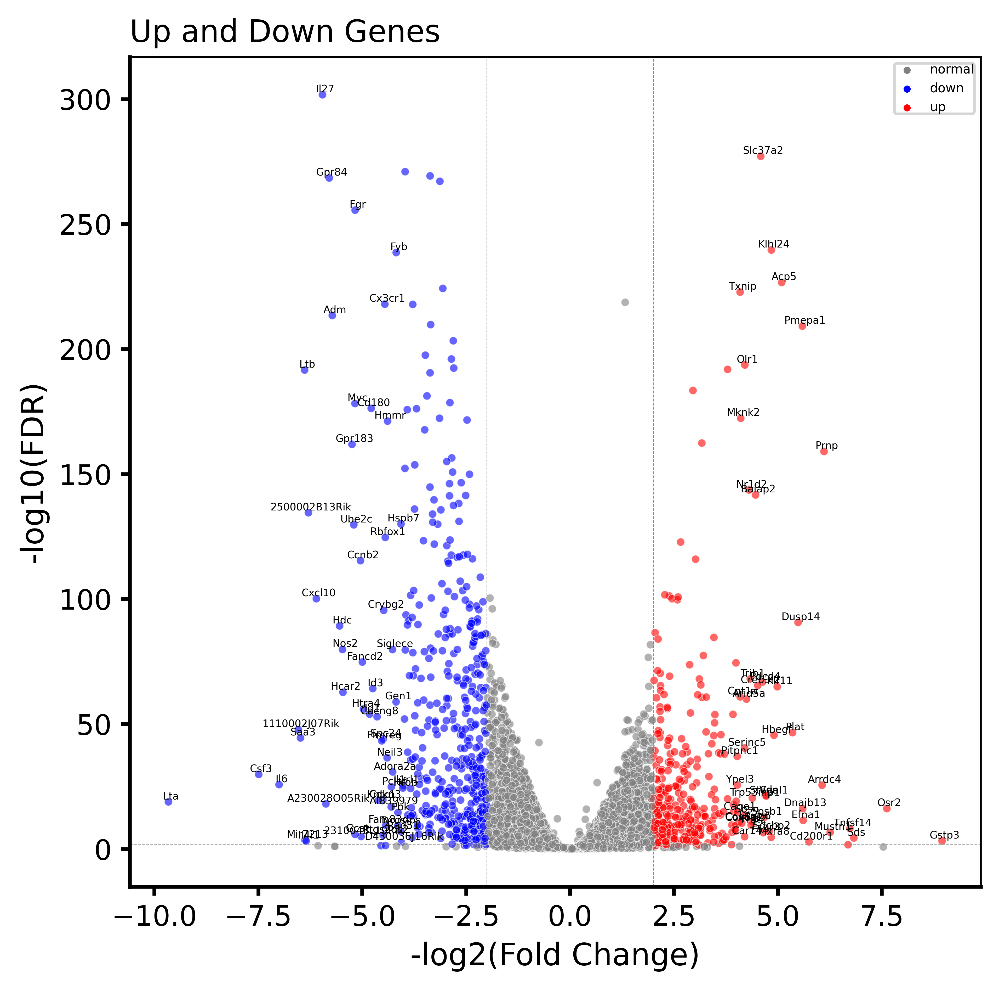

In [8]:
DEGsMCB.volcanoPlot(UpDown, 'Up and Down Genes')

In [9]:
KEGG = DEGsMCB.KEGGEnrichment(UpDown['Geneid'].to_list())

In [10]:
KEGG.head()

,Rank,Term name,P-value,Z-score,Combined score,Overlapping genes,Adjusted p-value,Gene count
0,1,Cell cycle,5.112303e-08,4.724628,79.321924,"[MCM7, GADD45A, PLK1, TTK, CDC25C, CDC20, CCNA...",0.000014,21
1,2,DNA replication,1.267521e-07,10.435268,165.722831,"[RFC5, POLA1, RFC4, MCM7, LIG1, PRIM1, POLD1, ...",0.000017,11
2,3,Cytokine-cytokine receptor interaction,2.149598e-05,2.533439,27.228499,"[CX3CR1, CSF1R, CSF3, IL4RA, IL27, IL6RA, TNF,...",0.001777,29
3,4,NF-kappa B signaling pathway,2.641721e-05,3.931282,41.441588,"[TNFSF14, TNFAIP3, TRAF1, PTGS2, TNF, MALT1, I...",0.001777,15
4,5,p53 signaling pathway,4.127475e-05,4.627785,46.718694,"[CCNB2, CCNB1, RRM2, CCNE2, GADD45A, CDK4, SER...",0.002017,12


In [30]:

class KEGGs:
    def __init__(self, KEGGExp: Optional[pd.DataFrame] = None, 
                 FPKM: Optional[pd.DataFrame] = None) -> None:
        self.KEGGExp = KEGGExp
        self.FPKM = FPKM

    def Pathway2GeneList(self, pathway):
        geneList =  KEGG[KEGG['Term name'] == f'{pathway}']['Overlapping genes'].to_list()
        # NFKBList = [j for i in NFKBList for j in i]
        geneList = list(*geneList)
        signalFPKM = self.FPKM[self.FPKM['Geneid'].str.upper().isin(geneList)].reset_index(drop=True)
        return len(geneList), pathway, signalFPKM
    
    
    
        

In [50]:
TFs

,Rank,Term name,P-value,Z-score,Combined score,Overlapping genes,Adjusted p-value,Gene count
0,2,NFKB1 human,7.324376e-10,3.435751,72.269789,"[SERPINE1, EBI3, LPL, TNFAIP3, NOD2, BRCA2, PT...",1.358672e-07,39
1,5,RELA human,7.104893e-09,3.251550,61.007141,"[SERPINE1, EBI3, LPL, TNFAIP3, BRCA2, PTGS2, T...",5.271831e-07,37
2,35,SP1 human,5.541411e-04,1.895841,14.215186,"[DNMT1, B4GALT1, SERPINE1, COL11A2, PDGFB, LPL...",5.733723e-03,36
3,1,E2F1 human,3.198541e-13,6.398749,184.097831,"[TOP2A, DNMT1, MCM8, UHRF1, SERPINE1, TYMS, TN...",1.186659e-10,29
4,3,TP53 human,1.490412e-09,4.547197,92.418207,"[DNMT1, MCM7, UHRF1, SLC2A1, MKI67, BRCA2, TYM...",1.843142e-07,27
5,4,TRP53 mouse,2.248193e-09,4.449055,88.594654,"[MCM7, UHRF1, SERPINE1, TYMS, PTGS2, CKS1B, CC...",2.085199e-07,27
6,12,NFKB1 mouse,1.498476e-05,2.977401,33.074391,"[NOS2, EBI3, SLC2A1, TNFAIP3, PTGS2, SOD2, TNF...",4.315531e-04,23
7,7,STAT3 human,2.518028e-06,3.753526,48.390590,"[KLF11, FAAH, DNMT1, VDR, PTGS2, SOCS3, ZFP36,...",1.334555e-04,20
8,81,SP1 mouse,1.179751e-02,1.819398,8.077886,"[CSF1R, DNMT1, CEBPD, SERPINE1, SLC2A1, LPL, H...",5.403550e-02,20
9,11,JUN mouse,1.122563e-05,3.640196,41.488444,"[CSF1R, MSR1, SPI1, SRXN1, CEBPD, NOS2, SERPIN...",3.786100e-04,18


In [48]:
# NFKB1 human
NFKB1 = KEGGs(TFs,fpkm).Pathway2GeneList('NFKB1 human')
NFKB1[2]

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2


In [82]:
NFKBList = KEGGs(KEGG,fpkm).Pathway2GeneList('Cytokine-cytokine receptor interaction')
fpkmNFKB = NFKBList[2]
fpkmNFKB

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
0,Ccl25,2.38,2.97,0.50,0.55,4.18,5.20,5.18,7.51
1,Ccl3,76.95,35.91,9778.67,11127.73,2835.11,2825.21,28.17,28.93
2,Ccl4,11.08,5.42,3370.24,3479.21,222.91,182.30,4.37,3.78
3,Ccl9,50.84,31.96,942.39,902.09,229.55,186.44,12.12,13.13
4,Ccr10,2.13,2.21,2.70,2.42,0.62,0.48,0.90,0.78
5,Csf1r,425.29,459.16,150.63,157.98,19.54,16.55,99.19,87.74
6,Csf3,0.00,0.12,280.53,270.28,1.00,2.73,0.08,0.20
7,Cx3cr1,139.40,160.63,68.31,69.68,3.22,4.42,11.71,11.57
8,Cxcl10,3.60,4.06,3774.72,3876.88,53.48,81.35,0.75,0.55
9,Cxcl11,0.06,0.10,188.73,180.58,1.98,2.40,0.03,0.04


,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2,Cluster
Geneid,,,,,,,,,
Map1lc3a,3.03,2.45,2.20,2.07,13.67,15.63,10.84,9.48,1
Nod2,1.15,0.61,10.75,12.72,2.88,3.41,1.68,1.34,1
Ikbke,5.29,5.41,190.02,200.22,24.86,38.04,3.96,3.68,2
Nlrp3,12.56,11.70,285.05,294.79,43.79,71.70,9.34,8.63,2
Pdgfb,8.04,5.94,380.70,378.29,16.37,21.43,3.91,3.26,2


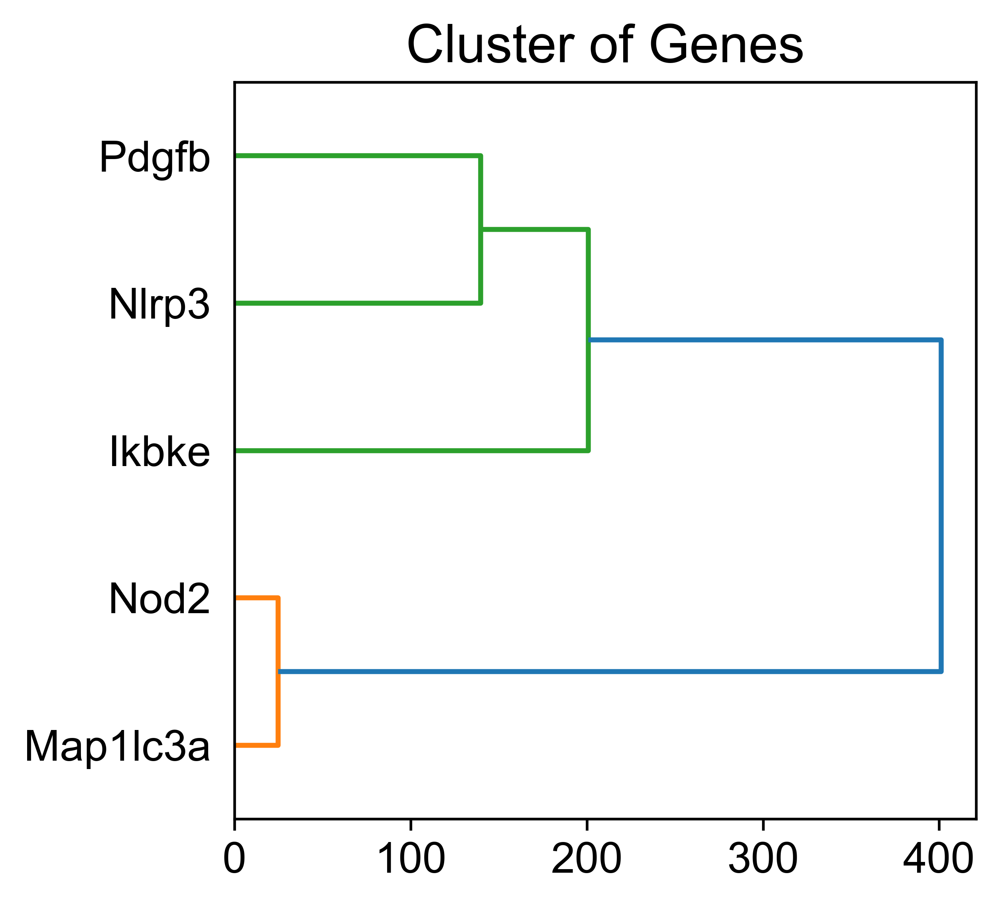

In [34]:
geneList = ['Map1lc3a', 'Nod2', 'Nlrp3', 'Ikbke', 'Pdgfb']
Fgr = FPKMIntersectSet(FPKM=fpkm, MarkerList=geneList)
FgrFPKM = Fgr.FPKMCatch()
Fgr.clusterGenes(FgrFPKM)


5
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMSO vs. LPS: t-test independent samples, P_val:7.216e-04 t=-3.721e+01
LPS vs. LPS-MCB: t-test independent samples, P_val:2.582e-03 t=1.964e+01
LPS vs. MCB: t-test independent samples, P_val:7.105e-04 t=3.750e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMSO vs. LPS: t-test independent samples, P_val:1.787e-01 t=2.036e+00
LPS vs. LPS-MCB: t-test independent samples, P_val:6.102e-03 t=-1.274e+01
LPS vs. MCB: t-test independent samples, P_val:7.168e-03 t=-1.175e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e

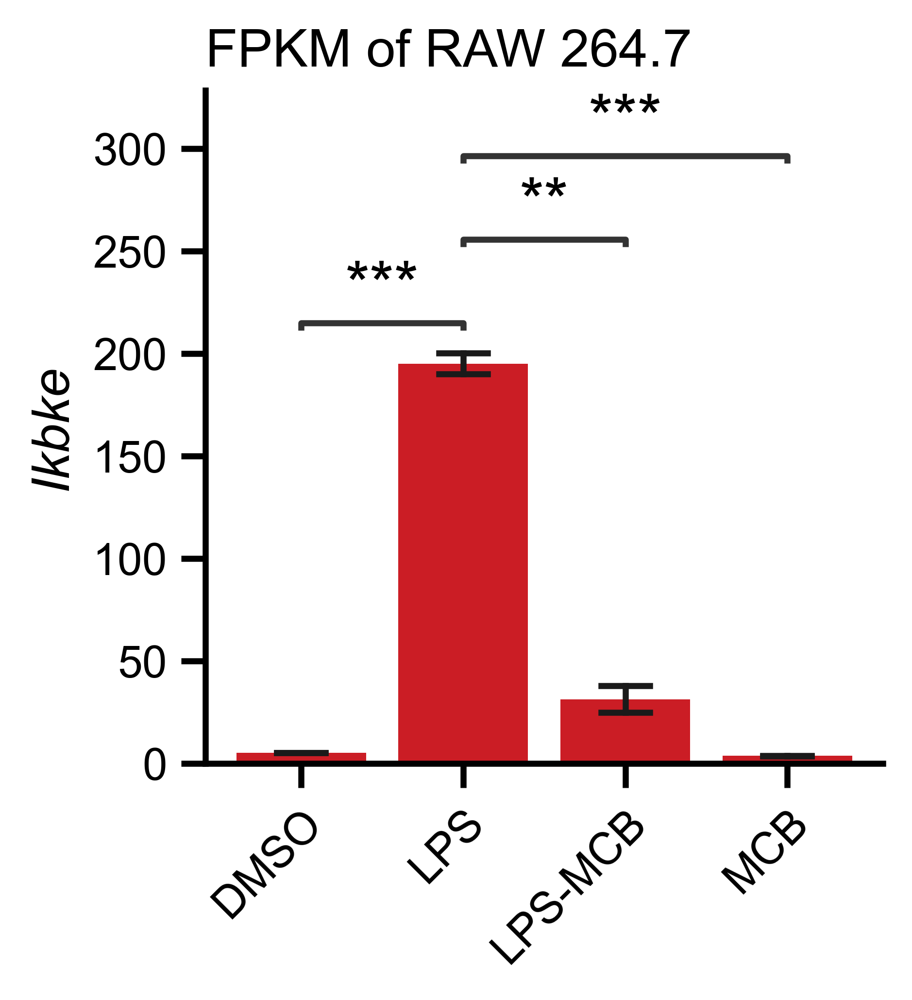

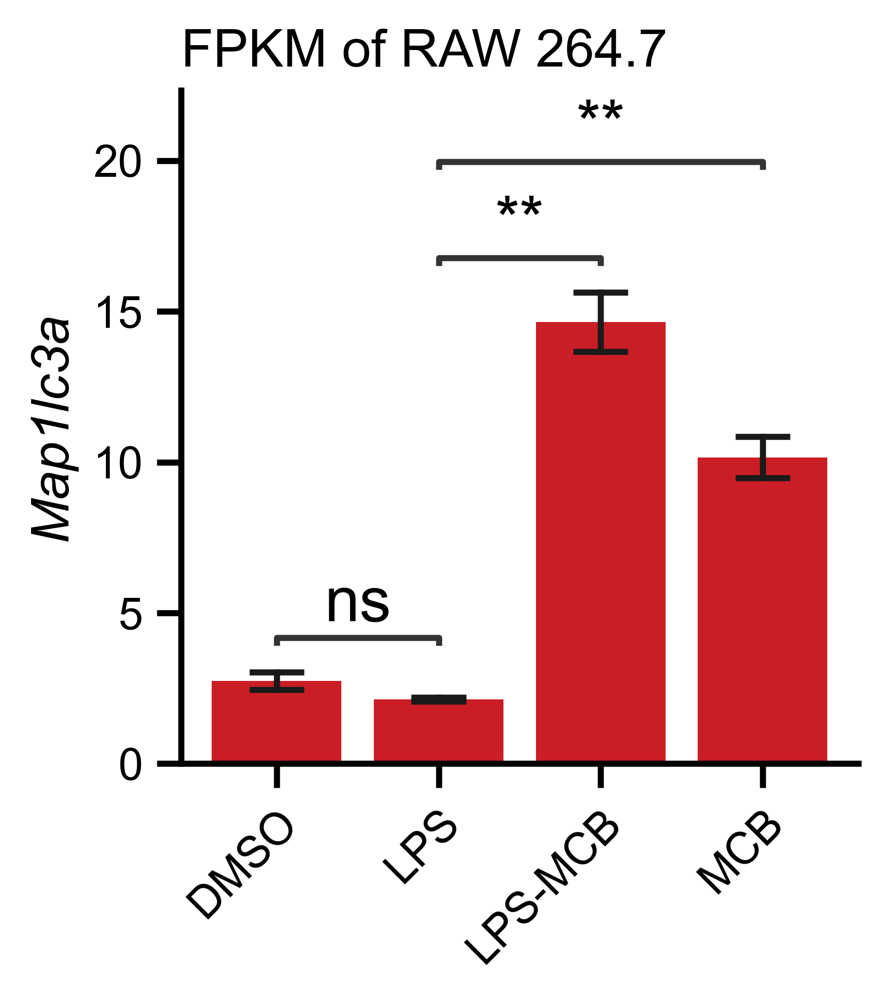

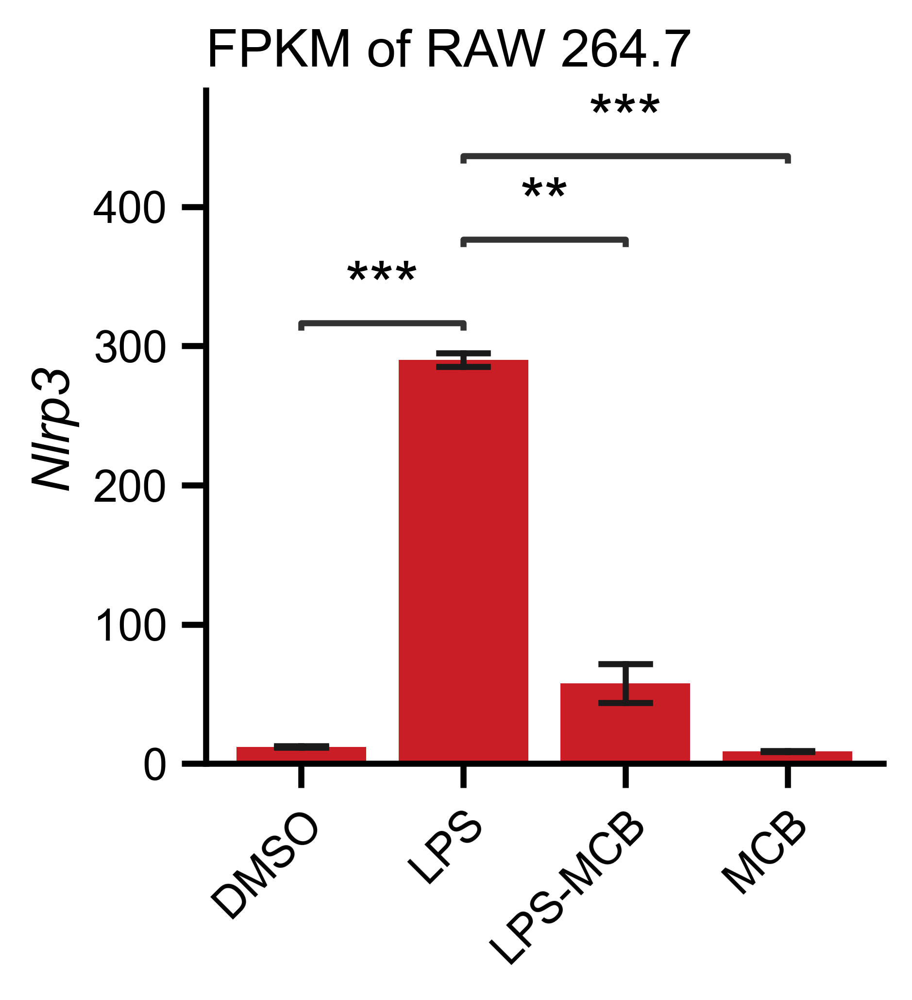

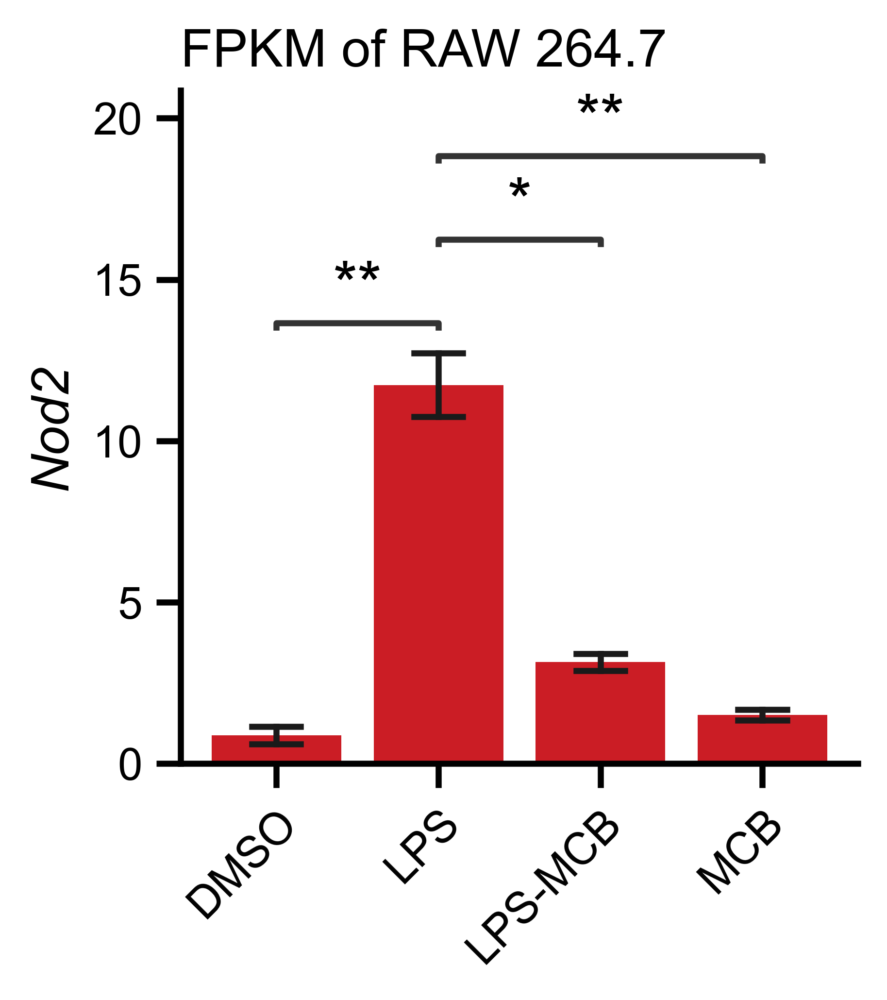

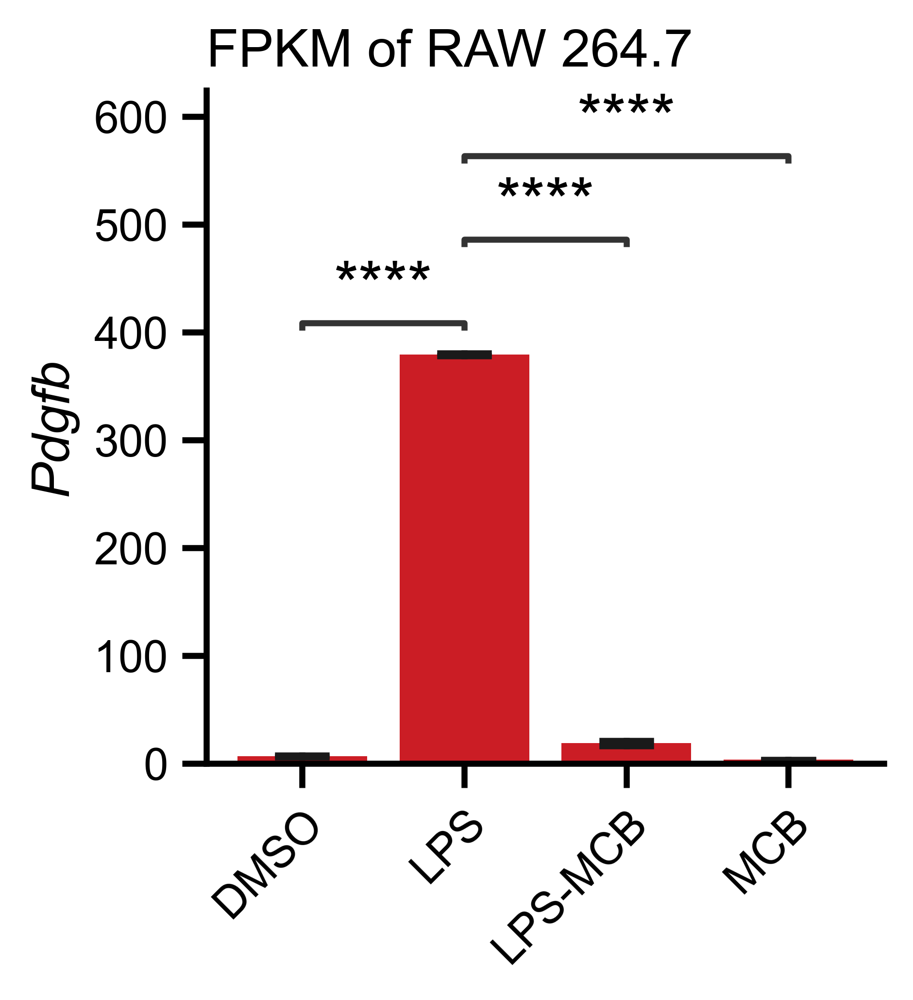

In [35]:
# help(Fgr.barPlotFPKM)
outDir = '/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/barPlot/inflammation'
Fgr.barPlotFPKM(FgrFPKM,outDir)

In [62]:
Fgr.normMatrix(fpkmNFKB).reset_index()

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
0,Ccl25,-0.517756,-0.258604,-1.343531,-1.321569,0.272879,0.720906,0.712121,1.735554
1,Ccl3,-0.763994,-0.773597,1.506067,1.821727,-0.118625,-0.120941,-0.775408,-0.775230
2,Ccl4,-0.617996,-0.621888,1.691606,1.766529,-0.472352,-0.500273,-0.622610,-0.623015
3,Ccl9,-0.663738,-0.714840,1.749376,1.640298,-0.180033,-0.296717,-0.768540,-0.765806
4,Ccr10,0.700247,0.793614,1.365482,1.038700,-1.062042,-1.225433,-0.735260,-0.875309
5,Csf1r,1.543934,1.754555,-0.164044,-0.118338,-0.979230,-0.997823,-0.483925,-0.555127
6,Csf3,-0.582987,-0.581978,1.774678,1.688534,-0.574583,-0.560043,-0.582315,-0.581306
7,Cx3cr1,1.376113,1.737761,0.165110,0.188447,-0.943685,-0.923243,-0.799059,-0.801444
8,Cxcl10,-0.589568,-0.589288,1.700580,1.762621,-0.559276,-0.542351,-0.591298,-0.591420
9,Cxcl11,-0.586019,-0.585517,1.782536,1.680222,-0.561915,-0.556642,-0.586395,-0.586270


,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2,Cluster
Geneid,,,,,,,,,
Il4ra,-0.807673,-0.788570,-0.910348,-0.912736,1.615943,1.556248,0.135508,0.111630,1
Cxcl14,-0.534886,-0.514232,-0.914083,-0.900872,1.745879,1.621030,-0.244627,-0.258209,1
Tnfrsf12a,-0.682544,-0.731000,-0.764283,-0.519066,1.850382,1.566988,-0.420686,-0.299791,1
Tnfsf14,-0.663788,-0.601093,-0.688867,-0.688867,1.818953,1.618327,-0.450624,-0.344041,1
Il6ra,-0.026629,0.353788,-1.616775,-1.717857,0.770074,0.567909,0.834201,0.835288,2
Tnfrsf14,-1.023866,-0.594488,-1.002033,-1.063893,0.628147,0.253351,1.206715,1.596066,2
Ccl25,-0.517756,-0.258604,-1.343531,-1.321569,0.272879,0.720906,0.712121,1.735554,2
Tgfbr1,-0.590230,-0.302572,-1.302838,-1.322451,0.391239,0.405132,1.145525,1.576195,2
Csf1r,1.543934,1.754555,-0.164044,-0.118338,-0.979230,-0.997823,-0.483925,-0.555127,3


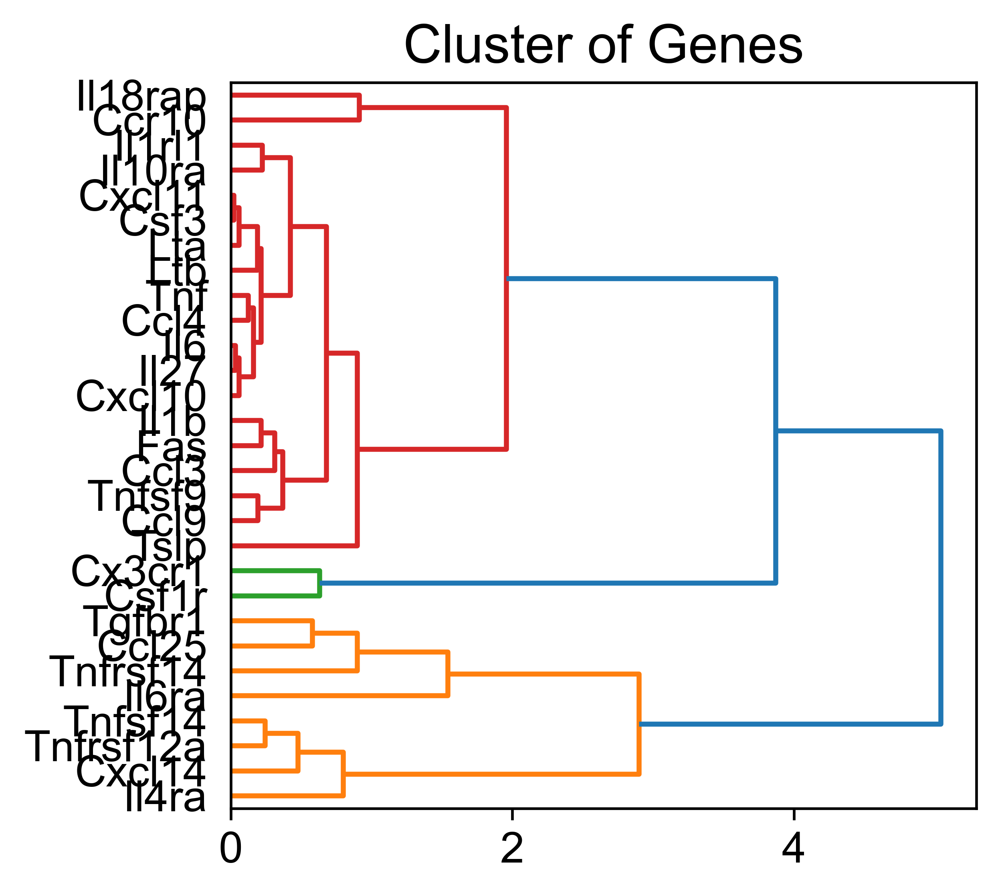

In [63]:
Fgr.clusterGenes(Fgr.normMatrix(fpkmNFKB).reset_index())

In [478]:
MCB_TFs = TFSFPKMMCB[TFSFPKMMCB.loc[:,['MCB_1', 'MCB_2']].apply(np.mean, axis=1)>10].reset_index(drop=True)
MCB_TFs

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2,FC
0,Crebrf,3.61,3.49,0.39,0.49,8.77,8.23,37.89,43.46,92.443182
1,Mxd4,3.16,4.03,0.49,0.43,5.62,2.51,20.10,22.82,46.652174
2,Klf11,3.01,2.55,0.40,0.29,14.57,11.48,12.57,13.75,38.144928
3,Tef,4.32,3.99,0.57,0.77,11.61,7.82,23.18,24.39,35.500000
4,Nr1d2,7.48,10.12,1.51,1.35,36.97,31.38,46.78,53.21,34.961538
5,Mnt,8.61,7.11,0.68,0.79,7.98,6.83,16.08,15.20,21.278912
6,Klf10,20.01,18.99,1.51,1.79,22.41,21.67,28.85,32.44,18.572727
7,Zbtb38,6.25,7.44,1.13,1.04,8.66,7.57,17.35,17.99,16.285714
8,Zfp40,2.97,4.20,1.04,0.97,6.65,8.03,10.35,10.57,10.407960
9,Sp4,2.36,4.01,2.81,2.86,16.11,14.62,17.73,21.64,6.943563


In [467]:
TFsDEGs = list(set(TFs_mm10_list) & set(DEGsSet))
TFsDEGs = [x.upper() for x in TFsDEGs]
TFsFPKM = GeneExpFPKM(TFsDEGs, fpkm)
TFsFPKM['FC'] = TFsFPKM.iloc[:,7:9].apply(np.mean, axis=1)/TFsFPKM.iloc[:,3:5].apply(np.mean, axis=1)
# TFsFPKMMCB = TFsFPKM[TFsFPKM.iloc[:,7:9].apply(np.mean, axis=1)/TFsFPKM.iloc[:,3:5].apply(np.mean, axis=1)].reset_index(drop=True)
# TFsFPKMMCB
TFSFPKMMCB = TFsFPKM.sort_values('FC', ascending=False).reset_index(drop=True)
TFSFPKMMCB

47
47


,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2,FC
0,Crebrf,3.61,3.49,0.39,0.49,8.77,8.23,37.89,43.46,92.443182
1,Mxd4,3.16,4.03,0.49,0.43,5.62,2.51,20.10,22.82,46.652174
2,Klf11,3.01,2.55,0.40,0.29,14.57,11.48,12.57,13.75,38.144928
3,Tef,4.32,3.99,0.57,0.77,11.61,7.82,23.18,24.39,35.500000
4,Nr1d2,7.48,10.12,1.51,1.35,36.97,31.38,46.78,53.21,34.961538
5,Vdr,0.27,0.47,0.10,0.12,3.97,2.90,3.42,4.20,34.636364
6,Osr2,0.28,0.47,0.04,0.06,13.09,9.08,1.14,1.23,23.700000
7,Plag1,0.49,0.83,0.23,0.25,3.24,3.39,5.29,5.79,23.083333
8,Mnt,8.61,7.11,0.68,0.79,7.98,6.83,16.08,15.20,21.278912
9,Zfp30,0.86,0.67,0.12,0.14,0.76,1.11,2.61,2.51,19.692308


In [437]:
kinaseBingGO = GeneExpFPKM(GOTerm, fpkm)
LPSKinase = kinaseBingGO[kinaseBingGO.iloc[:,1:3].apply(np.mean, axis=1) < kinaseBingGO.iloc[:,3:5].apply(np.mean, axis=1)].reset_index(drop=True)
LPSKinase

36
36


,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
0,Actb,1350.49,1285.24,3115.59,3064.07,409.96,443.30,534.09,479.29
1,Bcl2l1,6.52,8.44,95.54,91.85,9.56,10.75,6.04,5.18
2,Dnm1,0.27,0.29,0.25,0.38,2.40,1.50,3.83,4.19
3,Fas,0.21,0.36,25.53,24.80,5.16,7.63,1.00,0.82
4,Fgr,5.91,5.53,75.30,78.63,2.12,3.08,2.22,2.16
5,Flna,89.26,90.75,132.35,142.93,36.99,45.20,42.85,40.90
6,Gadd45a,0.49,0.27,1.56,1.60,8.01,15.97,3.32,3.03
7,Irak3,8.24,7.71,21.00,20.07,4.04,6.48,6.12,6.24
8,Nod2,1.15,0.61,10.75,12.72,2.88,3.41,1.68,1.34
9,Ppp1r15a,17.39,11.19,285.97,309.21,53.34,85.66,15.43,15.20


In [42]:
TFs = DEGsMCB.TFsEnrichment(UpDown['Geneid'].to_list())
TFs

In [26]:
#Enrichr API
import gseapy as gp
names = gp.get_library_name('Mouse')
names

['ARCHS4_Cell-lines',
 'ARCHS4_IDG_Coexp',
 'ARCHS4_Kinases_Coexp',
 'ARCHS4_TFs_Coexp',
 'ARCHS4_Tissues',
 'Achilles_fitness_decrease',
 'Achilles_fitness_increase',
 'Aging_Perturbations_from_GEO_down',
 'Aging_Perturbations_from_GEO_up',
 'Allen_Brain_Atlas_10x_scRNA_2021',
 'Allen_Brain_Atlas_down',
 'Allen_Brain_Atlas_up',
 'Azimuth_2023',
 'Azimuth_Cell_Types_2021',
 'BioCarta_2013',
 'BioCarta_2015',
 'BioCarta_2016',
 'BioPlanet_2019',
 'BioPlex_2017',
 'CCLE_Proteomics_2020',
 'CORUM',
 'COVID-19_Related_Gene_Sets',
 'COVID-19_Related_Gene_Sets_2021',
 'Cancer_Cell_Line_Encyclopedia',
 'CellMarker_2024',
 'CellMarker_Augmented_2021',
 'ChEA_2013',
 'ChEA_2015',
 'ChEA_2016',
 'ChEA_2022',
 'Chromosome_Location',
 'Chromosome_Location_hg19',
 'ClinVar_2019',
 'DSigDB',
 'Data_Acquisition_Method_Most_Popular_Genes',
 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019',
 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019',
 'Descartes_Cell_Types_and_Tissue_2021',
 'Diabetes_Perturbatio

In [95]:
DEGsFilter.head()

,Geneid,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
0,Gstp3,48.514689,8.953148,2.416138,3.705561,0.000211,0.000595
1,Siglech,30.048593,8.261587,2.443449,3.381117,0.000722,0.001868
2,Crtam,28.508771,8.187268,2.452713,3.338046,0.000844,0.002155
3,Lman1l,24.074943,7.942608,2.461598,3.226606,0.001253,0.003109
4,Morn4,19.660826,7.650501,2.481764,3.082687,0.002051,0.004915


In [107]:
print(gp.__file__)

/Users/fenn/anaconda3/lib/python3.8/site-packages/gseapy/__init__.py


In [109]:
from gseapy import Msigdb
msig = Msigdb()
# mouse hallmark gene sets
gmt = msig.get_gmt(category='mh.all', dbver="2023.1.Mm")

In [110]:
# list categories given dbver.
msig.list_category(dbver="2023.1.Hs") # mouse

['c1.all',
 'c2.all',
 'c2.cgp',
 'c2.cp.biocarta',
 'c2.cp.kegg',
 'c2.cp.pid',
 'c2.cp.reactome',
 'c2.cp',
 'c2.cp.wikipathways',
 'c3.all',
 'c3.mir.mir_legacy',
 'c3.mir.mirdb',
 'c3.mir',
 'c3.tft.gtrd',
 'c3.tft.tft_legacy',
 'c3.tft',
 'c4.all',
 'c4.cgn',
 'c4.cm',
 'c5.all',
 'c5.go.bp',
 'c5.go.cc',
 'c5.go.mf',
 'c5.go',
 'c5.hpo',
 'c6.all',
 'c7.all',
 'c7.immunesigdb',
 'c7.vax',
 'c8.all',
 'h.all',
 'msigdb']

In [118]:
gene_sets = gmt

In [116]:
DEGsFilter.head()
MCB_rank = DEGsFilter.loc[:,['Geneid', 'log2FoldChange']]
MCB_rank = MCB_rank.set_index('Geneid')
MCB_rank.shape

(13173, 1)

In [120]:
pre_res = gp.prerank(rnk=MCB_rank, # or rnk = rnk,
                     gene_sets=gene_sets,
                     threads=5,
                     min_size=5,
                     max_size=1000,
                     permutation_num=1000, # reduce number to speed up testing
                     outdir=None, # don't write to disk
                     seed=6,
                     verbose=True, # see what's going on behind the scenes
                    )

2024-07-07 00:00:36,198 [WARNING] Duplicated values found in preranked stats: 1.09% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-07 00:00:36,200 [INFO] Parsing data files for GSEA.............................
2024-07-07 00:00:36,204 [INFO] 0000 gene_sets have been filtered out when max_size=1000 and min_size=5
2024-07-07 00:00:36,205 [INFO] 0050 gene_sets used for further statistical testing.....
2024-07-07 00:00:36,207 [INFO] Start to run GSEA...Might take a while..................
2024-07-07 00:00:38,173 [INFO] Congratulations. GSEApy runs successfully................



In [181]:
down['Geneid'].to_clipboard(index=None)

In [171]:
GSEARes.sort_values('NES', ascending=False)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
11,prerank,HALLMARK_HEME_METABOLISM,0.44832,1.75092,0.0,0.010207,0.018,53/162,18.36%,Slc22a4;Osbp2;Acp5;Ermap;Mocos;Ypel5;Trim10;Sp...
13,prerank,HALLMARK_BILE_ACID_METABOLISM,0.465711,1.622457,0.001712,0.027219,0.09,27/77,19.38%,Gnmt;Slc27a2;Nr3c2;Abcg4;Pipox;Hsd3b7;Crot;Rbp...
15,prerank,HALLMARK_KRAS_SIGNALING_DN,0.445479,1.586968,0.003115,0.028542,0.141,31/88,15.36%,Slc30a3;Slc12a3;P2ry4;Kcnn1;Coq8a;Celsr2;Stag3...
18,prerank,HALLMARK_PANCREAS_BETA_CELLS,0.625464,1.470332,0.054965,0.065069,0.368,4/13,14.27%,Vdr;Mafb;Foxo1;Lmo2
19,prerank,HALLMARK_P53_PATHWAY,0.371475,1.45137,0.005979,0.063737,0.425,49/177,15.75%,Hbegf;Vdr;Baiap2;Mknk2;Txnip;Coq8a;Pitpnc1;Tcn...
28,prerank,HALLMARK_KRAS_SIGNALING_UP,0.338116,1.296197,0.05296,0.204801,0.878,27/136,8.96%,Plvap;Plat;Emp1;Hbegf;Igf2;St6gal1;Dusp6;Trib1...
30,prerank,HALLMARK_ESTROGEN_RESPONSE_EARLY,0.319107,1.220414,0.096241,0.316983,0.975,46/148,20.03%,Cbfa2t3;Celsr1;Scnn1a;Slc27a2;Celsr2;Wwc1;Klf1...
31,prerank,HALLMARK_ESTROGEN_RESPONSE_LATE,0.322895,1.214227,0.093897,0.289481,0.98,27/138,8.98%,Scnn1a;Pdcd4;Slc27a2;Celsr2;Tspan13;Cxcl14;Plx...
36,prerank,HALLMARK_XENOBIOTIC_METABOLISM,0.291739,1.105239,0.267776,0.528242,1.0,38/146,19.62%,Gnmt;Upb1;Ephx1;Crot;Ccl25;Casp6;Esr1;Ptgds;Np...
40,prerank,HALLMARK_ANDROGEN_RESPONSE,0.294502,1.037287,0.379934,0.690162,1.0,17/77,17.43%,Pmepa1;Mertk;Dnajb9;B4galt1;Abhd2;Pgm3;Sgk1;Kr...


In [162]:
GSEARes = pre_res.res2d
GSEARes.index -=1 
GSEARes.head(17)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
1,prerank,HALLMARK_E2F_TARGETS,-0.694542,-2.950212,0.0,0.0,0.0,115/196,18.14%,Myc;Ccnb2;Cdkn3;Spc24;Hmmr;Cdca3;Birc5;Plk1;Ce...
2,prerank,HALLMARK_G2M_CHECKPOINT,-0.678218,-2.839088,0.0,0.0,0.0,103/187,19.29%,Ube2c;Myc;Ccnb2;Cdkn3;Hmmr;Pbk;Ccna2;Polq;Birc...
3,prerank,HALLMARK_MITOTIC_SPINDLE,-0.56778,-2.444456,0.0,0.0,0.0,61/193,13.66%,Ccnb2;Kntc1;Birc5;Kif15;Pif1;Plk1;Dlgap5;Kif2c...
4,prerank,HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION,-0.60582,-2.42038,0.0,0.0,0.0,40/123,7.88%,Mmp14;Il6;Thbs2;Col12a1;Thy1;Col1a2;Tnc;Fn1;Ac...
5,prerank,HALLMARK_INFLAMMATORY_RESPONSE,-0.561592,-2.307872,0.0,0.0,0.0,59/155,12.43%,Lta;Mmp14;Csf3;Il6;Cxcl11;Cxcl10;Cx3cl1;Adm;Ed...
6,prerank,HALLMARK_MYC_TARGETS_V1,-0.541552,-2.297591,0.0,0.0,0.0,107/191,29.96%,Myc;Ccna2;Tyms;Mcm7;Cdc45;Mcm5;Mcm2;Ldha;Cdc20...
7,prerank,HALLMARK_MYC_TARGETS_V2,-0.513979,-1.793745,0.002525,0.002254,0.009,33/58,29.00%,Myc;Plk1;Mcm5;Plk4;Cdk4;Hk2;Utp20;Tmem97;Tcof1...
8,prerank,HALLMARK_UV_RESPONSE_DN,-0.453517,-1.791882,0.0,0.001972,0.009,31/117,15.47%,Col1a2;Myc;Kalrn;Lpar1;Id1;Col1a1;Col5a2;Serpi...
9,prerank,HALLMARK_HYPOXIA,-0.422109,-1.768361,0.0,0.002337,0.012,54/156,15.12%,Il6;Adm;Col5a1;Pdgfb;Bgn;Lox;Atf3;Akap12;Serpi...
10,prerank,HALLMARK_IL6_JAK_STAT3_SIGNALING,-0.470229,-1.761759,0.0,0.002279,0.013,13/68,5.97%,Il6;Cxcl11;Ltb;Cxcl10;Tnf;Socs3;Il18r1;Ebi3;Pi...


In [133]:
print(gp.__file__)

/Users/fenn/anaconda3/lib/python3.8/site-packages/gseapy/__init__.py


In [152]:
help(pre_res.plot)

Help on method plot in module gseapy.base:

plot(terms: Union[str, List[str]], colors: Union[str, List[str], NoneType] = None, legend_kws: Union[Dict[str, Any], NoneType] = None, figsize: Tuple[float, float] = (4, 5), show_ranking: bool = True, ofname: Union[str, NoneType] = None) method of gseapy.gsea.Prerank instance
    terms: str, list.  terms/pathways to show
    colors: str, list. list of colors for each term/pathway
    legend_kws: kwargs to pass to ax.legend. e.g. `loc`, `bbox_to_achor`.
    ofname: savefig



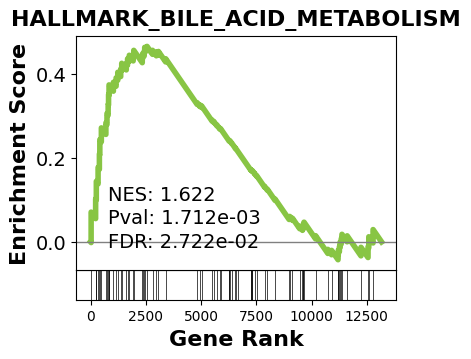

In [177]:
## easy way
terms = pre_res.res2d.Term
axs = pre_res.plot(terms=terms[13],figsize=(4, 3.3), show_ranking=False, ofname='/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/enrichmentRes/preRank/GSEA_BILE_ACID_METABOLISM.pdf') # v1.0.5
# axs = pre_res.plot(terms=terms[10],figsize=(4,3), show_ranking=False) # v1.0.5
# axs = pre_res.plot(terms=terms[14],figsize=(4,3), show_ranking=False) # v1.0.5
axs = pre_res.plot(terms=terms[13],figsize=(4, 3.3), show_ranking=False)

In [103]:
#hallmark GSEA 
#need 2 mins
import gseapy as gp
gene_list = list(DEGsFilter['Geneid'])
enr = gp.enrichr(gene_list=gene_list, # or "./tests/data/gene_list.txt",
                #  gene_sets=['MSigDB_Hallmark_2020','KEGG_2021_Human'],
                 gene_sets=['MSigDB_Hallmark_2020'], # KEGG_2019_Mouse
                #  organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                 organism='mouse',
                 outdir=None, # don't write to disk
                )


In [108]:
enr.res2d.head(5)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,Myc Targets V1,193/200,8.702126e-27,3.203656e-25,0,0,14.486683,869.291223,EIF4A1;RPL34;HNRNPU;HNRNPR;PWP1;PHB2;RPL6;UBE2...
1,MSigDB_Hallmark_2020,Mitotic Spindle,192/199,1.281462e-26,3.203656e-25,0,0,14.410512,859.143354,TRIO;ITSN1;SMC3;SMC4;UXT;PREX1;OPHN1;PPP4R2;KI...
2,MSigDB_Hallmark_2020,E2F Targets,192/200,1.115233e-25,1.858721e-24,0,0,12.607349,724.362362,DCLRE1B;JPT1;NUP107;POP7;TFRC;DSCC1;CSE1L;CCP1...
3,MSigDB_Hallmark_2020,Adipogenesis,191/200,1.263853e-24,1.579816e-23,0,0,11.145672,613.322663,SCARB1;SLC27A1;MTCH2;PHLDB1;ACAA2;ITSN1;ARAF;G...
4,MSigDB_Hallmark_2020,G2-M Checkpoint,190/200,1.282347e-23,1.282347e-22,0,0,9.976354,525.861237,JPT1;CCNT1;CCNF;HNRNPU;ARID4A;MKI67;SMC4;SMC2;...


In [111]:
terms = enr.res2d.Term
axs = enr.plot(terms[:5], show_ranking=False, legend_kws={'loc': (1.05, 0)}, )

AttributeError: 'Enrichr' object has no attribute 'plot'

In [104]:
enr.results.head(80)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,Myc Targets V1,193/200,8.702126e-27,3.203656e-25,0,0,14.486683,8.692912e+02,EIF4A1;RPL34;HNRNPU;HNRNPR;PWP1;PHB2;RPL6;UBE2...
1,MSigDB_Hallmark_2020,Mitotic Spindle,192/199,1.281462e-26,3.203656e-25,0,0,14.410512,8.591434e+02,TRIO;ITSN1;SMC3;SMC4;UXT;PREX1;OPHN1;PPP4R2;KI...
2,MSigDB_Hallmark_2020,E2F Targets,192/200,1.115233e-25,1.858721e-24,0,0,12.607349,7.243624e+02,DCLRE1B;JPT1;NUP107;POP7;TFRC;DSCC1;CSE1L;CCP1...
3,MSigDB_Hallmark_2020,Adipogenesis,191/200,1.263853e-24,1.579816e-23,0,0,11.145672,6.133227e+02,SCARB1;SLC27A1;MTCH2;PHLDB1;ACAA2;ITSN1;ARAF;G...
4,MSigDB_Hallmark_2020,G2-M Checkpoint,190/200,1.282347e-23,1.282347e-22,0,0,9.976354,5.258612e+02,JPT1;CCNT1;CCNF;HNRNPU;ARID4A;MKI67;SMC4;SMC2;...
5,MSigDB_Hallmark_2020,mTORC1 Signaling,185/200,3.536553e-19,2.947128e-18,0,0,6.468638,2.748263e+02,TES;TFRC;PITPNB;CCNF;UBE2D3;ARPC5L;SLA;TMEM97;...
6,MSigDB_Hallmark_2020,DNA Repair,140/150,9.819365e-16,7.013832e-15,0,0,7.322796,2.530539e+02,ARL6IP1;MPG;GTF2B;PNP;CLP1;MPC2;LIG1;GTF2F1;RB...
7,MSigDB_Hallmark_2020,TNF-alpha Signaling via NF-kB,178/200,3.260731e-14,1.811517e-13,0,0,4.236909,1.315740e+02,CD83;CSF2;CSF1;CD80;SERPINE1;TNC;RNF19B;TNF;SA...
8,MSigDB_Hallmark_2020,Oxidative Phosphorylation,178/200,3.260731e-14,1.811517e-13,0,0,4.236909,1.315740e+02,ISCA1;MTRR;ACAA2;ECI1;COX6A1;PHB2;TOMM22;MTRF1...
9,MSigDB_Hallmark_2020,Unfolded Protein Response,107/113,1.565579e-13,7.827897e-13,0,0,9.309748,2.745012e+02,EIF4A2;EIF4A1;POP4;EIF4A3;IFIT1;RRP9;EDC4;RPS1...


In [195]:
TNF_NFkB=geneListMsigDB('TNF-alpha Signaling via NF-kB')
TNF_NFkB

0      MARCKS
1       IL23A
2       NINJ1
3      TNFSF9
4        SIK1
        ...  
195      PLEK
196      CCL5
197      KYNU
198      CCL4
199      CCL2
Name: Geneid, Length: 200, dtype: object

In [33]:
gsea_Term = gp.get_library(name='MSigDB_Hallmark_2020', organism='Mouse')
len(gsea_Term)

50

In [193]:
#geneid在此处需要为列名，而不是index，否则无法使用isin函数
IRGs = DEGs[DEGs['Geneid'].isin(IRGGmouse)].reset_index(drop=True)
IRGs

,Geneid,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
0,Tlr3,28.920301,-1.682987,1.728660,-0.973579,3.302657e-01,4.604942e-01
1,Itgb3,11.675582,-3.778512,2.147948,-1.759126,7.855603e-02,1.517223e-01
2,Cxcl11,2338.967792,-6.177257,0.693534,-8.906933,5.246384e-19,2.620827e-17
3,Cd82,1626.545693,-0.151938,0.232790,-0.652680,5.139624e-01,6.367200e-01
4,Ccr7,6.962690,-2.471751,1.536553,-1.608634,1.076963e-01,1.940695e-01
5,Pvr,2933.814194,1.072075,0.259432,4.132387,3.590159e-05,2.082839e-04
6,Irak2,3383.128715,-0.808311,0.254388,-3.177478,1.485621e-03,5.510722e-03
7,Ptger4,524.925221,1.014936,0.215351,4.712930,2.441797e-06,1.845199e-05
8,Abi1,7162.032989,-0.069527,0.220852,-0.314814,7.529029e-01,8.325796e-01
9,Nlrp3,14580.943945,-2.625932,0.252301,-10.407928,2.281330e-25,1.866250e-23


In [260]:
geneInfla = InflammationGenes['Geneid'].to_list() + ['Il1a', 'Il1b'] + ['Txnip', 'Hspa4l', 'Itm2c', 'Oga', 'Klhl24', 'B4galt1', 'Slc25a30',
       'Nbr1', 'Rmnd5a', 'Pnrc1', 'Atg12', 'Atg14', 'Tgfbr1', 'Aoc2','Pdcd4']
print(len(geneInfla))


74


In [136]:
genExp = pd.read_csv('gene_fpkm_VB12_LPS_All.csv', index_col=0)
genExpFil = genExp.loc[geneInfla,]
genExpFil.to_csv('/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/DEGs/DEGs_markerInflammation_55.csv')

FileNotFoundError: [Errno 2] No such file or directory: 'gene_fpkm_VB12_LPS_All.csv'

In [94]:
DEGsFilter = DEGsFilter.sort_values('log2FoldChange', ascending=False).reset_index(drop=True)
DEGsFilter

,Geneid,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
0,Gstp3,48.514689,8.953148,2.416138,3.705561,2.109230e-04,5.950433e-04
1,Siglech,30.048593,8.261587,2.443449,3.381117,7.219170e-04,1.868134e-03
2,Crtam,28.508771,8.187268,2.452713,3.338046,8.436970e-04,2.154780e-03
3,Lman1l,24.074943,7.942608,2.461598,3.226606,1.252677e-03,3.108949e-03
4,Morn4,19.660826,7.650501,2.481764,3.082687,2.051409e-03,4.914706e-03
...,...,...,...,...,...,...,...
13168,Il6,180.099397,-7.000070,0.641771,-10.907423,1.062252e-27,1.819917e-26
13169,Csf3,3549.125337,-7.489687,0.637487,-11.748767,7.165649e-32,1.517473e-30
13170,Mmp14,54.753099,-7.873780,1.509480,-5.216219,1.826118e-07,7.734358e-07
13171,Cd300e,39.368493,-8.846444,2.434097,-3.634385,2.786449e-04,7.704483e-04


In [223]:
MCC = pd.read_csv('./DEGsInflammation/cytoHubbaMCCscores.csv')
hubGene1 = MCC['node_name'].to_list()[:37]
len(hubGene1)

37

In [225]:
genExp = pd.read_csv('gene_fpkm_VB12_LPS_All.csv', index_col=0)
genExpFil = genExp.loc[hubGene1,]
genExpFil.to_csv('DEGs_Inflammation_hubGene_37.csv')
geneMarkers = genExpFil.T
geneMarkers

Geneid,Il6,Il1b,Il1a,Il10,Icam1,Cxcl10,Ccl5,Il18,Tlr2,Cd40,...,Edn1,Ccrl2,Olr1,Tnfsf9,Ripk2,Myc,Msr1,Lyn,Tnfsf15,Lif
DMSO1,0.00,0.22,0.12,0.00,34.78,0.64,0.33,16.84,110.40,1.24,...,0.00,1.17,0.00,19.05,16.05,0.07,25.88,56.37,0.00,0.00
DMSO2,0.00,0.09,0.08,0.00,38.75,4.06,1.38,13.37,58.76,0.36,...,0.00,0.13,0.00,24.92,16.23,0.05,28.70,39.55,0.01,0.13
DMSO3,0.00,0.09,0.08,0.00,38.75,4.06,1.38,13.37,58.76,0.36,...,0.00,0.13,0.00,24.92,16.23,0.05,28.70,39.55,0.01,0.13
LPS-1h,0.00,2.13,3.82,0.05,84.96,199.91,16.24,8.39,170.57,3.29,...,0.11,30.99,0.29,198.59,11.49,6.86,61.55,49.16,0.08,4.13
LPS-2h,2.83,26.79,17.09,2.15,144.47,1025.74,459.22,10.43,426.62,14.55,...,7.00,62.31,4.83,279.25,24.29,26.14,60.25,70.01,4.48,79.37
LPS-3h,29.08,420.91,124.34,0.59,165.31,2748.54,1646.38,32.04,250.17,84.93,...,5.21,78.92,2.53,104.69,54.34,21.93,102.01,93.47,14.23,315.51
RAW-LPS_1,16.10,163.97,123.47,1.07,593.18,3774.72,952.95,34.59,295.78,82.04,...,1.61,65.78,4.18,477.70,49.00,48.49,97.47,62.98,0.66,244.06
RAW_LPS_2,17.22,176.04,125.05,0.54,611.19,3876.88,991.43,30.15,289.69,89.05,...,1.57,71.13,3.46,457.09,51.13,51.04,99.73,62.41,0.42,254.33
RAW-LPS_3,59.14,2445.63,730.47,5.48,371.14,588.07,600.96,13.81,296.98,104.84,...,17.74,33.56,10.48,98.62,98.70,89.00,88.18,88.59,18.63,874.94
RAW-LPS-MyD88,1.69,356.30,76.79,2.29,92.62,50.14,735.57,16.55,292.13,71.61,...,11.85,4.43,10.94,44.74,28.21,38.02,10.31,28.35,0.32,228.43


In [249]:
geneMarkersFilter = geneMarkers.loc[['LPS-1h', 'LPS-2h', 'LPS-3h','RAW-LPS_1', 'RAW_LPS_2', 'RAW-LPS_3','MCB1','MCB2', 'LPS-MCB1', 'LPS-MCB2'],]
geneMarkersFilter['label'] = 'MCB'
geneMarkersFilter.loc[['LPS-1h', 'LPS-2h', 'LPS-3h','RAW-LPS_1', 'RAW_LPS_2', 'RAW-LPS_3'],'label'] = 'LPS'
geneMarkersFilter.to_csv('randomForestPredict/markerGenes_37.csv')
# geneMarkersFilter

In [196]:
InflammationGenes = IRGs[IRGs['padj']<0.05].sort_values('log2FoldChange').reset_index(drop=True)
InflammationGenes = InflammationGenes[InflammationGenes['log2FoldChange'].abs()>1].reset_index(drop=True)
InflammationGenes

,Geneid,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
0,Lta,311.026950,-9.121364,1.682721,-5.420604,5.939793e-08,6.161714e-07
1,Tnfsf15,416.072346,-7.949453,2.020978,-3.933469,8.372875e-05,4.427634e-04
2,Il6,386.221924,-7.869074,0.851741,-9.238812,2.492497e-20,1.400048e-18
3,Mmp14,60.214471,-7.782002,1.501854,-5.181596,2.199947e-07,2.042282e-06
4,Edn1,163.749075,-7.594079,1.957569,-3.879342,1.047396e-04,5.379204e-04
5,Csf3,4044.515316,-7.455257,0.364857,-20.433366,8.447319e-93,2.059288e-89
6,Ccl20,10.292564,-6.676651,2.824481,-2.363851,1.808609e-02,4.604247e-02
7,Lpar1,43.960298,-6.318130,1.385147,-4.561342,5.082774e-06,3.612474e-05
8,Cxcl11,2338.967792,-6.177257,0.693534,-8.906933,5.246384e-19,2.620827e-17
9,Cxcl10,33661.727238,-5.618966,0.654308,-8.587651,8.876547e-18,3.769903e-16


In [215]:
InflammationGenes.sort_values('Geneid').reset_index(drop=True)

,Geneid,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
0,Adm,1284.327604,-5.208182,0.730359,-7.130992,9.964841e-13,2.208390e-11
1,Aqp9,156.227396,2.369365,0.666071,3.557227,3.747910e-04,1.670321e-03
2,Axl,49.351817,-4.080991,1.223949,-3.334281,8.552015e-04,3.415482e-03
3,Calcrl,4483.082022,-2.467745,0.472589,-5.221759,1.772317e-07,1.677234e-06
4,Ccl17,40.981919,-3.841147,1.076623,-3.567774,3.600273e-04,1.615748e-03
5,Ccl20,10.292564,-6.676651,2.824481,-2.363851,1.808609e-02,4.604247e-02
6,Ccl22,18031.404034,-2.617061,0.587008,-4.458304,8.261071e-06,5.597231e-05
7,Ccl5,11565.432485,1.004765,0.277383,3.622298,2.919977e-04,1.336523e-03
8,Ccrl2,1565.465727,-2.533201,0.464832,-5.449710,5.045210e-08,5.314539e-07
9,Cd14,18059.353332,-1.388863,0.314087,-4.421901,9.783623e-06,6.502322e-05


In [35]:
enr.results.head(20)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,G2-M Checkpoint,55/200,3.385969e-36,1.625265e-34,0,0,12.636885,1032.097672,TOP2A;H2AX;KIF11;MKI67;BRCA2;SMC4;SMC2;KIF15;C...
1,MSigDB_Hallmark_2020,E2F Targets,54/200,4.252609e-35,1.020626e-33,0,0,12.300185,973.472862,TOP2A;H2AX;MCM7;HMGB2;MKI67;BRCA2;SMC4;CKS1B;C...
2,MSigDB_Hallmark_2020,Mitotic Spindle,35/199,1.108172e-16,1.773075e-15,0,0,6.865016,252.211424,TOP2A;PIF1;TUBD1;TTK;KIF11;BRCA2;SMC4;KIF15;AB...
3,MSigDB_Hallmark_2020,Inflammatory Response,33/200,5.834974e-15,7.001969e-14,0,0,6.334240,207.604115,CSF3;RGS16;SERPINE1;EBI3;LPAR1;ADM;NOD2;CX3CL1...
4,MSigDB_Hallmark_2020,TNF-alpha Signaling via NF-kB,30/200,1.319115e-12,1.266350e-11,0,0,5.627712,153.940760,PPP1R15A;CEBPD;SERPINE1;TNC;TNFAIP2;TNFAIP3;PT...
5,MSigDB_Hallmark_2020,Hypoxia,27/200,2.083674e-10,1.666939e-09,0,0,4.951655,110.380905,PPP1R15A;SERPINE1;PDGFB;SLC2A1;TNFAIP3;ADM;ENO...
6,MSigDB_Hallmark_2020,Epithelial Mesenchymal Transition,22/200,3.992904e-07,2.737991e-06,0,0,3.888193,57.286991,POSTN;TPM4;MCM7;SERPINE1;FN1;BGN;TNC;TNFAIP3;T...
7,MSigDB_Hallmark_2020,Allograft Rejection,21/200,1.567142e-06,9.402854e-06,0,0,3.684490,49.247841,IL10;SPI1;IGSF6;NOS2;CFP;TNF;MMP9;FGR;IL6;IL18...
8,MSigDB_Hallmark_2020,IL-6/JAK/STAT3 Signaling,12/87,1.819186e-05,9.702327e-05,0,0,4.978839,54.341715,SOCS3;CXCL10;IL6;CXCL11;ITGA4;IL1B;EBI3;HMOX1;...
9,MSigDB_Hallmark_2020,Interferon Gamma Response,19/200,2.061567e-05,9.895522e-05,0,0,3.285652,35.450413,SAMD9L;IL10RA;TNFAIP2;ARID5B;TNFAIP3;ISG15;IFI...


In [137]:
genExp = pd.read_csv(FPKMDir + 'gene_fpkm_VB12_LPS_All.csv', index_col=0)
genExp

,DMSO1,DMSO2,DMSO3,RAW-Fe68,LPS-1h,LPS-2h,LPS-3h,LPS_1,LPS_2,RAW-LPS_3,...,RAW-LPS-TRIF,RAW-LPS-TRIF.1,MCB1,MCB2,LPS-MCB1,LPS-MCB2,RAW-MCB-MyD88,RAW-MCB-TLR4,RAW-LPS-L68,RAW-L68
Geneid,,,,,,,,,,,,,,,,,,,,,
0610005C13Rik,0.26,0.04,0.08,0.17,0.11,0.05,0.23,0.23,0.18,0.11,...,0.05,0.00,0.14,0.18,0.10,0.11,0.11,0.11,0.07,0.09
0610009B22Rik,26.39,25.77,24.26,20.67,17.47,12.64,11.30,14.60,12.51,10.59,...,12.92,13.63,15.55,13.06,5.06,9.60,7.35,15.10,6.37,22.51
0610009E02Rik,0.19,0.18,0.27,0.25,0.00,0.03,0.08,0.16,0.06,0.00,...,0.04,0.04,0.20,0.22,0.04,0.00,0.08,0.16,0.00,0.25
0610009L18Rik,0.76,0.59,0.30,0.16,0.19,0.51,0.31,0.21,0.24,0.78,...,0.28,0.98,0.42,0.00,0.27,0.10,0.50,0.41,0.13,0.24
0610010F05Rik,11.72,11.60,10.35,10.99,10.87,9.35,9.37,12.66,13.09,13.14,...,11.66,12.29,7.54,7.49,3.28,3.91,8.21,9.79,8.99,9.19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zyx,4.42,1.91,1.98,2.22,12.74,14.10,17.19,8.40,8.07,14.08,...,14.37,13.15,2.57,2.34,4.56,5.23,3.67,12.04,5.52,3.87
Zzef1,9.45,7.87,7.16,8.20,6.88,3.66,4.35,4.82,5.17,4.97,...,6.65,6.66,8.47,8.65,6.98,5.66,4.81,3.52,3.66,5.55
Zzz3,21.17,14.33,14.39,17.78,13.50,14.92,10.15,24.60,24.59,18.48,...,25.15,25.63,28.13,30.24,27.68,25.08,28.40,23.28,31.20,31.10


In [227]:
genExp = pd.read_csv(FPKMDir + 'gene_fpkm_VB12_LPS_All.csv', index_col=0)
MCC = pd.read_csv('./DEGsInflammation/cytoHubbaMCCscores.csv')
hubGeneAll = MCC['node_name'].to_list()
genExpFil = genExp.loc[hubGeneAll,]
genExpFil
# genExpFil.to_csv('DEGs_Inflammation_hubGene_37.csv')

,DMSO1,DMSO2,DMSO3,LPS-1h,LPS-2h,LPS-3h,RAW-LPS_1,RAW_LPS_2,RAW-LPS_3,RAW-LPS-MyD88,...,MCB1,MCB2,LPS-MCB1,LPS-MCB2,RAW-MCB-MyD88,RAW-MCB-TLR4,RAW-L68C,RAW-LPS-L68,RAW-L68,RAW-Fe68
Geneid,,,,,,,,,,,,,,,,,,,,,
Il6,0.00,0.00,0.00,0.00,2.83,29.08,16.10,17.22,59.14,1.69,...,0.00,0.00,0.10,0.22,12.20,12.32,0.00,60.36,0.30,0.04
Il1b,0.22,0.09,0.09,2.13,26.79,420.91,163.97,176.04,2445.63,356.30,...,0.00,0.15,32.25,57.03,45.42,71.67,0.00,10.16,1.28,0.04
Il1a,0.12,0.08,0.08,3.82,17.09,124.34,123.47,125.05,730.47,76.79,...,0.37,0.17,366.59,506.18,92.14,96.06,0.35,54.52,4.31,0.29
Il10,0.00,0.00,0.00,0.05,2.15,0.59,1.07,0.54,5.48,2.29,...,0.00,0.10,0.09,0.10,1.71,0.54,0.00,1.55,0.75,0.00
Icam1,34.78,38.75,38.75,84.96,144.47,165.31,593.18,611.19,371.14,92.62,...,46.67,45.97,205.99,247.91,400.83,631.09,41.74,354.16,323.43,55.59
Cxcl10,0.64,4.06,4.06,199.91,1025.74,2748.54,3774.72,3876.88,588.07,50.14,...,0.75,0.55,53.48,81.35,469.24,1231.92,3.60,8476.55,243.57,18.40
Ccl5,0.33,1.38,1.38,16.24,459.22,1646.38,952.95,991.43,600.96,735.57,...,0.78,0.13,1940.30,2154.88,2905.98,3347.30,1.23,1846.20,25.55,3.36
Il18,16.84,13.37,13.37,8.39,10.43,32.04,34.59,30.15,13.81,16.55,...,4.37,4.31,12.75,12.05,30.50,42.88,13.57,11.21,20.04,12.59
Tlr2,110.40,58.76,58.76,170.57,426.62,250.17,295.78,289.69,296.98,292.13,...,78.48,77.27,128.97,156.74,100.13,145.11,72.96,216.74,261.73,80.33


In [16]:
fpkmMCB = pd.read_csv(os.path.join(FPKMDir + '/gene_fpkm_LPS_MCB.csv'))
fpkmMCB

,Geneid,RAW-LPS,RAW-LPS-MyD88,RAW-LPS-TRIF,RAW-MCB-MyD88,RAW-MCB-TLR4
0,0610005C13Rik,0.11,0.11,0.00,0.11,0.11
1,0610009B22Rik,10.59,18.17,13.63,7.35,15.10
2,0610009E02Rik,0.00,0.40,0.04,0.08,0.16
3,0610009L18Rik,0.78,4.12,0.98,0.50,0.41
4,0610010F05Rik,13.14,5.56,12.29,8.21,9.79
...,...,...,...,...,...,...
25234,Zyx,14.08,20.81,13.15,3.67,12.04
25235,Zzef1,4.97,2.04,6.66,4.81,3.52
25236,Zzz3,18.48,12.52,25.63,28.40,23.28
25237,a,0.00,0.45,0.09,0.00,0.19


In [133]:
KEGGGene = ['CXCL10', 'JUN', 'CD40', 'CD80', 'TLR7', 'CD14', 'TNF','Egr1']
KEGGGene = [x.capitalize() for x in KEGGGene]
KEGGGene

['Cxcl10', 'Jun', 'Cd40', 'Cd80', 'Tlr7', 'Cd14', 'Tnf', 'Egr1']

In [134]:
marker = fpkmMCB[fpkmMCB['Geneid'].isin(KEGGGene)].reset_index(drop=True)
marker

,Geneid,RAW-DMSO,RAW-LPS,RAW-MCB1,RAW-MCB2,RAW-LPS-MCB1,RAW-LPS-MCB2,RAW-L68C,RAW-LPS-L68,RAW-L68,RAW-Fe68
0,Cd14,189.46,940.74,47.94,40.14,316.01,409.57,197.71,499.79,268.74,184.79
1,Cd40,0.36,89.05,5.08,4.35,30.21,42.17,0.81,41.65,25.52,2.76
2,Cd80,0.13,2.19,1.36,1.10,1.61,3.24,0.19,2.08,1.47,0.44
3,Cxcl10,4.06,3876.88,0.75,0.55,53.48,81.35,3.60,8476.55,243.57,18.40
4,Egr1,0.74,12.30,6.92,7.42,19.15,31.12,0.99,167.51,753.76,7.67
5,Jun,10.02,5.08,3.12,2.88,11.70,18.38,14.66,50.05,505.83,12.42
6,Tlr7,43.97,16.48,13.99,11.67,7.61,10.33,57.83,34.01,63.59,55.50
7,Tnf,28.52,4780.37,4.49,4.57,298.62,438.11,25.98,9848.25,227.99,45.28


In [87]:
# pip install enrichrpy

from enrichrpy import Enrichr

# 输入差异基因列表
gene_list = up['Geneid']

# 创建Enrichr对象
enrichr = Enrichr()

# 进行转录因子富集分析
enrichment_results = enrichr.get_transcription_factor_enrichment(gene_list)

# 打印结果
for result in enrichment_results:
    print(result)

ImportError: cannot import name 'Enrichr' from 'enrichrpy' (/home/pku/miniconda3/lib/python3.8/site-packages/enrichrpy/__init__.py)

In [1]:
import pandas as pd
import gseapy as gp
import matplotlib.pyplot as plt

In [49]:
names = gp.get_library_name('Mouse')
names

['ARCHS4_Cell-lines',
 'ARCHS4_IDG_Coexp',
 'ARCHS4_Kinases_Coexp',
 'ARCHS4_TFs_Coexp',
 'ARCHS4_Tissues',
 'Achilles_fitness_decrease',
 'Achilles_fitness_increase',
 'Aging_Perturbations_from_GEO_down',
 'Aging_Perturbations_from_GEO_up',
 'Allen_Brain_Atlas_10x_scRNA_2021',
 'Allen_Brain_Atlas_down',
 'Allen_Brain_Atlas_up',
 'Azimuth_2023',
 'Azimuth_Cell_Types_2021',
 'BioCarta_2013',
 'BioCarta_2015',
 'BioCarta_2016',
 'BioPlanet_2019',
 'BioPlex_2017',
 'CCLE_Proteomics_2020',
 'CORUM',
 'COVID-19_Related_Gene_Sets',
 'COVID-19_Related_Gene_Sets_2021',
 'Cancer_Cell_Line_Encyclopedia',
 'CellMarker_Augmented_2021',
 'ChEA_2013',
 'ChEA_2015',
 'ChEA_2016',
 'ChEA_2022',
 'Chromosome_Location',
 'Chromosome_Location_hg19',
 'ClinVar_2019',
 'DSigDB',
 'Data_Acquisition_Method_Most_Popular_Genes',
 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019',
 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019',
 'Descartes_Cell_Types_and_Tissue_2021',
 'Diabetes_Perturbations_GEO_2022',
 'DisG

In [56]:
# 'GO_Biological_Process_2023'
# 'GO_Molecular_Function_2021',
# 'GO_Cellular_Component_2023',

go_mf = gp.get_library(name='KEGG_2019_Mouse', organism='Mouse')

In [52]:
GOTerm = pd.DataFrame({'Term': go_mf.keys(), 'Genes':go_mf.values()})
GOTerm.to_csv('KEGGMm2019.csv', index=None)


In [53]:
DEG=DEGs.sort_values('log2FoldChange', ascending=False).reset_index(drop=True)
DEG.head()

,Geneid,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
0,Olr1,82.354412,9.895499,2.406600,4.111818,0.000039,0.000231
1,Lman1l,31.939145,8.527759,2.470289,3.452131,0.000556,0.002369
2,Ttc16,19.773974,7.840397,2.522400,3.108308,0.001882,0.006819
3,Fendrr,29.378050,6.978798,1.622214,4.302019,0.000017,0.000110
4,Gsto2,28.556976,6.901088,1.622867,4.252406,0.000021,0.000133


In [66]:
glist = DEG['Geneid'].squeeze().str.strip().to_list()
glist[:10]

['Olr1',
 'Lman1l',
 'Ttc16',
 'Fendrr',
 'Gsto2',
 'Mapk15',
 'Acpp',
 'Apoa4',
 'Fabp2',
 'Slc25a48']

In [69]:
enr2 = gp.enrich(gene_list= glist, # or gene_list=glist
                 gene_sets=[go_mf], # kegg is a dict object
                 background=None, # or "hsapiens_gene_ensembl", or int, or text file, or a list of genes
                 outdir='annoRes',
                 verbose=True)

2024-03-06 19:22:20,579 [INFO] Input dict object named with gs_ind_0
2024-03-06 19:22:20,580 [INFO] Run: gs_ind_0 
2024-03-06 19:22:20,615 [INFO] Background is not set! Use all 8551 genes in gs_ind_0.
2024-03-06 19:22:20,636 [INFO] Save enrichment results for gs_ind_0 
2024-03-06 19:22:20,835 [INFO] Done.


In [70]:
enr2.results.sort_values(['Adjusted P-value'])

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes
1,gs_ind_0,Allograft rejection,13/63,9.806154e-24,2.028675e-22,266.713454,14130.220611,H2-Q1;H2-Q6;H2-Q4;H2-Q2;H2-D1;H2-T23;H2-Q10;H2...
10,gs_ind_0,Graft-versus-host disease,13/64,1.229500e-23,2.028675e-22,261.503712,13795.066004,H2-Q1;H2-Q6;H2-Q4;H2-Q2;H2-D1;H2-T23;H2-Q10;H2...
30,gs_ind_0,Type I diabetes mellitus,13/69,3.601590e-23,3.961748e-22,238.221239,12310.816685,H2-Q1;H2-Q6;H2-Q4;H2-Q2;H2-D1;H2-T23;H2-Q10;H2...
3,gs_ind_0,Autoimmune thyroid disease,13/78,2.038509e-22,1.681770e-21,205.270319,10252.154955,H2-Q1;H2-Q6;H2-Q4;H2-Q2;H2-D1;H2-T23;H2-Q10;H2...
32,gs_ind_0,Viral myocarditis,13/87,9.385886e-22,6.194685e-21,180.280695,8728.770279,H2-Q1;H2-Q6;H2-Q4;H2-Q2;H2-D1;H2-T23;H2-Q10;H2...
2,gs_ind_0,Antigen processing and presentation,13/90,1.503425e-21,8.268839e-21,173.240607,8306.287874,H2-Q1;H2-Q6;H2-Q4;H2-Q2;H2-D1;H2-T23;H2-Q10;H2...
23,gs_ind_0,Phagosome,14/180,2.064237e-19,9.731405e-19,97.125325,4178.754567,H2-Q1;H2-Q6;H2-Q4;H2-Q2;H2-D1;H2-T23;H2-Q10;C3...
16,gs_ind_0,Kaposi sarcoma-associated herpesvirus infection,14/216,2.814825e-18,1.161115e-17,79.514897,3213.326741,H2-Q1;H2-Q6;H2-Q4;H2-Q2;H2-D1;H2-T23;H2-Q10;C3...
31,gs_ind_0,Viral carcinogenesis,14/229,6.474448e-18,2.373964e-17,74.601547,2952.629874,H2-Q1;H2-Q6;H2-Q4;H2-Q2;H2-D1;H2-T23;H2-Q10;C3...
4,gs_ind_0,Cell adhesion molecules (CAMs),13/170,8.471218e-18,2.795502e-17,84.438655,3319.271505,H2-Q1;H2-Q6;H2-Q4;H2-Q2;H2-D1;H2-T23;H2-Q10;H2...


In [84]:
enr = gp.enrichr(gene_list=up['Geneid'], # or "./tests/data/gene_list.txt",
                 gene_sets=['GO_Biological_Process_2023',  'GO_Molecular_Function_2023'],
                 organism='mouse', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk
                )

In [255]:
DEGs = pd.concat([up,down],axis=0).reset_index(drop=True)
DEGs.to_csv('/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/DEGs/DEGs_LPS3-MCB2_Sig.csv', index=None)
DEGs

,Geneid,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
0,Gstp3,48.514689,8.953148,2.416138,3.705561,2.109230e-04,5.950433e-04
1,Siglech,30.048593,8.261587,2.443449,3.381117,7.219170e-04,1.868134e-03
2,Crtam,28.508771,8.187268,2.452713,3.338046,8.436970e-04,2.154780e-03
3,Lman1l,24.074943,7.942608,2.461598,3.226606,1.252677e-03,3.108949e-03
4,Morn4,19.660826,7.650501,2.481764,3.082687,2.051409e-03,4.914706e-03
...,...,...,...,...,...,...,...
1206,Ska2,257.692818,-2.016067,0.754084,-2.673532,7.505711e-03,1.598615e-02
1207,Gemin6,248.826079,-2.011772,0.237937,-8.455066,2.789301e-17,2.711226e-16
1208,Eno1b,6433.765868,-2.008963,0.122975,-16.336318,5.444257e-60,2.757996e-58
1209,Fancb,183.173534,-2.005601,0.271928,-7.375484,1.637487e-13,1.217092e-12


In [11]:
KEGGPathway = pd.read_csv('KEGG_2019_mouse_top30.csv')
KEGGPathway['Term'].to_list()

['DNA replication',
 'Cell cycle',
 'Cytokine-cytokine receptor interaction',
 'TNF signaling pathway',
 'Homologous recombination',
 'C-type lectin receptor signaling pathway',
 'p53 signaling pathway',
 'NF-kappa B signaling pathway',
 'Chemokine signaling pathway',
 'IL-17 signaling pathway',
 'HIF-1 signaling pathway',
 'Transcriptional misregulation in cancer',
 'Salmonella infection',
 'Toll-like receptor signaling pathway',
 'JAK-STAT signaling pathway']

In [265]:
enr.results.head(15)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,G2-M Checkpoint,55/200,3.385969e-36,1.625265e-34,0,0,12.636885,1032.097672,TOP2A;H2AX;KIF11;MKI67;BRCA2;SMC4;SMC2;KIF15;C...
1,MSigDB_Hallmark_2020,E2F Targets,54/200,4.252609e-35,1.020626e-33,0,0,12.300185,973.472862,TOP2A;H2AX;MCM7;HMGB2;MKI67;BRCA2;SMC4;CKS1B;C...
2,MSigDB_Hallmark_2020,Mitotic Spindle,35/199,1.108172e-16,1.773075e-15,0,0,6.865016,252.211424,TOP2A;PIF1;TUBD1;TTK;KIF11;BRCA2;SMC4;KIF15;AB...
3,MSigDB_Hallmark_2020,Inflammatory Response,33/200,5.834974e-15,7.001969e-14,0,0,6.334240,207.604115,CSF3;RGS16;SERPINE1;EBI3;LPAR1;ADM;NOD2;CX3CL1...
4,MSigDB_Hallmark_2020,TNF-alpha Signaling via NF-kB,30/200,1.319115e-12,1.266350e-11,0,0,5.627712,153.940760,PPP1R15A;CEBPD;SERPINE1;TNC;TNFAIP2;TNFAIP3;PT...
5,MSigDB_Hallmark_2020,Hypoxia,27/200,2.083674e-10,1.666939e-09,0,0,4.951655,110.380905,PPP1R15A;SERPINE1;PDGFB;SLC2A1;TNFAIP3;ADM;ENO...
6,MSigDB_Hallmark_2020,Epithelial Mesenchymal Transition,22/200,3.992904e-07,2.737991e-06,0,0,3.888193,57.286991,POSTN;TPM4;MCM7;SERPINE1;FN1;BGN;TNC;TNFAIP3;T...
7,MSigDB_Hallmark_2020,Allograft Rejection,21/200,1.567142e-06,9.402854e-06,0,0,3.684490,49.247841,IL10;SPI1;IGSF6;NOS2;CFP;TNF;MMP9;FGR;IL6;IL18...
8,MSigDB_Hallmark_2020,IL-6/JAK/STAT3 Signaling,12/87,1.819186e-05,9.702327e-05,0,0,4.978839,54.341715,SOCS3;CXCL10;IL6;CXCL11;ITGA4;IL1B;EBI3;HMOX1;...
9,MSigDB_Hallmark_2020,Interferon Gamma Response,19/200,2.061567e-05,9.895522e-05,0,0,3.285652,35.450413,SAMD9L;IL10RA;TNFAIP2;ARID5B;TNFAIP3;ISG15;IFI...


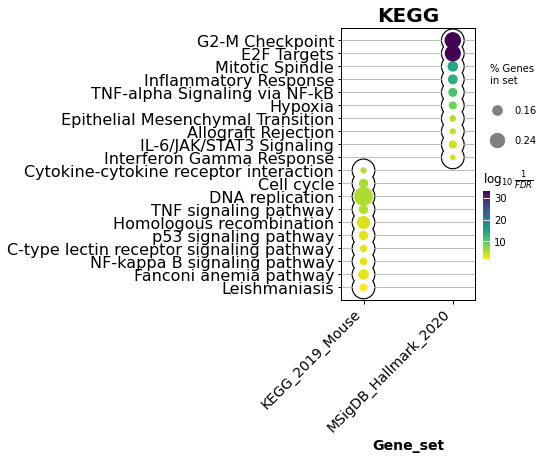

In [273]:
# simple plotting function
from gseapy import barplot, dotplot
# categorical scatterplot
ax = dotplot(enr.results,
              column="Adjusted P-value",
              x='Gene_set', # set x axis, so you could do a multi-sample/library comparsion
              size=10,
              top_term=10,
              figsize=(3,5),
              title = "KEGG",
              xticklabels_rot=45, # rotate xtick labels
              show_ring=True, # set to False to revmove outer ring
              marker='o',
             )

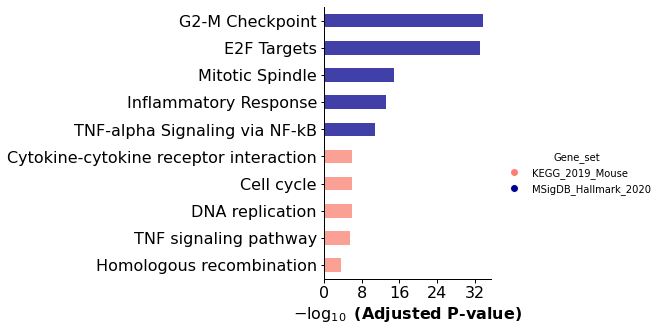

In [267]:
# categorical scatterplot
ax = barplot(enr.results,
              column="Adjusted P-value",
              group='Gene_set', # set group, so you could do a multi-sample/library comparsion
              size=10,
              top_term=5,
              figsize=(3,5),
              #color=['darkred', 'darkblue'] # set colors for group
              color = {'KEGG_2021_Human': 'salmon', 'MSigDB_Hallmark_2020':'darkblue'}
             )

,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2,Cluster
Geneid,,,,,,,,,
Bcl2a1d,-0.675603,-0.689109,1.611715,1.780363,-0.427993,-0.112601,-0.731752,-0.755020,1
Traf1,-0.658008,-0.663679,1.615531,1.798910,-0.449415,-0.202939,-0.718692,-0.721708,1
Il1b,-0.767932,-0.766645,1.577288,1.749922,-0.306669,0.047753,-0.767932,-0.765786,1
Tnfaip3,-0.735546,-0.754427,1.648925,1.705351,-0.267406,-0.055433,-0.770518,-0.770947,1
Bcl2a1b,-0.699209,-0.720591,1.671567,1.710081,-0.402938,-0.071926,-0.732302,-0.754681,1
Ptgs2,-0.733945,-0.733512,1.695183,1.682472,-0.367394,-0.074167,-0.734571,-0.734066,1
Ltb,-0.501472,-0.465348,1.737847,1.720427,-0.631298,-0.620480,-0.614062,-0.625614,2
Bcl2l1,-0.609515,-0.557995,1.779171,1.680157,-0.527942,-0.496011,-0.622395,-0.645471,2
Lta,-0.574206,-0.582182,1.812352,1.648835,-0.582182,-0.575003,-0.573408,-0.574206,2


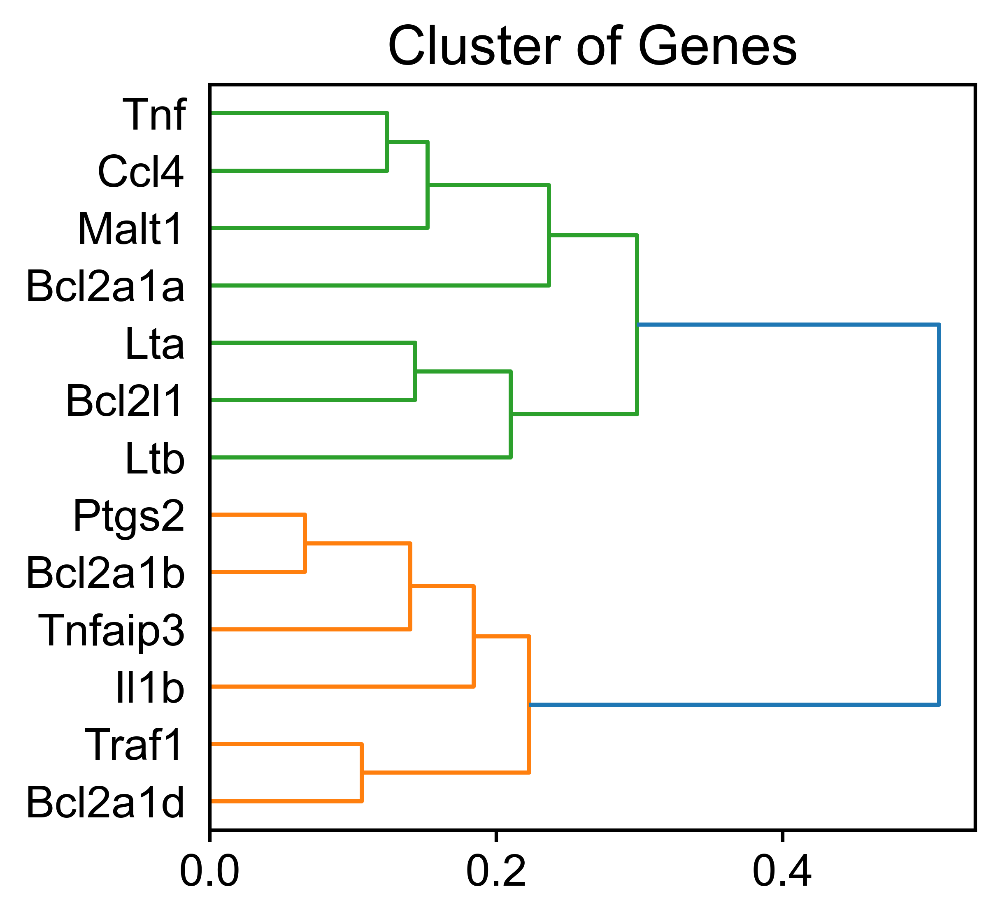

In [444]:
normSignal = normMatrix(signal.set_index('Geneid'),1)
# normSignal
clusterSignal = clusterSample(normSignal.reset_index())
clusterSignal

In [445]:
clusterSignal.iloc[:,:-1]

,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
Geneid,,,,,,,,
Bcl2a1d,-0.675603,-0.689109,1.611715,1.780363,-0.427993,-0.112601,-0.731752,-0.755020
Traf1,-0.658008,-0.663679,1.615531,1.798910,-0.449415,-0.202939,-0.718692,-0.721708
Il1b,-0.767932,-0.766645,1.577288,1.749922,-0.306669,0.047753,-0.767932,-0.765786
Tnfaip3,-0.735546,-0.754427,1.648925,1.705351,-0.267406,-0.055433,-0.770518,-0.770947
Bcl2a1b,-0.699209,-0.720591,1.671567,1.710081,-0.402938,-0.071926,-0.732302,-0.754681
Ptgs2,-0.733945,-0.733512,1.695183,1.682472,-0.367394,-0.074167,-0.734571,-0.734066
Ltb,-0.501472,-0.465348,1.737847,1.720427,-0.631298,-0.620480,-0.614062,-0.625614
Bcl2l1,-0.609515,-0.557995,1.779171,1.680157,-0.527942,-0.496011,-0.622395,-0.645471
Lta,-0.574206,-0.582182,1.812352,1.648835,-0.582182,-0.575003,-0.573408,-0.574206


[0.5 1.5 2.5 3.5 4.5 5.5 6.5 7.5]


Index(['Bcl2a1d', 'Traf1', 'Il1b', 'Tnfaip3', 'Bcl2a1b', 'Ptgs2', 'Ltb',
       'Bcl2l1', 'Lta', 'Bcl2a1a', 'Malt1', 'Ccl4', 'Tnf'],
      dtype='object', name='Geneid')

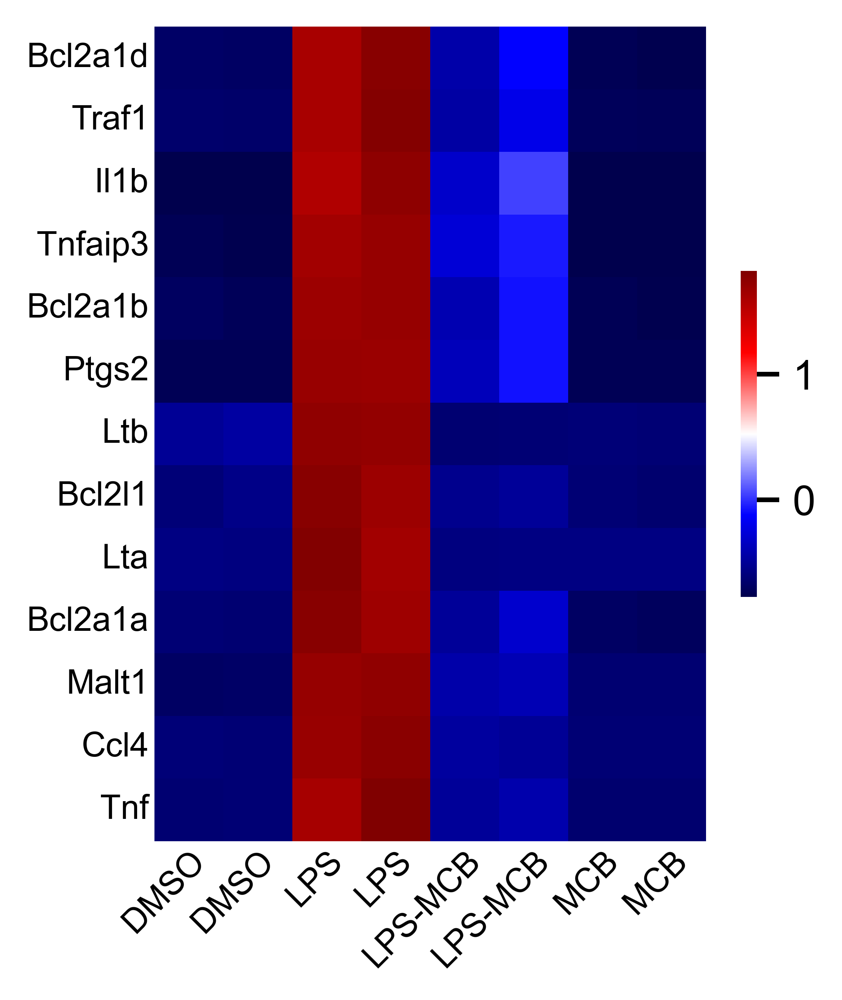

In [449]:
heatmapPlot(clusterSignal.iloc[:,:-1])
clusterSignal.index

,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2,Cluster
Geneid,,,,,,,,,
Bcl2a1d,-0.675603,-0.689109,1.611715,1.780363,-0.427993,-0.112601,-0.731752,-0.755020,1
Traf1,-0.658008,-0.663679,1.615531,1.798910,-0.449415,-0.202939,-0.718692,-0.721708,1
Il1b,-0.767932,-0.766645,1.577288,1.749922,-0.306669,0.047753,-0.767932,-0.765786,1
Tnfaip3,-0.735546,-0.754427,1.648925,1.705351,-0.267406,-0.055433,-0.770518,-0.770947,1
Bcl2a1b,-0.699209,-0.720591,1.671567,1.710081,-0.402938,-0.071926,-0.732302,-0.754681,1
Ptgs2,-0.733945,-0.733512,1.695183,1.682472,-0.367394,-0.074167,-0.734571,-0.734066,1
Ltb,-0.501472,-0.465348,1.737847,1.720427,-0.631298,-0.620480,-0.614062,-0.625614,2
Bcl2l1,-0.609515,-0.557995,1.779171,1.680157,-0.527942,-0.496011,-0.622395,-0.645471,2
Lta,-0.574206,-0.582182,1.812352,1.648835,-0.582182,-0.575003,-0.573408,-0.574206,2


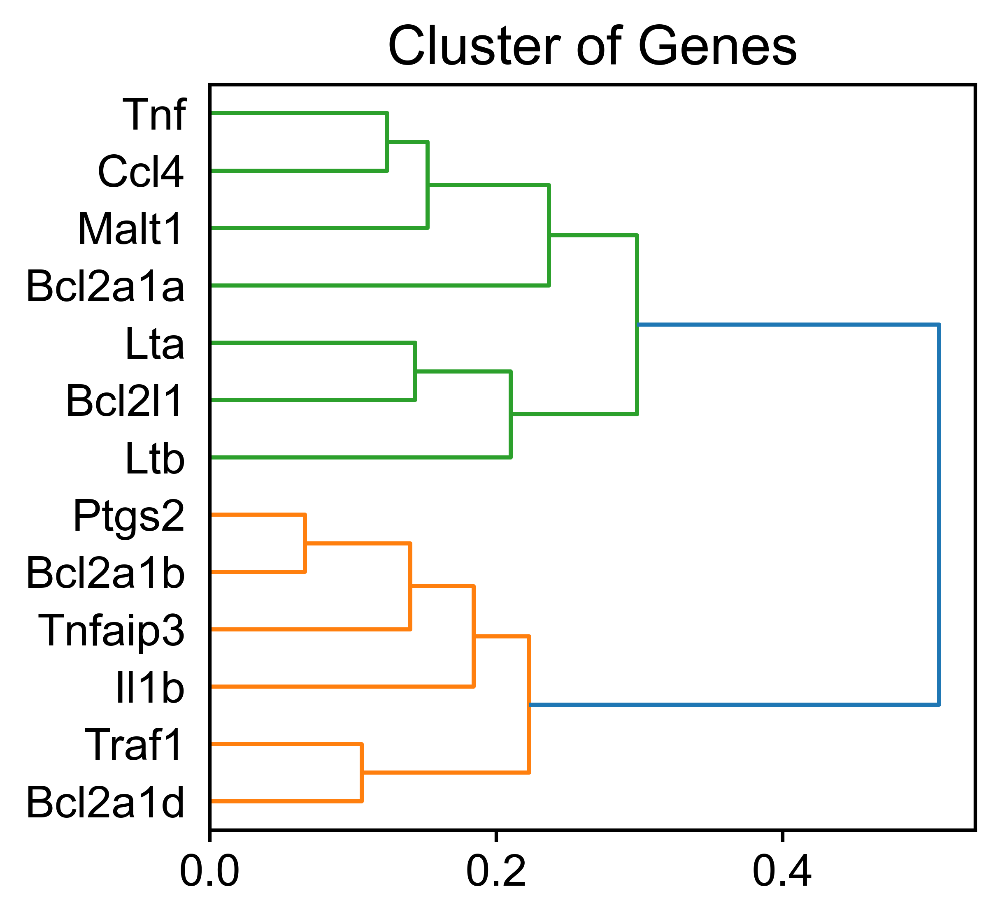

In [457]:
clusterSample(normMatrix(kegg.set_index('Geneid'),1).reset_index())

12
10


,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2,Cluster
Geneid,,,,,,,,,
Pdgfb,8.04,5.94,380.70,378.29,16.37,21.43,3.91,3.26,1
Csf3,0.00,0.12,280.53,270.28,1.00,2.73,0.08,0.20,1
Socs3,6.19,9.15,174.08,177.18,27.38,38.27,3.63,3.37,1
Ptpn6,167.88,148.56,100.17,104.27,25.93,26.65,44.47,45.11,4
Bcl2l1,6.52,8.44,95.54,91.85,9.56,10.75,6.04,5.18,2
Il10ra,24.89,24.63,77.02,80.15,17.08,20.79,18.75,15.36,2
Il6,0.00,0.00,16.10,17.22,0.10,0.22,0.00,0.00,3
Tslp,0.66,0.18,10.48,8.10,0.68,1.37,2.51,2.07,3
Myc,0.21,0.05,48.49,51.04,1.75,1.58,0.00,0.00,3


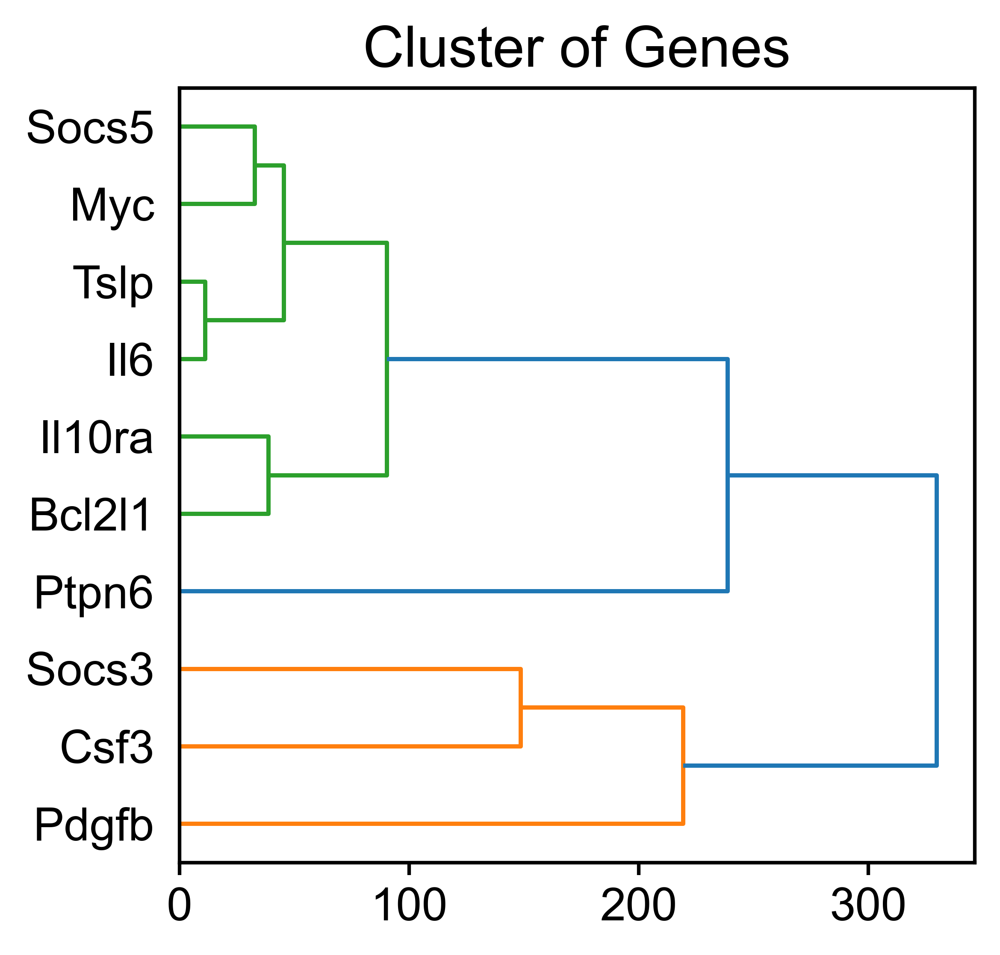

In [29]:
# dataKEGG = enr.res2d.head(30)
# kegg = KEGGGeneExp(dataKEGG,'NF-kappa B signaling pathway',fpkm)
# kegg = KEGGGeneExp(dataKEGG, 'Cytokine-cytokine receptor interaction', fpkm)
# kegg = KEGGGeneExp(dataKEGG, 'TNF signaling pathway', fpkm)
# kegg = KEGGGeneExp(dataKEGG, 'C-type lectin receptor signaling pathway', fpkm)
kegg = KEGGGeneExp(KEGGPathway, 'JAK-STAT signaling pathway', fpkm)
clusterSample(kegg)

,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2,Cluster
Geneid,,,,,,,,,
Ptpn6,1.635737,1.263943,0.332728,0.411628,-1.095944,-1.082088,-0.739161,-0.726844,7
Socs5,-0.039654,-0.122994,1.656719,1.654926,-0.881119,-0.681282,-0.775376,-0.811221,6
Tslp,-0.720045,-0.853168,2.003437,1.343367,-0.714498,-0.523133,-0.206965,-0.328995,5
Socs3,-0.689470,-0.647578,1.686640,1.730513,-0.389573,-0.235449,-0.725701,-0.729381,4
Il10ra,-0.390530,-0.400742,1.656821,1.779749,-0.697260,-0.551554,-0.631673,-0.764811,3
Il6,-0.584295,-0.584295,1.652840,1.808466,-0.570400,-0.553726,-0.584295,-0.584295,1
Myc,-0.595040,-0.602549,1.670618,1.790283,-0.522772,-0.530750,-0.604895,-0.604895,1
Csf3,-0.582987,-0.581978,1.774678,1.688534,-0.574583,-0.560043,-0.582315,-0.581306,2
Bcl2l1,-0.609515,-0.557995,1.779171,1.680157,-0.527942,-0.496011,-0.622395,-0.645471,2


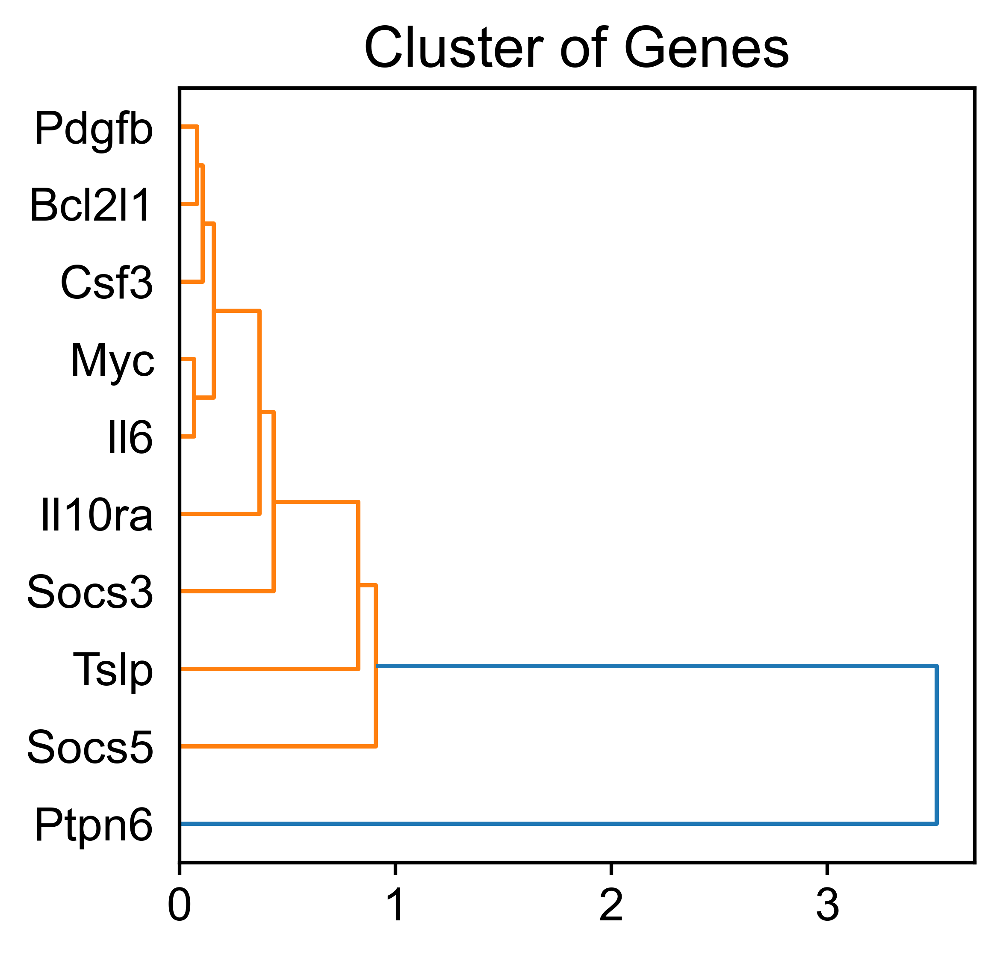

In [31]:
clusterSample(normMatrix(kegg.loc[:,:'MCB_2'].set_index('Geneid'), 1).reset_index())

In [210]:
relA_ChIPBase = pd.read_table('/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/TFs/ChIPBase-ChIPBase3ID54860_RELA_protein_regulations_all_2024_05_12_pm_36_06.txt')
# relA_ChIPBase = pd.read_excel('/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/TFs/ChIPBase-ChIPBase3ID54860_RELA_protein_regulations_all_2024_05_12_pm_37_22.xls')
relA_ChIPBaseGenes = list(set(relA_ChIPBase['Gene Symbol']))
print(len(relA_ChIPBaseGenes))
len(DEGsList)

878


1211

,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2,Cluster
Geneid,,,,,,,,,
Cxcl10,3.60,4.06,3774.72,3876.88,53.48,81.35,0.75,0.55,1
Tnf,25.98,28.52,4401.55,4780.37,298.62,438.11,4.49,4.57,1
Ptgs2,0.96,1.14,1010.05,1004.77,153.23,275.04,0.70,0.91,2
Bcl2a1d,24.17,21.50,476.35,509.69,73.12,135.47,13.07,8.47,2
Dnmt1,150.08,149.70,52.97,56.07,16.63,15.70,33.30,31.73,2
Myc,0.21,0.05,48.49,51.04,1.75,1.58,0.00,0.00,2
Bcl2,2.02,2.27,0.82,0.70,3.69,3.82,2.50,2.33,2
Fas,0.21,0.36,25.53,24.80,5.16,7.63,1.00,0.82,2
Igf2bp2,6.48,4.86,17.50,17.68,4.78,4.61,3.01,2.73,2


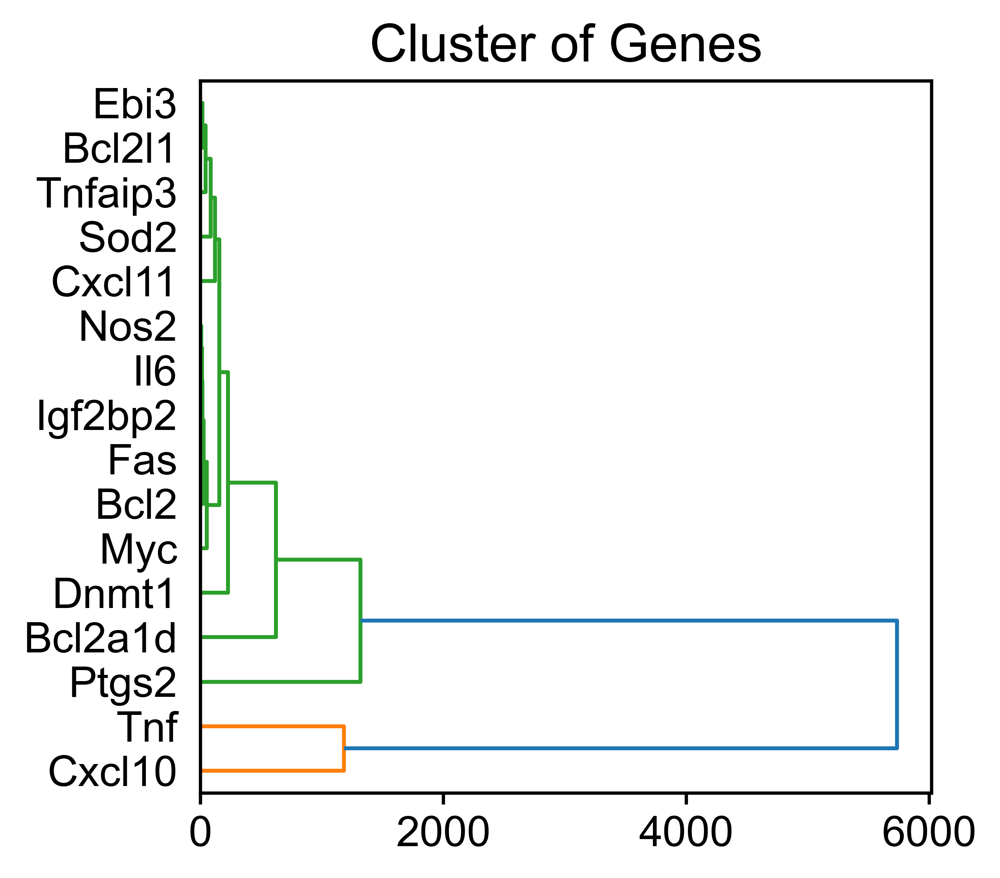

In [211]:
clusterSample(TargetsDEGs)

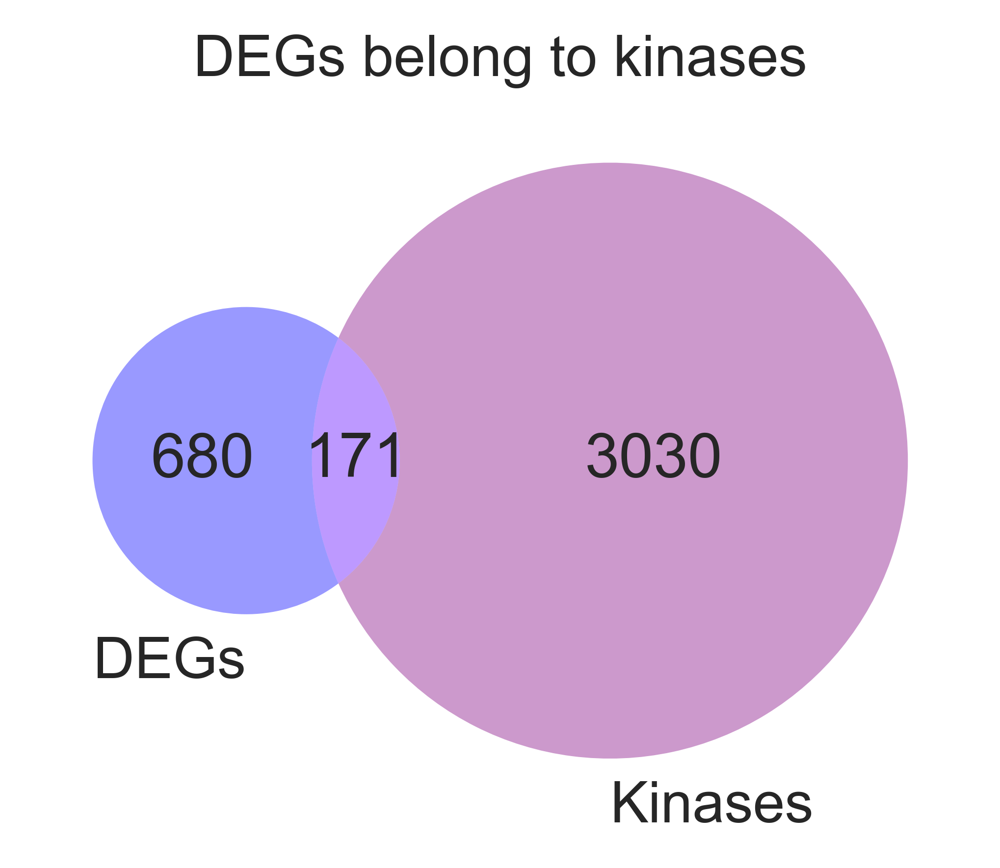

In [562]:
Venn_2_Plot(DEGsSet, set(kinaseAllList), 'DEGs', 'Kinases','DEGs belong to kinases', kinaseDir, 'DEGs down-regulated by MCB belong to kinases')

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif'] = ['Arial Unicode MS']

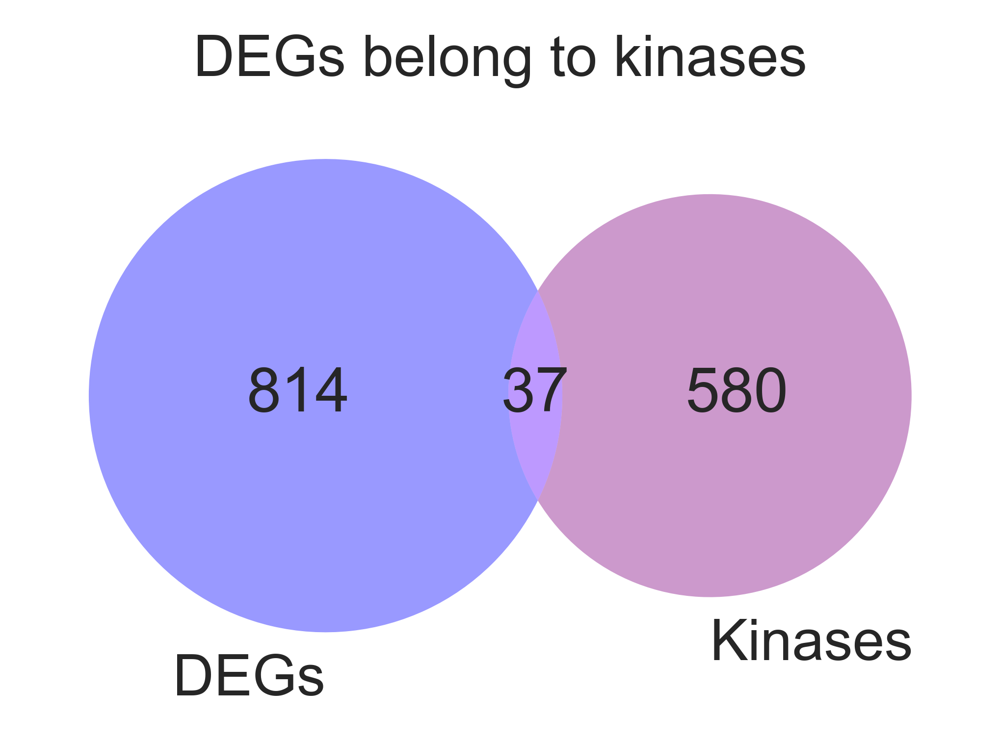

In [546]:
Venn_2_Plot(DEGsSet, set(kinaseList), 'DEGs', 'Kinases','DEGs belong to kinases', kinaseDir, 'DEGs down-regulated by MCB belong to kinase')

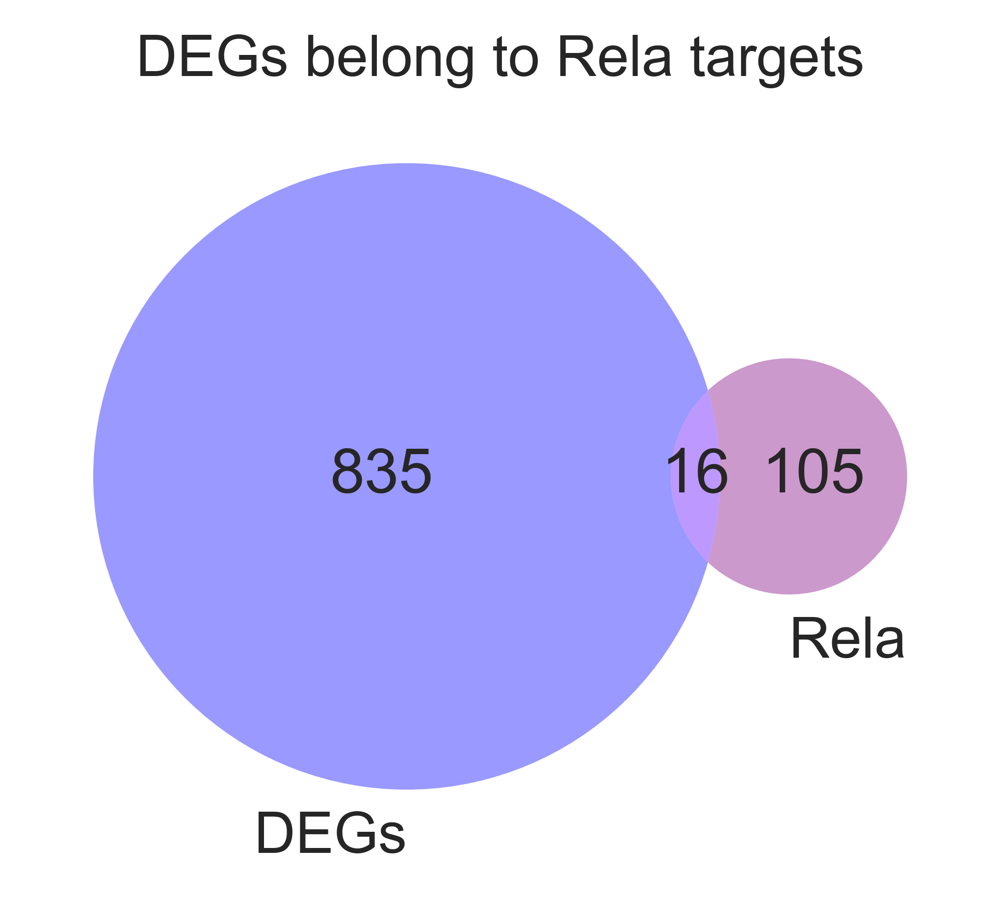

In [326]:
Venn_2_Plot(DEGsSet, relATarget, 'DEGs', 'Rela','DEGs belong to Rela targets', TFsDir, 'DEGs down-regulated by MCB belong to Rela targets')

In [231]:
relA_Trrust = set(Targets['Geneid'])
DEGsSet = set(DEGsList)
TrrustRelA = DEGsSet & relA_Trrust
ChIPBaseRelA = DEGsSet & set(relA_ChIPBaseGenes)
len(ChIPBaseRelA)

99

In [228]:
DEGs = fpkm[fpkm['Geneid'].isin(DEGsList)].reset_index(drop=True)
DEGsList = DEGs['Geneid'].to_list()
len(DEGsList)

851

In [300]:
Targets = fpkm[fpkm['Geneid'].isin(relA_ChIPBaseGenes)].reset_index(drop=True)
TargetsDEGs = Targets[Targets['Geneid'].isin(DEGsList)].reset_index(drop=True)
# TargetsDEGs

In [301]:
TFs = pd.read_csv('/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/TFs/Rela_mouse_Targets.csv')
relATarget = set(TFs['Target'])
len(relATarget)
# relATarget = set

121

In [88]:
TFs_mm10_Trrust.head()

,TF,Target,Mode,References
0,Aatf,Bak1,Unknown,22983126
1,Aatf,Bax,Unknown,22983126
2,Aatf,Bbc3,Unknown,22983126
3,Aatf,Cdkn1a,Unknown,21317046
4,Aatf,Tpt1,Activation,17157788


In [510]:
Nfkb1Target = list(set(TFs_mm10_Trrust[TFs_mm10_Trrust['TF']=='Nfkb1']['Target']))
len(Nfkb1Target)

200

[0.5 1.5 2.5 3.5 4.5 5.5 6.5 7.5]


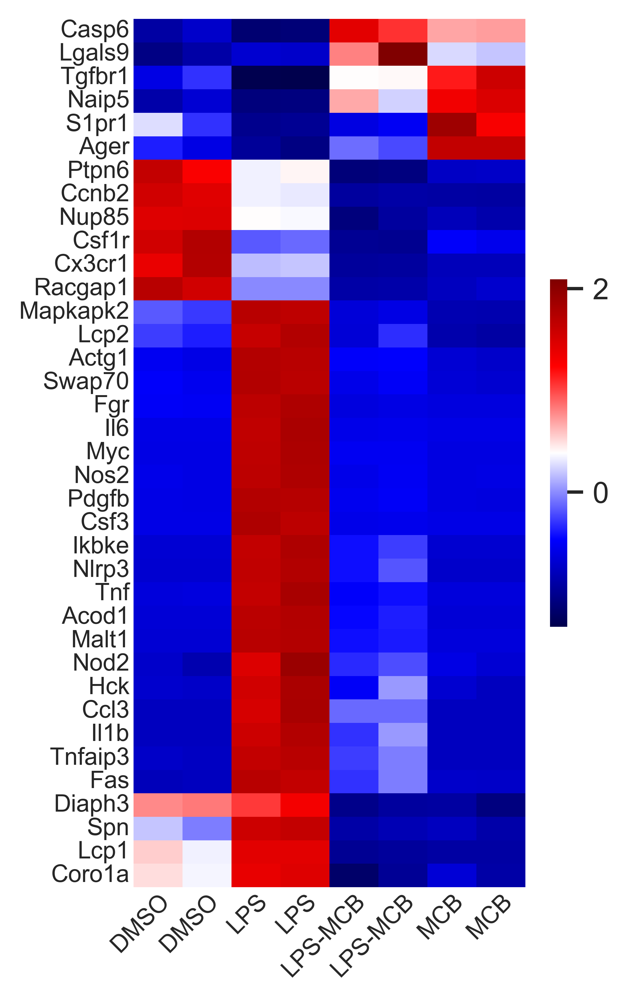

In [587]:
kinaseAllFpkm = fpkmCatch(kinaseAllDEGs, fpkm)
kinaseAllFpkm

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
0,Abr,79.20,59.44,166.86,178.44,28.15,29.62,21.38,21.56
1,Acod1,1.49,2.95,3986.11,4094.32,363.62,503.24,1.25,1.12
2,Acta1,3.94,0.28,0.12,4.03,0.07,0.16,0.49,0.34
3,Actb,1350.49,1285.24,3115.59,3064.07,409.96,443.30,534.09,479.29
4,Actg1,94.45,80.36,610.27,605.55,102.78,107.01,60.61,51.92
...,...,...,...,...,...,...,...,...,...
166,Ubox5,5.37,5.38,5.78,5.86,1.04,2.24,2.59,2.67
167,Ulk1,2.76,4.56,0.65,0.78,10.28,9.16,15.53,14.95
168,Vasp,181.21,185.41,457.81,444.04,112.66,152.65,116.61,102.23
169,Wipi1,2.26,2.46,1.37,0.94,7.05,10.24,10.04,12.50


In [62]:
kinaseAllFpkm = pd.read_csv('/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/Kinase/kinase_171.csv')
kinaseAllFpkm

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2,FC,logFC
0,Efna1,2.07,2.33,0.08,0.09,6.25,3.80,11.64,10.92,132.705882,7.052089
1,S1pr1,6.47,3.65,0.06,0.18,2.06,2.52,14.62,11.55,109.041667,6.768736
2,Coq8a,0.20,0.53,0.03,0.14,1.78,1.92,8.25,8.12,96.294118,6.589376
3,Mxra8,0.49,0.56,0.03,0.04,1.53,1.03,3.07,3.37,92.000000,6.523562
4,Cpt1a,17.74,19.25,0.71,0.48,11.11,13.17,42.56,43.63,72.428571,6.178487
...,...,...,...,...,...,...,...,...,...,...,...
166,Csf3,0.00,0.12,280.53,270.28,1.00,2.73,0.08,0.20,0.000508,-10.941912
167,Il1b,0.00,0.09,163.97,176.04,32.25,57.03,0.00,0.15,0.000441,-11.146399
168,Acod1,1.49,2.95,3986.11,4094.32,363.62,503.24,1.25,1.12,0.000293,-11.735329
169,Il6,0.00,0.00,16.10,17.22,0.10,0.22,0.00,0.00,0.000000,-inf


In [4]:
expData = kinaseAllFpkm.set_index('Geneid').loc[:,['LPS_1','LPS_2','MCB_1','MCB_2']]
expData = expData[expData.apply(np.mean,axis=1)>1]
expData

,LPS_1,LPS_2,MCB_1,MCB_2
Geneid,,,,
Efna1,0.08,0.09,11.64,10.92
S1pr1,0.06,0.18,14.62,11.55
Coq8a,0.03,0.14,8.25,8.12
Mxra8,0.03,0.04,3.07,3.37
Cpt1a,0.71,0.48,42.56,43.63
...,...,...,...,...
Csf3,280.53,270.28,0.08,0.20
Il1b,163.97,176.04,0.00,0.15
Acod1,3986.11,4094.32,1.25,1.12


In [5]:
sampleInfo = pd.DataFrame(expData.columns,columns=['sample'])
sampleInfo['condition'] = [re.sub('_\w','',x) for x in expData.columns]
design_matrix = sampleInfo.set_index('sample')
design_matrix

,condition
sample,
LPS_1,LPS
LPS_2,LPS
MCB_1,MCB
MCB_2,MCB


In [30]:
expData = kinaseAllFpkm.set_index('Geneid').loc[:,['LPS_1','LPS_2','MCB_1','MCB_2']]
expData = expData[expData.apply(np.mean,axis=1)>1]

sampleInfo = pd.DataFrame(expData.columns,columns=['sample'])
sampleInfo['condition'] = [re.sub('_\w','',x) for x in expData.columns]
design_matrix = sampleInfo

expData

,LPS_1,LPS_2,MCB_1,MCB_2
Geneid,,,,
Efna1,0.08,0.09,11.64,10.92
S1pr1,0.06,0.18,14.62,11.55
Coq8a,0.03,0.14,8.25,8.12
Mxra8,0.03,0.04,3.07,3.37
Cpt1a,0.71,0.48,42.56,43.63
...,...,...,...,...
Csf3,280.53,270.28,0.08,0.20
Il1b,163.97,176.04,0.00,0.15
Acod1,3986.11,4094.32,1.25,1.12


In [131]:
SFKs = ["Src","Yes","Fyn","Fgr","Lyn","Hck","Lck","Blk","Frk"]
SFKs

['Src', 'Yes', 'Fyn', 'Fgr', 'Lyn', 'Hck', 'Lck', 'Blk', 'Frk']

In [147]:
kinase = fpkmCatch(SFKs, fpkm)
kinase

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
0,Fgr,5.91,5.53,75.30,78.63,2.12,3.08,2.22,2.16
1,Fyn,24.66,22.54,32.60,34.06,16.49,22.08,18.48,15.20
2,Hck,7.30,6.49,54.84,60.40,11.46,22.91,7.36,5.77
3,Lck,1.93,0.92,1.64,1.97,1.82,3.10,1.21,1.53
4,Lyn,37.55,39.55,62.98,62.41,38.17,41.44,50.90,47.54


In [150]:

srtedKinase = kinaseAllFpkm.sort_values('Geneid').reset_index(drop=True)
# srtedKinase.style.set_sticky(header=0)
# srtedKinase.style.set_sticky(axis=1)
srtedKinase.head()


,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2,logFC,p_value,FDR
0,Abr,79.20,59.44,166.86,178.44,28.15,29.62,21.38,21.56,-3.007456,0.001464,0.002730
1,Acod1,1.49,2.95,3986.11,4094.32,363.62,503.24,1.25,1.12,-11.735329,0.000179,0.000964
2,Actb,1350.49,1285.24,3115.59,3064.07,409.96,443.30,534.09,479.29,-2.608352,0.000212,0.001098
3,Actg1,94.45,80.36,610.27,605.55,102.78,107.01,60.61,51.92,-3.433548,0.000080,0.000959
4,Adarb1,4.29,3.84,1.24,1.43,8.76,7.95,5.51,5.66,2.064718,0.000810,0.002007


In [87]:
kinaseAllFpkm = FPKM2DEGs(kinaseAllFpkm)

/Users/fenn/anaconda3/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-84-fc760fe2d1c6>:232: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  pValue = ttest_ind(LPSGroup.loc[gene], MCBGroup.loc[gene]).pvalue


In [88]:
kinaseAllFpkmFilter = kinaseAllFpkm[kinaseAllFpkm['logFC'].abs()>5].reset_index(drop=True)
kinaseAllFpkmFilter

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2,logFC,p_value,FDR
0,Efna1,2.07,2.33,0.08,0.09,6.25,3.80,11.64,10.92,7.052089,0.001033,0.002286
1,S1pr1,6.47,3.65,0.06,0.18,2.06,2.52,14.62,11.55,6.768736,0.013750,0.014726
2,Coq8a,0.20,0.53,0.03,0.14,1.78,1.92,8.25,8.12,6.589376,0.000110,0.000959
3,Mxra8,0.49,0.56,0.03,0.04,1.53,1.03,3.07,3.37,6.523562,0.002213,0.003567
4,Cpt1a,17.74,19.25,0.71,0.48,11.11,13.17,42.56,43.63,6.178487,0.000166,0.000964
5,Pdcd4,9.42,12.20,0.70,0.75,24.57,18.87,51.81,50.54,6.141314,0.000159,0.000964
6,Pik3ip1,2.01,1.45,0.23,0.22,3.13,2.50,11.53,10.37,5.604862,0.002912,0.004320
7,Dusp6,1.73,2.30,0.11,0.09,2.65,2.43,4.24,4.77,5.493455,0.003605,0.004986
8,Pdk2,1.36,1.55,0.05,0.14,1.09,0.78,4.43,4.12,5.491853,0.001488,0.002744
9,Tef,4.32,3.99,0.57,0.77,11.61,7.82,23.18,24.39,5.149747,0.000703,0.001859


In [106]:
kinaseAllFpkmFilter.set_index('Geneid').loc[:,:'MCB_2'].head()

,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
Geneid,,,,,,,,
Efna1,2.07,2.33,0.08,0.09,6.25,3.80,11.64,10.92
S1pr1,6.47,3.65,0.06,0.18,2.06,2.52,14.62,11.55
Coq8a,0.20,0.53,0.03,0.14,1.78,1.92,8.25,8.12
Mxra8,0.49,0.56,0.03,0.04,1.53,1.03,3.07,3.37
Cpt1a,17.74,19.25,0.71,0.48,11.11,13.17,42.56,43.63


In [93]:
kinaseAllFpkm.head()

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2,logFC,p_value,FDR
0,Efna1,2.07,2.33,0.08,0.09,6.25,3.80,11.64,10.92,7.052089,0.001033,0.002286
1,S1pr1,6.47,3.65,0.06,0.18,2.06,2.52,14.62,11.55,6.768736,0.013750,0.014726
2,Coq8a,0.20,0.53,0.03,0.14,1.78,1.92,8.25,8.12,6.589376,0.000110,0.000959
3,Mxra8,0.49,0.56,0.03,0.04,1.53,1.03,3.07,3.37,6.523562,0.002213,0.003567
4,Cpt1a,17.74,19.25,0.71,0.48,11.11,13.17,42.56,43.63,6.178487,0.000166,0.000964


,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2,Cluster
Geneid,,,,,,,,,
Il4ra,-0.807673,-0.788570,-0.910348,-0.912736,1.615943,1.556248,0.135508,0.111630,1
Cxcl14,-0.534886,-0.514232,-0.914083,-0.900872,1.745879,1.621030,-0.244627,-0.258209,1
Tnfrsf12a,-0.682544,-0.731000,-0.764283,-0.519066,1.850382,1.566988,-0.420686,-0.299791,1
Tnfsf14,-0.663788,-0.601093,-0.688867,-0.688867,1.818953,1.618327,-0.450624,-0.344041,1
Il6ra,-0.026629,0.353788,-1.616775,-1.717857,0.770074,0.567909,0.834201,0.835288,2
Tnfrsf14,-1.023866,-0.594488,-1.002033,-1.063893,0.628147,0.253351,1.206715,1.596066,2
Ccl25,-0.517756,-0.258604,-1.343531,-1.321569,0.272879,0.720906,0.712121,1.735554,2
Tgfbr1,-0.590230,-0.302572,-1.302838,-1.322451,0.391239,0.405132,1.145525,1.576195,2
Csf1r,1.543934,1.754555,-0.164044,-0.118338,-0.979230,-0.997823,-0.483925,-0.555127,3


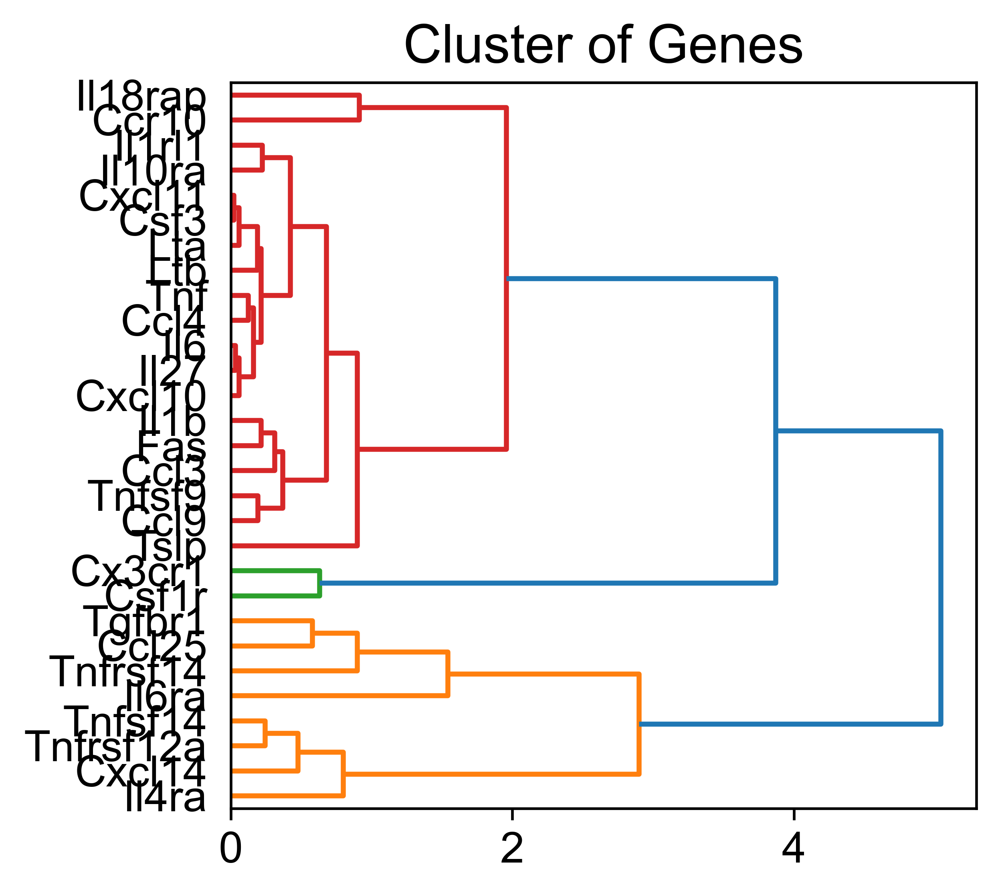

In [99]:
Fgr.FPKM_norm_Cluster(fpkmNFKB)

,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2,Cluster
Geneid,,,,,,,,,
Lyn,37.55,39.55,62.98,62.41,38.17,41.44,50.90,47.54,1
Lck,1.93,0.92,1.64,1.97,1.82,3.10,1.21,1.53,1
Fyn,24.66,22.54,32.60,34.06,16.49,22.08,18.48,15.20,1
Fgr,5.91,5.53,75.30,78.63,2.12,3.08,2.22,2.16,1
Hck,7.30,6.49,54.84,60.40,11.46,22.91,7.36,5.77,1


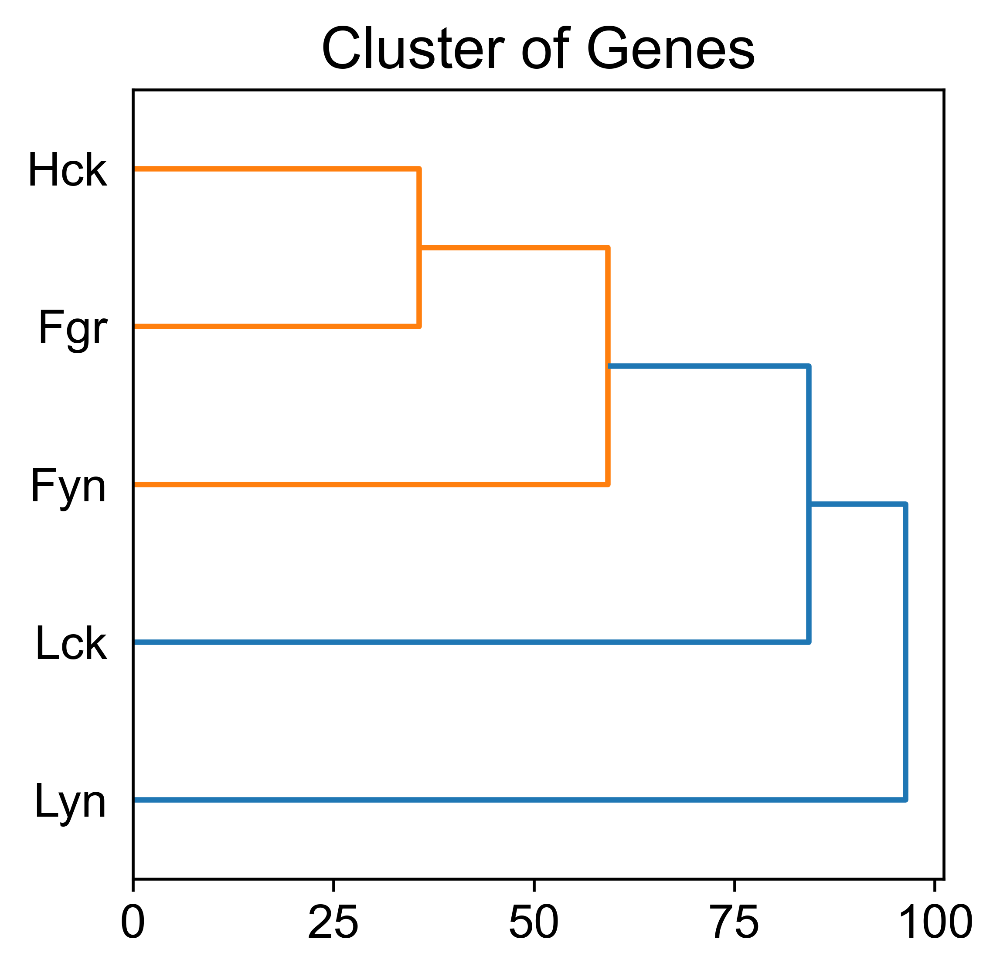

In [98]:
SFKsList = ["Src","Yes","Fyn","Fgr","Lyn","Hck","Lck","Blk","Frk"]
Fgr = FPKMIntersectSet(FPKM=fpkm, MarkerList=SFKsList)
FgrFPKM = Fgr.FPKMCatch()
Fgr.clusterGenes(FgrFPKM)

In [36]:
os.chdir('/Users/fenn/Documents/Co68/RNA-seq/Co68_LPS')
os.listdir()

['merge_LPS_CO68_72.csv']

In [41]:
# 绘制LPS和Co68的热图
DEGsLPSCo68 = pd.read_csv('merge_LPS_CO68_72.csv')
DEGsLPSCo68.head()

,GeneName,LPS,Co68
0,Acod1,2.794520,-2.75670
1,Apobec4,0.000000,2.66065
2,Arc,0.686655,2.80380
3,Bcl6b,2.214980,-2.64974
4,Bdkrb2,2.404010,-2.80252


In [57]:
import scipy.cluster.hierarchy as sch
###数据是dataframe，而不是矩阵
def clusterSample(data):
    points = data.set_index('GeneName')
    #层次聚类（即系统聚类）生成观测值之间的距离矩阵,这里用的欧氏距离:
    disMat = sch.distance.pdist(points,'euclidean') 
    #进行层次聚类，此处使用'average'，也可以使用'ward':
    Z=sch.linkage(disMat,method='average') 

    plt.rcParams['font.family'] = 'Arial'
    #设置线条粗细及设置画布大小
    plt.rcParams['axes.linewidth'] = 1  
    plt.rcParams['xtick.major.width'] = 1  
    plt.rcParams['ytick.major.width'] = 1
    plt.rcParams['lines.linewidth'] = 1.2
    fig = plt.figure(figsize=(4,6), dpi=600)
    ax = fig.add_subplot(111)
    #绘制谱系图
    P=sch.dendrogram(Z, labels=points.index, leaf_font_size=13, leaf_rotation=0, orientation='right')
    plt.title('Cluster of Genes', fontsize=16)
    ax.tick_params(labelsize=13)
    #获取Sample聚类顺序
    sample_order = P['leaves']
    exp = points.iloc[sample_order,]
    # sampleOrder = exp.index.to_list()
    # 聚类分析结果
    cluster= sch.fcluster(Z, t=1)
    cluster_country = {}
    for country, cluster in zip(points.index, cluster):
        cluster_country[country] = cluster
    clusterList = pd.DataFrame({'Geneid': cluster_country.keys(), 'Cluster':cluster_country.values()})
    #打印聚类结果
    exp = pd.merge(exp, clusterList.set_index('Geneid'), left_index=True, right_index=True)
    return exp



,LPS,Co68
Fabp5,1.93216,-2.78585
Olfr98,2.06381,-2.99544
Bcl6b,2.21498,-2.64974
Hdc,2.22147,-2.63224
Gipr,2.10368,-2.52557


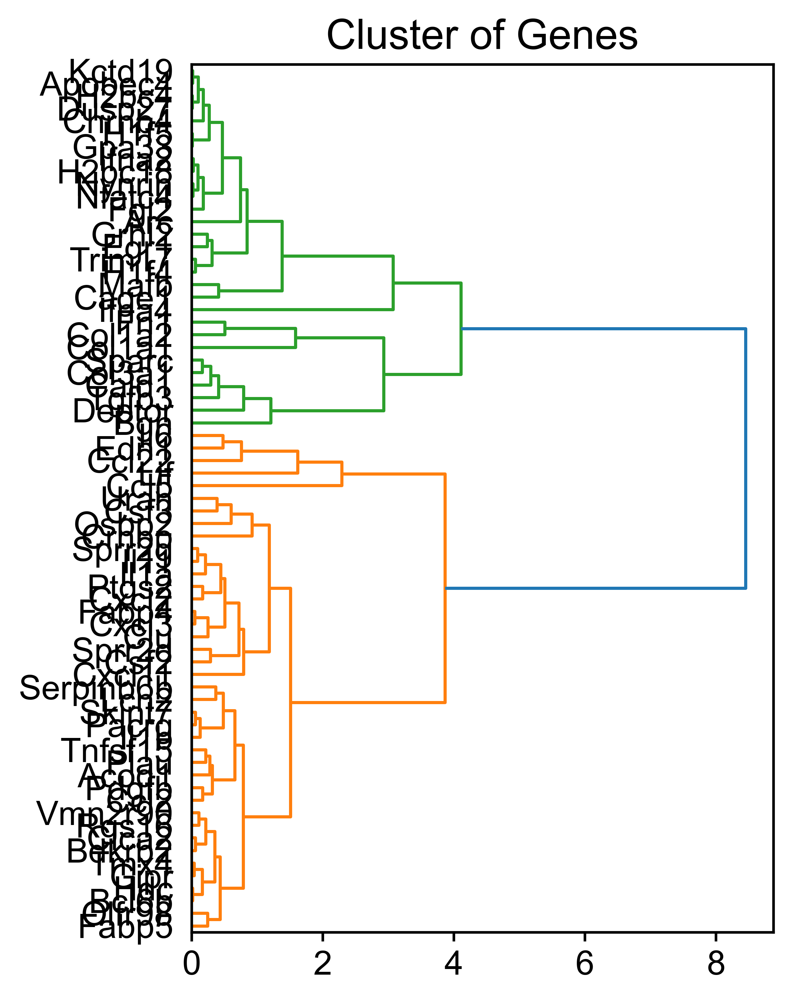

In [61]:
clusterDEGs = clusterSample(DEGsLPSCo68).loc[:,:'Co68'] 
clusterDEGs.head()

In [1]:
exp = clusterDEGs.T
exp.head()

NameError: name 'clusterDEGs' is not defined

[ 0.5  1.5  2.5  3.5  4.5  5.5  6.5  7.5  8.5  9.5 10.5 11.5 12.5 13.5
 14.5 15.5 16.5 17.5 18.5 19.5 20.5 21.5 22.5 23.5 24.5 25.5 26.5 27.5
 28.5 29.5 30.5 31.5 32.5 33.5 34.5 35.5 36.5 37.5 38.5 39.5 40.5 41.5
 42.5 43.5 44.5 45.5 46.5 47.5 48.5 49.5 50.5 51.5 52.5 53.5 54.5 55.5
 56.5 57.5 58.5 59.5 60.5 61.5 62.5 63.5 64.5 65.5 66.5 67.5 68.5]


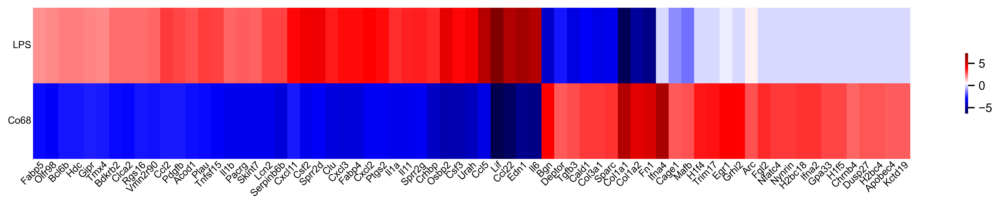

In [72]:
fileName = 'DEGsLPSCo68Heatmap'
outDir = '/Users/fenn/Documents/Co68/RNA-seq/Co68_LPS'

with sns.plotting_context('notebook', font_scale=1):
        fig = plt.figure(figsize=(18,2.5), dpi=700)
        ax = fig.add_subplot(111)
        # ax.spines['left'].set_linewidth(1.5)
        # ax.spines['bottom'].set_linewidth(1.5)
        sns.heatmap(exp, cmap='seismic', yticklabels=True, 
                    # cbar_kws={"orientation": "horizontal"},
                    cbar_kws={"shrink": 0.4}
                    )

        ax.tick_params(axis='y', width=1, length=0, pad=1.5, labelsize=9)
        ax.tick_params(axis='x', width=1, length=0, pad=1, labelsize=9)
        ax.set_xticks([x+0.5 for x in list(range(int(len(exp.columns))))], [re.sub(r'_.*', '', x) for x in list(exp.columns)], 
                        # ha = 'center'
                        # rotation_mode='default', 
                        rotation_mode = 'anchor',
                        rotation=45, ha='right', va='top'
                        )
        print(ax.get_xticks())
        ax.set_xlabel('', fontsize=14)
        ax.set_ylabel('', fontsize=16)
        plt.yticks(rotation=0) 
        # ax.set_title('Heatmap of DEGs associated with inflammation', fontsize=12, loc='left')
        plt.savefig(f'{outDir}/Heatmap_{fileName}_18_2.5.pdf', dpi=700, bbox_inches='tight')

[0.5 1.5 2.5 3.5 4.5 5.5 6.5 7.5]


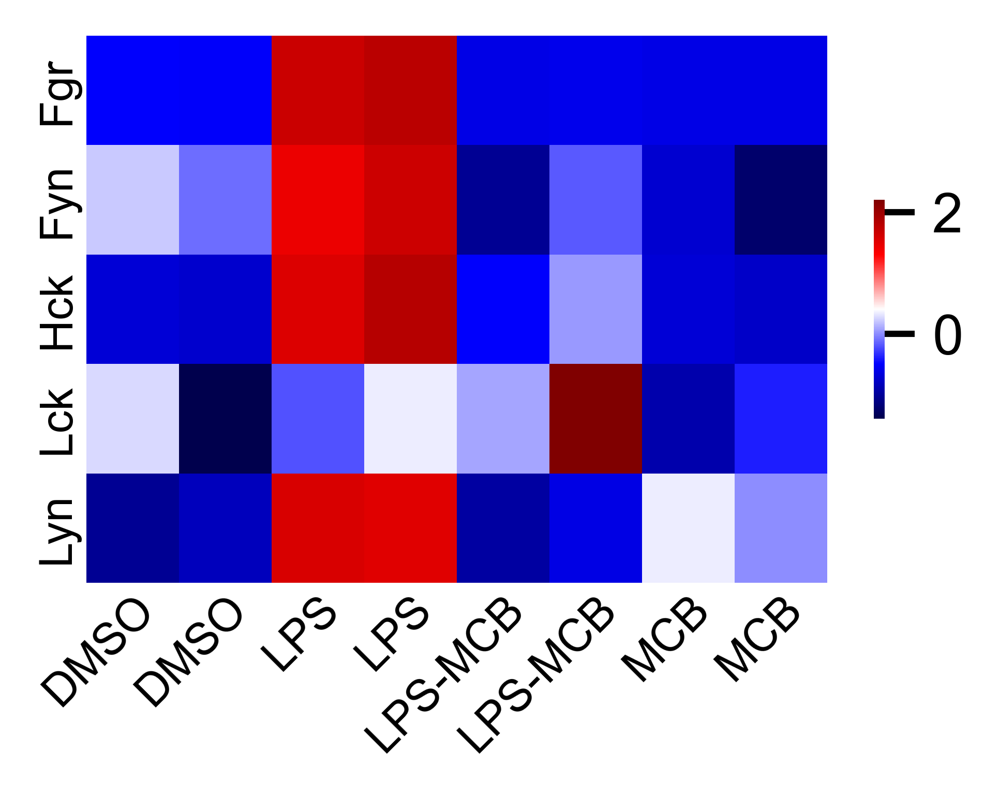

In [218]:
outDir = '/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/Kinase/SFKs'
Fgr.heatmapPlot(normFgr, 2, outDir, 'SFKs_heatmap')

In [214]:
normFgr = Fgr.normMatrix(FgrFPKM)
normFgr

,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
Geneid,,,,,,,,
Fgr,-0.501043,-0.512974,1.677535,1.782084,-0.620035,-0.589894,-0.616895,-0.618779
Fyn,0.213738,-0.110792,1.429194,1.652691,-1.036927,-0.181209,-0.732297,-1.234400
Hck,-0.696155,-0.734343,1.545119,1.807245,-0.500032,0.039779,-0.693326,-0.768287
Lck,0.271838,-1.392138,-0.205938,0.337738,0.090613,2.199413,-0.914363,-0.387163
Lyn,-1.028152,-0.822881,1.581871,1.523369,-0.964518,-0.628900,0.342033,-0.002822


,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2,Cluster
Geneid,,,,,,,,,
Lck,0.271838,-1.392138,-0.205938,0.337738,0.090613,2.199413,-0.914363,-0.387163,1
Lyn,-1.028152,-0.822881,1.581871,1.523369,-0.964518,-0.628900,0.342033,-0.002822,1
Fyn,0.213738,-0.110792,1.429194,1.652691,-1.036927,-0.181209,-0.732297,-1.234400,1
Fgr,-0.501043,-0.512974,1.677535,1.782084,-0.620035,-0.589894,-0.616895,-0.618779,1
Hck,-0.696155,-0.734343,1.545119,1.807245,-0.500032,0.039779,-0.693326,-0.768287,1


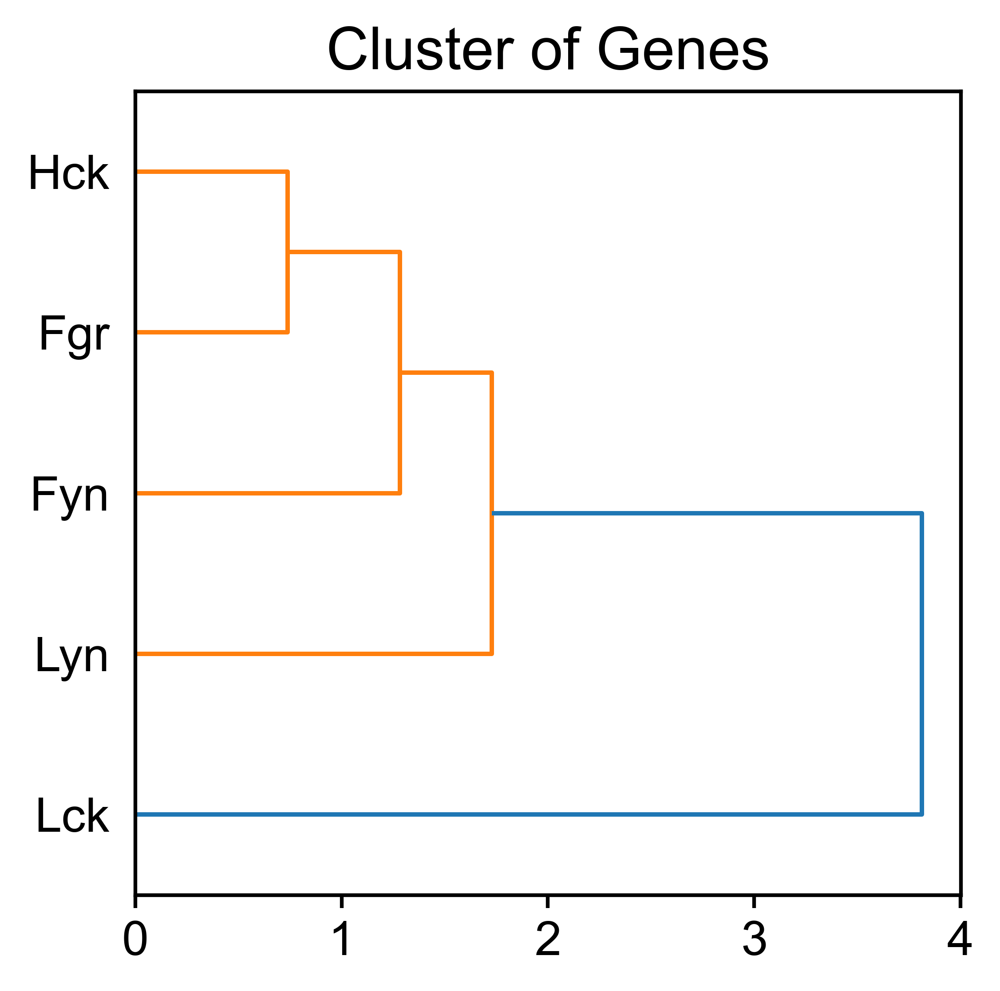

In [215]:
Fgr.clusterGenes(normFgr.reset_index())

In [17]:
from typing import List
from typing import cast
from typing import Optional

import pandas as pd
import numpy as np
import scipy.cluster.hierarchy as sch
from statannotations.Annotator import Annotator
import re
import seaborn as sns
import matplotlib.pyplot as plt

#使用面向对象编程，对FPKM进行多项分析
class FPKMIntersectSet:
    def __init__(self, *, FPKM: Optional[pd.DataFrame] = None, 
                 DEGsMatrix: Optional[pd.DataFrame] = None,
                 MarkerList: Optional[List[str]] = None,                
                 ) -> None:
        self.FPKM = FPKM
        self.DEGsMatrix = DEGsMatrix
        self.MarkerList = MarkerList
    
    #根据gene list提取FPKM值
    #FPKM需要使用Geneid作为行名，而不是index。
    def FPKMCatch(self):
        marker_gene_fpkm = self.FPKM[self.FPKM['Geneid'].isin(self.MarkerList)].reset_index(drop=True)
        return marker_gene_fpkm
    
    # 使用的是'Geneid'作为列名的数据框，而不是矩阵
    def barPlotFPKM(self, markersFPKM, out_dir):
        signal = markersFPKM
        geneList = list(signal['Geneid'])
        print(len(geneList))
        # geneList.pop(0) #如果index是数字索引，则需要删除第一行的行名；
        for var in geneList:
            gene = signal[signal['Geneid'] == var]
            gene = gene.set_index('Geneid').T
            gene['grp'] = [re.sub('_.*','',x) for x in gene.index]
            gene
            with sns.plotting_context('notebook', font_scale=1.3):
                x='grp'
                y= var
                fig = plt.figure(figsize=(3,3), dpi=600)
                ax = fig.add_subplot(111)
                ax.spines['left'].set_linewidth(1.5)
                ax.spines['bottom'].set_linewidth(1.5)
                #  width=0.6,
                g = sns.barplot(data=gene, y=y, x=x,
                    capsize=0.3, errwidth=1.5, palette=[sns.color_palette('bright')[3]],
                    errcolor='0.1')
                sns.despine()
                ax.tick_params(width=1.5, labelsize=11)
                ax.set_xlabel('', fontsize=13)
                ax.set_ylabel(f'{y}', fontsize=13, fontstyle='italic')
                ax.set_title('FPKM of RAW 264.7', fontsize=13, loc='left')
                ax.set_xticks(range(int(len(gene)/2)), list(gene['grp'].drop_duplicates()), rotation_mode='anchor', rotation=45, horizontalalignment='right')
                # range(int(len(gene['grp'])/2)) 设置标签索引
                #进行ANOVA差异分析
                #需要手动改动两两比较的组名
                pairs = [('DMSO','LPS'),('LPS','LPS-MCB'), ('LPS', 'MCB')]
                annotator = Annotator(g, pairs, data=gene, x=x, y=y)
                annotator.configure(test='t-test_ind', text_format='star', loc='inside', line_width=1.5, line_height=0.01, verbose=True)
                annotator.apply_and_annotate()
                plt.savefig(f'{out_dir}/RAW_MCB_LPS_12h_{y}_33.pdf', dpi=700, bbox_inches='tight')

    #对相似基因进行聚类分析并可视化
    ###数据是dataframe，而不是矩阵
    def clusterGenes(self, data):
        points = data.set_index('Geneid')
        #层次聚类（即系统聚类）生成观测值之间的距离矩阵,这里用的欧氏距离:
        disMat = sch.distance.pdist(points,'euclidean') 
        #进行层次聚类，此处使用'average'，也可以使用'ward':
        Z=sch.linkage(disMat,method='average') 
        plt.rcParams['font.family'] = 'Arial'
        #设置线条粗细及设置画布大小
        
        fig = plt.figure(figsize=(4,4), dpi=600)
        ax = fig.add_subplot(111)
        #绘制谱系图
        P=sch.dendrogram(Z, labels=points.index, leaf_font_size=13, leaf_rotation=0, orientation='right')
        plt.title('Cluster of Genes', fontsize=16)
        ax.tick_params(labelsize=13)
        #获取Sample聚类顺序
        sample_order = P['leaves']
        exp = points.iloc[sample_order,]
        # sampleOrder = exp.index.to_list()
        # 聚类分析结果
        cluster= sch.fcluster(Z, t=1)
        cluster_country = {}
        for country, cluster in zip(points.index, cluster):
            cluster_country[country] = cluster
        clusterList = pd.DataFrame({'Geneid': cluster_country.keys(), 'Cluster':cluster_country.values()})
        #打印聚类结果
        exp = pd.merge(exp, clusterList.set_index('Geneid'), left_index=True, right_index=True)
        return exp
    
    ###对数据进行标准化
    ##直接导入Geneid位列名的dataFrame
    def normMatrix(self, matrix, axis=1):
        standarlized_data = matrix.set_index('Geneid').apply(lambda x: (x-np.mean(x))/np.std(x), axis=axis)
        return standarlized_data

    def FPKM_norm_Cluster(self, fpkm):
        norm_matrix = self.normMatrix(fpkm.loc[:,:'MCB_2'], axis=1)
        matrix_norm_cluster = self.clusterGenes(norm_matrix.reset_index())
        return matrix_norm_cluster

    def heatmapPlot(self, exp, length, outDir, fileName):
        with sns.plotting_context('notebook', font_scale=1):
            fig = plt.figure(figsize=(3.3, length), dpi=700)
            ax = fig.add_subplot(111)
            # ax.spines['left'].set_linewidth(1.5)
            # ax.spines['bottom'].set_linewidth(1.5)
            sns.heatmap(exp, cmap='seismic', yticklabels=True, 
                        cbar_kws={"shrink": 0.4})

            ax.tick_params(axis='y', width=1, length=0, pad=1.5, labelsize=9)
            ax.tick_params(axis='x', width=1, length=0, pad=1, labelsize=9)
            ax.set_xticks([x+0.5 for x in list(range(int(len(exp.columns))))], [re.sub(r'_.*', '', x) for x in list(exp.columns)], 
                            # ha = 'center'
                            # rotation_mode='default', 
                            rotation_mode = 'anchor',
                            rotation=45, ha='right', va='top'
                            )
            print(ax.get_xticks())
            ax.set_xlabel('', fontsize=12)
            ax.set_ylabel('', fontsize=12)
            # ax.set_title('Heatmap of DEGs associated with inflammation', fontsize=12, loc='left')
            plt.savefig(f'{outDir}/Heatmap_{fileName}.pdf', dpi=700, bbox_inches='tight')


In [22]:
import re
def barPlotFPKM(markersFPKM, out_dir):
    signal = markersFPKM
    geneList = list(signal['Geneid'])
    print(len(geneList))
    # geneList.pop(0) #如果index是数字索引，则需要删除第一行的行名；
    for var in geneList:
        gene = signal[signal['Geneid'] == var]
        gene = gene.set_index('Geneid').T
        gene['grp'] = [re.sub('_.*','',x) for x in gene.index]
        gene
        with sns.plotting_context('notebook', font_scale=1.3):
            x='grp'
            y= var
            fig = plt.figure(figsize=(3,3), dpi=600)
            ax = fig.add_subplot(111)
            ax.spines['left'].set_linewidth(1.5)
            ax.spines['bottom'].set_linewidth(1.5)
            plt.rcParams['font.sans-serif'] = ['Arial']
            #  width=0.6,
            g = sns.barplot(data=gene, y=y, x=x,
                capsize=0.4, errwidth=1.5, palette=[sns.color_palette('bright')[3]],
                errcolor='0.1')
            sns.despine()
            ax.tick_params(width=1.5, labelsize=11)
            ax.set_xlabel('', fontsize=13)
            ax.set_ylabel(f'{y}', fontsize=13, fontstyle='italic')
            ax.set_title('FPKM of RAW 264.7 (12h)', fontsize=13, loc='left')
            ax.set_xticks(range(int(len(gene)/2)), list(gene['grp'].drop_duplicates()), rotation_mode='anchor', rotation=45, horizontalalignment='right')
            # range(int(len(gene['grp'])/2)) 设置标签索引
            #进行ANOVA差异分析
            #需要手动改动两两比较的组名
            pairs = [('DMSO','LPS'),('LPS','LPS-MCB'), ('LPS', 'MCB')]
            annotator = Annotator(g, pairs, data=gene, x=x, y=y)
            annotator.configure(test='t-test_ind', text_format='star', loc='inside', line_width=1.5, line_height=0.01, verbose=True)
            annotator.apply_and_annotate()
            plt.savefig(f'{out_dir}/RAW_MCB_LPS_12h_{y}_33.pdf', dpi=700, bbox_inches='tight')
            

In [4]:
import pandas as pd
fpkm = pd.read_csv('/Users/fenn/Documents/scriptPyRS/博士学位论文/中文图表/Co68_F2_MCB/RNA-seq/FPKM/FPKM_MCB.csv')
fpkm.head()

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
0,0610009B22Rik,24.26,25.77,14.60,12.51,5.06,9.60,15.55,13.06
1,0610010F05Rik,10.35,11.60,12.66,13.09,3.28,3.91,7.54,7.49
2,0610010K14Rik,24.80,24.35,20.26,20.03,25.08,24.24,19.29,16.10
3,0610012G03Rik,10.14,7.26,3.59,2.86,6.62,5.89,8.28,10.00
4,0610030E20Rik,13.98,17.73,15.26,16.05,24.47,23.12,33.09,34.03


In [29]:
listGene = ['Ifitm3']
listGene

['Ifitm3']

In [30]:
fpkmIRF3 = fpkm[fpkm['Geneid'].isin(listGene)]
fpkmIRF3

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
4093,Ifitm3,181.22,167.98,467.84,496.93,165.12,250.1,79.89,64.72


In [8]:
out_dir = '/Users/fenn/Documents/scriptPyRS/博士学位论文/中文图表/Co68_F2_MCB/RNA-seq/FPKM'

In [31]:
fpkmIRF3 = fpkmIRF3.reset_index(drop=True)
fpkmIRF3

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
0,Ifitm3,181.22,167.98,467.84,496.93,165.12,250.1,79.89,64.72


In [33]:
fpkmIRF3.loc[0,'LPS-MCB_2'] = 150.1
fpkmIRF3

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
0,Ifitm3,181.22,167.98,467.84,496.93,165.12,150.1,79.89,64.72


1
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMSO vs. LPS: t-test independent samples, P_val:2.685e-03 t=-1.926e+01
LPS vs. LPS-MCB: t-test independent samples, P_val:2.531e-03 t=1.984e+01
LPS vs. MCB: t-test independent samples, P_val:1.596e-03 t=2.500e+01


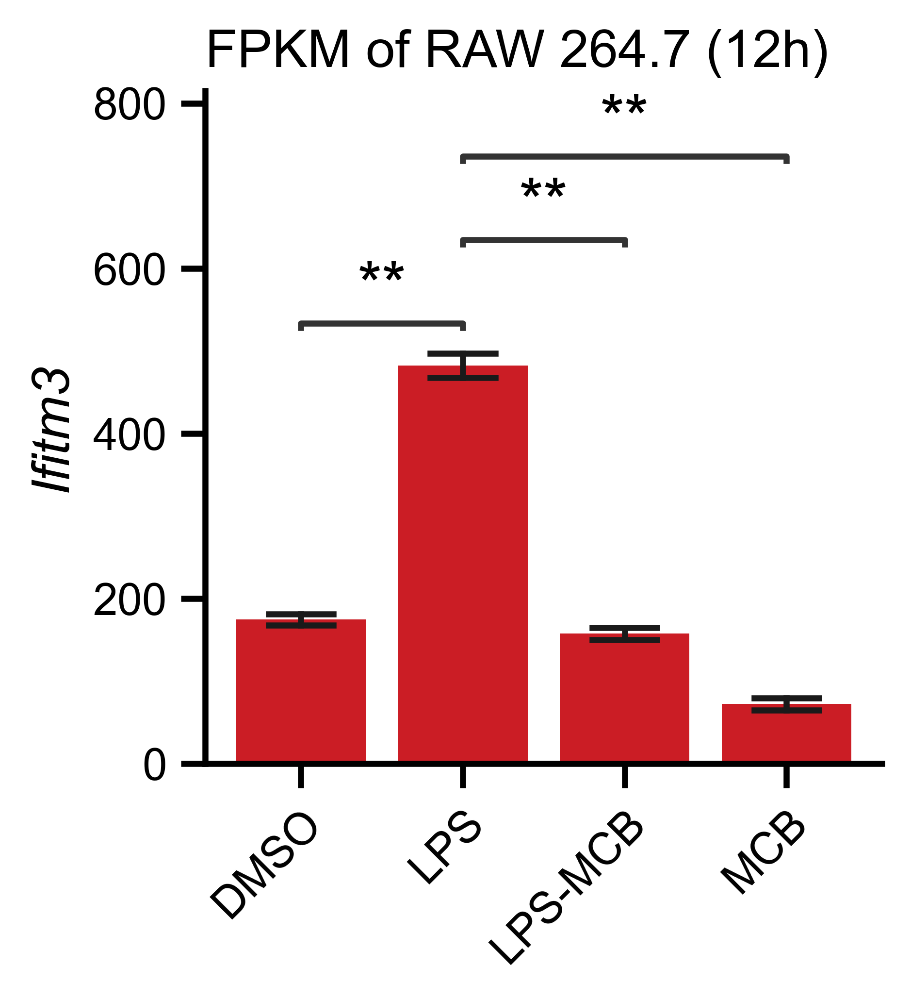

In [34]:
barPlotFPKM(fpkmIRF3, out_dir)

In [97]:
fpkmNFKB

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
0,Ccl25,2.38,2.97,0.50,0.55,4.18,5.20,5.18,7.51
1,Ccl3,76.95,35.91,9778.67,11127.73,2835.11,2825.21,28.17,28.93
2,Ccl4,11.08,5.42,3370.24,3479.21,222.91,182.30,4.37,3.78
3,Ccl9,50.84,31.96,942.39,902.09,229.55,186.44,12.12,13.13
4,Ccr10,2.13,2.21,2.70,2.42,0.62,0.48,0.90,0.78
5,Csf1r,425.29,459.16,150.63,157.98,19.54,16.55,99.19,87.74
6,Csf3,0.00,0.12,280.53,270.28,1.00,2.73,0.08,0.20
7,Cx3cr1,139.40,160.63,68.31,69.68,3.22,4.42,11.71,11.57
8,Cxcl10,3.60,4.06,3774.72,3876.88,53.48,81.35,0.75,0.55
9,Cxcl11,0.06,0.10,188.73,180.58,1.98,2.40,0.03,0.04


27

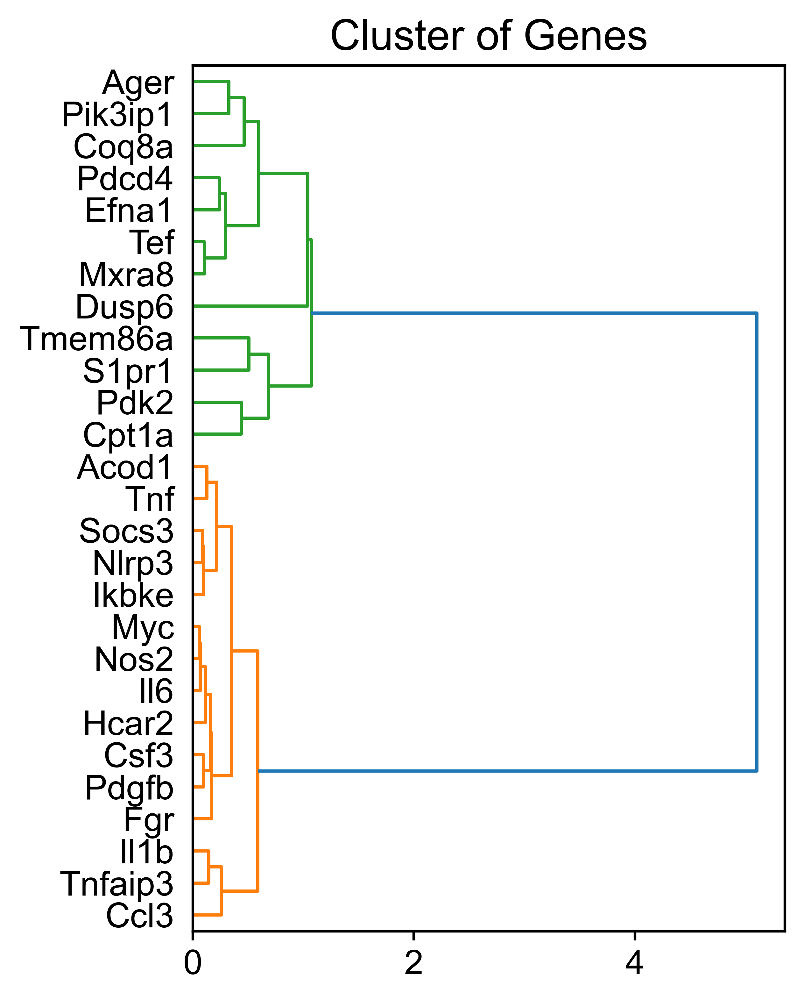

In [101]:
cls_Kinase = normClusterFPKM(kinaseAllFpkmFilter.set_index('Geneid'))
len(cls_Kinase)

[0.5 1.5 2.5 3.5 4.5 5.5 6.5 7.5]


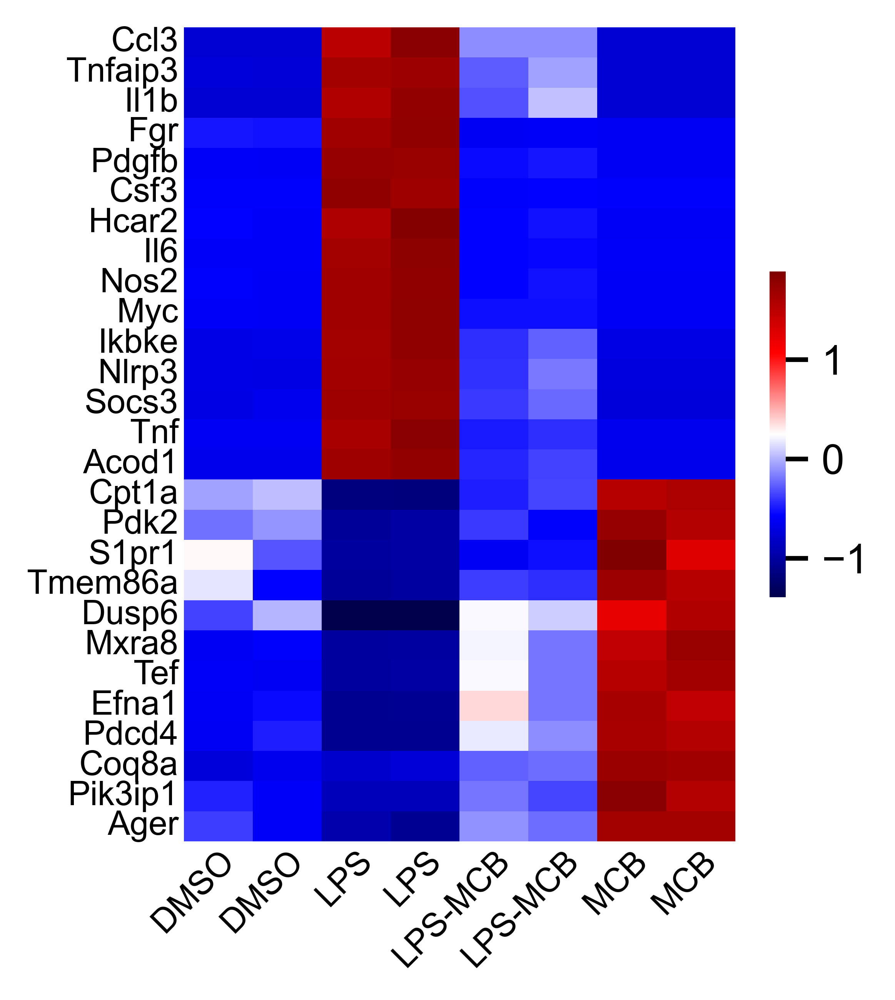

In [99]:
heatmapPlot(cls_Kinase.loc[:,:'MCB_2'], length=4, outDir='/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/Kinase', fileName='LPS-MCB_44_genes')

,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2,Cluster
Geneid,,,,,,,,,
Ccl3,76.95,35.91,9778.67,11127.73,2835.11,2825.21,28.17,28.93,8
Cpt1a,17.74,19.25,0.71,0.48,11.11,13.17,42.56,43.63,1
Pdcd4,9.42,12.20,0.70,0.75,24.57,18.87,51.81,50.54,1
Tef,4.32,3.99,0.57,0.77,11.61,7.82,23.18,24.39,4
Nos2,0.16,0.04,11.31,11.81,0.18,0.46,0.00,0.03,2
Hcar2,0.31,0.08,18.01,20.21,0.32,0.74,0.03,0.00,2
Il6,0.00,0.00,16.10,17.22,0.10,0.22,0.00,0.00,2
Mxra8,0.49,0.56,0.03,0.04,1.53,1.03,3.07,3.37,3
Ager,0.80,0.55,0.15,0.03,1.10,0.97,3.06,3.06,3


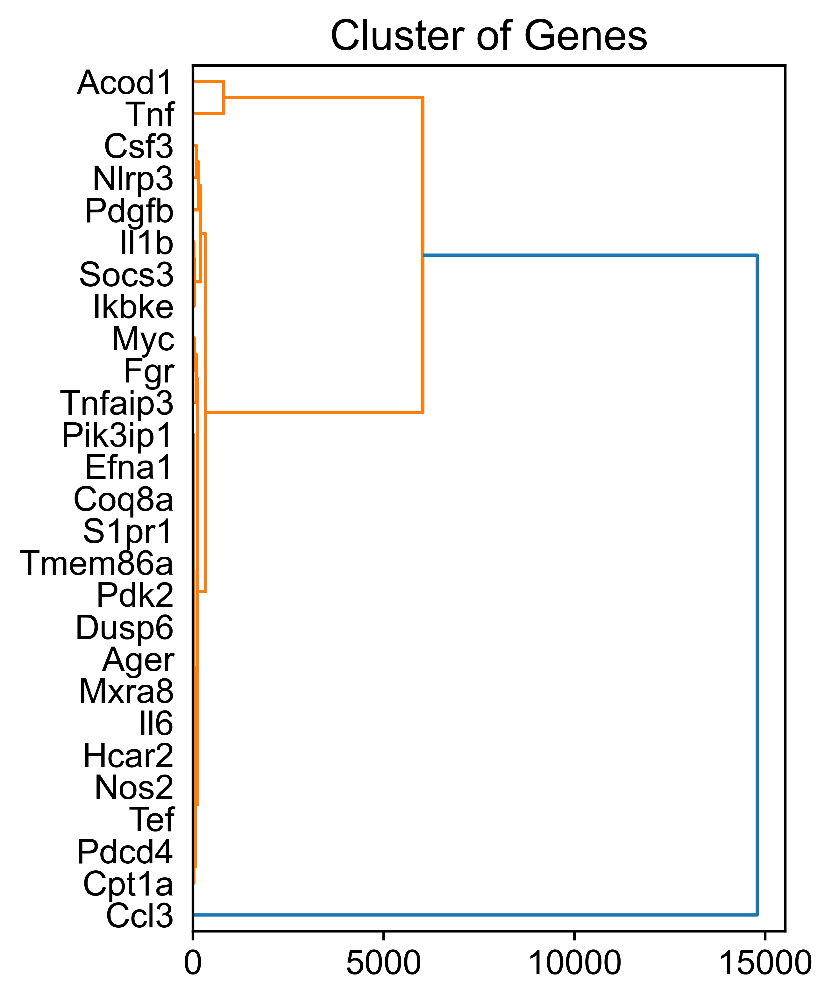

In [108]:
kinaseDEGsExp = clusterSample(kinaseAllFpkmFilter.loc[:,:'MCB_2'])
# kinaseDEGsExp.to_csv(kinaseDir + 'mmAllKinases.csv')
kinaseDEGsExp

In [526]:
kinaseDEGsExp = fpkm[fpkm['Geneid'].isin(kinaseDEGs)].reset_index(drop=True)
kinaseDEGsExp

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
0,Acod1,1.49,2.95,3986.11,4094.32,363.62,503.24,1.25,1.12
1,Actg1,94.45,80.36,610.27,605.55,102.78,107.01,60.61,51.92
2,Ager,0.80,0.55,0.15,0.03,1.10,0.97,3.06,3.06
3,Casp6,6.95,9.42,3.98,4.33,36.85,32.32,27.48,27.75
4,Ccl3,76.95,35.91,9778.67,11127.73,2835.11,2825.21,28.17,28.93
5,Ccnb2,108.16,103.43,55.78,54.61,1.36,2.74,2.11,2.01
6,Coro1a,236.05,221.78,322.95,329.33,73.01,94.38,123.50,102.31
7,Csf1r,425.29,459.16,150.63,157.98,19.54,16.55,99.19,87.74
8,Csf3,0.00,0.12,280.53,270.28,1.00,2.73,0.08,0.20
9,Cx3cr1,139.40,160.63,68.31,69.68,3.22,4.42,11.71,11.57


In [12]:
###FPKM批量可视化
import re
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator

#导入环境变量
# TFs_mm10_list = pd.read_table('/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/TFs/Mus_musculus_TF.txt')
# TFs_mm10_list = list(set(TFs_mm10_list['Symbol']))

# kinaseMmImmunology = pd.read_csv('/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/Kinase/Kinase_mm10_list/mouse_immunology_kinase.csv', names=['kinase'])
# kinaseImmunologyList = kinaseMmImmunology['kinase'].to_list()

# kinaseMmAll = pd.read_csv('/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/Kinase/mouse_all_kinase.csv', names=['kinase'])
# kinaseAllList = kinaseMmAll['kinase'].to_list()

#根据PCA结果从AllFPKM矩阵中提取优化后的FPKM
%whos

#使用平均值对FPKM进行质控
def FPKMFilter(FPKM, meanFPKM):
    FPKM = FPKM[FPKM.apply(np.mean, axis=1)>meanFPKM].reset_index()
    return FPKM

#根据gene list提取FPKM值
def fpkmCatch(DEGs, fpkm):
    kinaseDEGsExp = fpkm[fpkm['Geneid'].isin(DEGs)].reset_index(drop=True)
    return kinaseDEGsExp

###对数据进行标准化
def normMatrix(matrix, axis):
    data_standarlized = matrix.apply(lambda x: (x-np.mean(x))/np.std(x), axis=axis)
    return data_standarlized
    

#根据基因list提取FPKM中的表达矩阵
def GeneExpFPKM(markers, fpkm):
    print(len(markers))
    #fpkm已经自动过滤掉了mean<1的gene
    signal = fpkm[fpkm['Geneid'].str.upper().isin(markers)].reset_index(drop=True)
    print(len(signal))
    return signal

##根据KEGG中富集到的基因提取FPKM中的表达矩阵
#提前单个Term的基因
def KEGGGeneExp(dataKEGG, Term, fpkm):
    genes = dataKEGG[dataKEGG['Term'] == f'{Term}']['Genes'].to_list()[0]
    markers = [x for x in genes.split(';')]
    print(len(markers))
    #fpkm已经自动过滤掉了mean<1的gene
    signal = fpkm[fpkm['Geneid'].str.upper().isin(markers)].reset_index(drop=True)
    print(len(signal))
    return signal

#提前所以KEGG Term中的基因
def KEGG_genes_extraction(KEGGPathway):
    allGenes = KEGGPathway['Genes'].to_list()
    gene_list_kegg = []
    for i in allGenes:
        gene_list_kegg.append([j for j in i.split(';')])
    gene_list_all = list(set([y for x in gene_list_kegg for y in x]))
    return gene_list_all

###根据DESeq2的差异分析结果简单DEGs
def DEGsIdentify(DEGs, FC, pValue):    
    DEGs['status'] = 'normal'
    DEGs.loc[(DEGs['log2FoldChange'] > FC) & (DEGs['padj'] < pValue),'status'] = 'up'
    DEGs.loc[(DEGs['log2FoldChange'] < -FC) & (DEGs['padj']< pValue),'status'] = 'down'
    DEGs = DEGs.sort_values(['log2FoldChange'], ascending=False).reset_index(drop=True)
    up = DEGs[(DEGs['log2FoldChange'] > FC) & (DEGs['padj']< pValue)].sort_values(['log2FoldChange'], ascending=False).reset_index(drop=True)
    down = DEGs[(DEGs['log2FoldChange'] < -FC) & (DEGs['padj'] < pValue)].sort_values(['log2FoldChange'], ascending=True).reset_index(drop=True)
    UpDown = DEGs[(DEGs['log2FoldChange'].abs() > FC) & (DEGs['padj']< pValue)].sort_values(['log2FoldChange'], ascending=False).reset_index(drop=True)
    return DEGs, up, down, UpDown

import matplotlib.pyplot as plt
from matplotlib_venn import venn2
from matplotlib_venn import venn3
import seaborn as sns

##绘制Venn图
def Venn_2_Plot(Set1, Set2, label1, label2, title, TFsDir, fileName):
    with sns.plotting_context('notebook', font_scale=1.3):
        plt.figure(figsize=(3.5,3.5), dpi=700)
        v=venn2(subsets = [Set1,Set2], set_labels = (label1, label2), set_colors=('blue', 'purple'), alpha = 0.4)
        #v = venn3(subsets = [set_1,set_0, set_all], set_labels = ('C1', 'C2','ASPCs'), set_colors=('blue', 'purple','green'), alpha = 0.4)
        #v.get_label_by_id('A').set_text('Up-regulation')
        plt.title(f"{title}", fontsize=12)
        for text in v.set_labels:
            text.set_fontsize(12) 
        for num in v.subset_labels:
            num.set_fontsize(13) 
        # v.set_labels[0].set_position((-0.1,-0.5))
        # v.set_labels[1].set_position((0.27,-0.5))
        plt.savefig(f'{TFsDir}/Venn_{fileName}.pdf', dpi=700, bbox_inches='tight')

#将需要进行批量作图的原始FPKM进行上传 
# 数据库signal包含目的基因的FPKM
# 使用的是'Geneid'作为列名的数据框，而不是矩阵
def barPlotKegg(kegg,out_dir):
    signal = kegg
    geneList = list(signal['Geneid'])
    print(len(geneList))
    #如何index是数字索引，则需要删除第一行的行名；
    # geneList.pop(0)
    for var in geneList:
        gene = signal[signal['Geneid'] == var]
        gene = gene.set_index('Geneid').T
        gene['grp'] = [re.sub('_.*','',x) for x in gene.index]
        gene
        with sns.plotting_context('notebook', font_scale=1.3):
            x='grp'
            y= var
            fig = plt.figure(figsize=(3,3), dpi=600)
            ax = fig.add_subplot(111)
            ax.spines['left'].set_linewidth(1.5)
            ax.spines['bottom'].set_linewidth(1.5)
            g = sns.barplot(data=gene, y=y, x=x, 
                capsize=0.3, errwidth=1.5, palette=[sns.color_palette('bright')[3]],
                errcolor='0.1')
            sns.despine()
            ax.tick_params(width=1.5, labelsize=11)
            ax.set_xlabel('', fontsize=13)
            ax.set_ylabel(f'{y}', fontsize=13, fontstyle='italic')
            ax.set_title('FPKM of RAW 264.7 (12h)', fontsize=13, loc='left')
            ax.set_xticks(range(int(len(gene)/2)), list(gene['grp'].drop_duplicates()), rotation_mode='anchor', rotation=45, horizontalalignment='right')
            # range(int(len(gene['grp'])/2)) 设置标签索引

            #进行差异分析
            #需要手动改动两两比较的组名
            pairs = [('DMSO','LPS'),('LPS','LPS-MCB'), ('LPS', 'MCB')]
            annotator = Annotator(g, pairs, data=gene, x=x, y=y)
            annotator.configure(test='t-test_ind', text_format='star', loc='inside', line_width=1.5, line_height=0.01, verbose=True)
            annotator.apply_and_annotate()
            plt.savefig(f'{out_dir}/RAW_MCB_LPS_12h_{y}_33.pdf', dpi=700, bbox_inches='tight')

###获取MSigDB_Hallmark_2020中五十条信号通路的
import gseapy as gp
def geneListMsigDB(pathway='Inflammatory Response'):
    gsea_Term = gp.get_library(name='MSigDB_Hallmark_2020', organism='Mouse')
    IRGG = gsea_Term[pathway]
    geneListMSig = pd.Series(IRGG, name='Geneid')
    # IRGGs.to_csv('InflammatoryResponseGeneList.csv', index=None)
    return geneListMSig


#绘制热图的函数
import re
import seaborn as sns
import matplotlib.pyplot as plt
def heatmapPlot(exp,length, outDir, fileName):
    with sns.plotting_context('notebook', font_scale=1):
        fig = plt.figure(figsize=(3.3,length), dpi=700)
        ax = fig.add_subplot(111)
        # ax.spines['left'].set_linewidth(1.5)
        # ax.spines['bottom'].set_linewidth(1.5)
        sns.heatmap(exp, cmap='seismic', yticklabels=True, 
                    cbar_kws={"shrink": 0.4})

        ax.tick_params(axis='y', width=1, length=0, pad=1.5, labelsize=9)
        ax.tick_params(axis='x', width=1, length=0, pad=1, labelsize=9)
        ax.set_xticks([x+0.5 for x in list(range(int(len(exp.columns))))], [re.sub(r'_.*', '', x) for x in list(exp.columns)], 
                        # ha = 'center'
                        # rotation_mode='default', 
                        rotation_mode = 'anchor',
                        rotation=45, ha='right', va='top'
                        )
        print(ax.get_xticks())
        ax.set_xlabel('', fontsize=12)
        ax.set_ylabel('', fontsize=12)
        # ax.set_title('Heatmap of DEGs associated with inflammation', fontsize=12, loc='left')
        plt.savefig(f'{outDir}/Heatmap_{fileName}.pdf', dpi=700, bbox_inches='tight')


#对相似基因进行聚类分析并可视化
##对样本进行层次聚类
import scipy.cluster.hierarchy as sch
###数据是dataframe，而不是矩阵
def clusterSample(data):
    points = data.set_index('Geneid')
    #层次聚类（即系统聚类）生成观测值之间的距离矩阵,这里用的欧氏距离:
    disMat = sch.distance.pdist(points,'euclidean') 
    #进行层次聚类，此处使用'average'，也可以使用'ward':
    Z=sch.linkage(disMat,method='average') 

    plt.rcParams['font.family'] = 'Arial'
    #设置线条粗细及设置画布大小
    plt.rcParams['axes.linewidth'] = 1  
    plt.rcParams['xtick.major.width'] = 1  
    plt.rcParams['ytick.major.width'] = 1
    plt.rcParams['lines.linewidth'] = 1.2
    fig = plt.figure(figsize=(4,6), dpi=600)
    ax = fig.add_subplot(111)
    #绘制谱系图
    P=sch.dendrogram(Z, labels=points.index, leaf_font_size=13, leaf_rotation=0, orientation='right')
    plt.title('Cluster of Genes', fontsize=16)
    ax.tick_params(labelsize=13)
    #获取Sample聚类顺序
    sample_order = P['leaves']
    exp = points.iloc[sample_order,]
    # sampleOrder = exp.index.to_list()
    # 聚类分析结果
    cluster= sch.fcluster(Z, t=1)
    cluster_country = {}
    for country, cluster in zip(points.index, cluster):
        cluster_country[country] = cluster
    clusterList = pd.DataFrame({'Geneid': cluster_country.keys(), 'Cluster':cluster_country.values()})
    #打印聚类结果
    exp = pd.merge(exp, clusterList.set_index('Geneid'), left_index=True, right_index=True)
    return exp


import pandas as pd
import re
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests
#使用t检验对FPKM进行差异分析
def FDR_ttest_ind(kinaseAllFpkm):
    expData = kinaseAllFpkm.set_index('Geneid').loc[:,['LPS_1','LPS_2','MCB_1','MCB_2']]
    expData = expData[expData.apply(np.mean,axis=1)>1]
    sampleInfo = pd.DataFrame(expData.columns,columns=['sample'])
    sampleInfo['condition'] = [re.sub('_\w','',x) for x in expData.columns]
    LPSGroup = expData.loc[:,sampleInfo[sampleInfo['condition'] == 'LPS']['sample'].to_list()]
    MCBGroup = expData.loc[:,sampleInfo[sampleInfo['condition'] == 'MCB']['sample'].to_list()]
    # 计算t检验的p值
    pValues = []
    for gene in expData.index:
        pValue = ttest_ind(LPSGroup.loc[gene], MCBGroup.loc[gene]).pvalue
        pValues.append(pValue)
    # 进行多重检验矫正
    reject, correctedPValues, _, _ = multipletests(pValues, method='fdr_bh')
    expData['p_value'] = pValues
    expData['FDR'] = correctedPValues
    expData['significant'] = reject
    expData = expData[expData['significant'] == True].reset_index()
    expData = expData.loc[:,['Geneid', 'p_value', 'FDR']]
    return expData


import pandas as pd
import re
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.multitest import multipletests

#根据列名生成设计矩阵
def design_matrix_genetation(expData):
    expData = kinaseAllFpkm.set_index('Geneid').loc[:,['LPS_1','LPS_2','MCB_1','MCB_2']]
    expData = expData[expData.apply(np.mean,axis=1)>1]
    sampleInfo = pd.DataFrame({'condition':[re.sub('_\w','',x) for x in expData.columns]},index=expData.columns)
    return sampleInfo
###使用线性模型进行t检验
def smodel_test(expData, design_matrix):
    data = pd.concat([expData.T, design_matrix], axis=1)
    results = {}
    # print(data) 可以逐级打印数据，然后检验函数的正确运行与否
    for gene in expData.index:
        model = smf.ols(f'{gene} ~ condition', data=data).fit()
        results[gene] = model.summary2().tables[1].loc['condition[T.MCB]', 'P>|t|']

    # 将结果转换为DataFrame
    results_df = pd.DataFrame.from_dict(results, orient='index', columns=['p-value'])
    # 多重检验校正
    results_df['FDR'] = multipletests(results_df['p-value'], method='fdr_bh')[1]
    # 查看显著的差异表达基因
    significant_genes = results_df[results_df['FDR'] < 0.05]
    return significant_genes

##由FPKM经过t-test生成差异表达矩阵
def FPKM2DEGs(kinaseAllFpkm):
    kinaseAllFpkm['logFC'] = np.log2(kinaseAllFpkm.iloc[:,7:9].apply(np.mean, axis=1)/kinaseAllFpkm.iloc[:,3:5].apply(np.mean, axis=1))
    kinaseAllFpkm = kinaseAllFpkm.sort_values('logFC', ascending=False).reset_index(drop=True)
    expData = FDR_ttest_ind(kinaseAllFpkm)
    kinaseAllFPKM = pd.merge(kinaseAllFpkm, expData, on='Geneid', how='inner')
    return kinaseAllFPKM

Variable           Type                    Data/Info
----------------------------------------------------
Annotator          type                    <class 'statannotations.Annotator.Annotator'>
DEGsDir            str                     /Users/fenn/Documents/PhD<...>rojects/MCB/RNA-seq/DEGs/
DefaultInference   ABCMeta                 <class 'pydeseq2.default_<...>erence.DefaultInference'>
DeseqDataSet       DeprecationMixinMeta    <class 'pydeseq2.dds.DeseqDataSet'>
DeseqStats         type                    <class 'pydeseq2.ds.DeseqStats'>
EnrichDir          str                     /Users/fenn/Documents/PhD<...>CB/RNA-seq/enrichmentRes/
FPKMDir            str                     /Users/fenn/Documents/PhD<...>rojects/MCB/RNA-seq/FPKM/
GSEADir            str                     /Users/fenn/Documents/PhD<...>A-seq/enrichmentRes/GSEA/
TFsDir             str                     /Users/fenn/Documents/PhD<...>Projects/MCB/RNA-seq/TFs/
TFsTrrustDir       str                     /Users/fenn/D

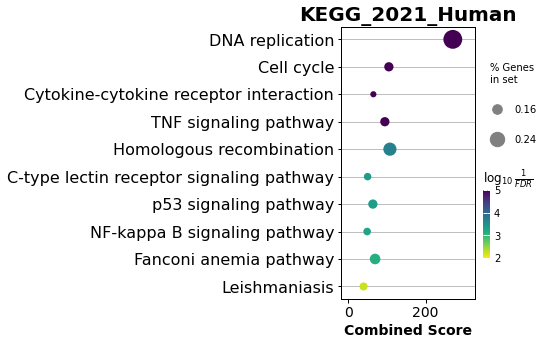

In [268]:
# to save your figure, make sure that ``ofname`` is not None
ax = dotplot(enr.res2d, title='KEGG_2021_Human',cmap='viridis_r', size=10, figsize=(3,5))


In [271]:
enr.res2d.head(20)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,KEGG_2019_Mouse,DNA replication,11/35,6.018435e-09,0.000001,0,0,14.276973,270.240799,RFC5;POLA1;RFC4;MCM7;LIG1;PRIM1;POLD1;MCM3;MCM...
1,KEGG_2019_Mouse,Cell cycle,19/123,1.076728e-08,0.000001,0,0,5.741247,105.333255,MCM7;PLK1;TTK;CDC25C;CDC20;CCNA2;CCNB2;CCNB1;T...
2,KEGG_2019_Mouse,Cytokine-cytokine receptor interaction,30/292,1.550686e-08,0.000001,0,0,3.634070,65.347779,CX3CR1;CSF1R;CSF3;CXCR5;IL27;TNF;CX3CL1;IL1RL1...
3,KEGG_2019_Mouse,TNF signaling pathway,17/110,6.332367e-08,0.000004,0,0,5.729085,94.959617,EDN1;IFNB1;TNFAIP3;TRAF1;NOD2;PTGS2;TNF;MMP9;C...
4,KEGG_2019_Mouse,Homologous recombination,9/41,4.205622e-06,0.000198,0,0,8.729133,108.058712,RAD51B;BLM;BRIP1;RAD51;EME1;POLD1;RAD54L;BRCA2...
5,KEGG_2019_Mouse,C-type lectin receptor signaling pathway,14/112,1.188915e-05,0.000442,0,0,4.454461,50.513076,IL10;EGR3;PTGS2;TNF;MALT1;IL6;CLEC4D;IL1B;MAPK...
6,KEGG_2019_Mouse,p53 signaling pathway,11/71,1.315747e-05,0.000442,0,0,5.700161,64.061381,CCNB2;CCNB1;RRM2;CCNE2;CDK4;SERPINE1;CDK1;FAS;...
7,KEGG_2019_Mouse,NF-kappa B signaling pathway,13/102,1.963052e-05,0.000577,0,0,4.549327,49.307544,TNFAIP3;TRAF1;PTGS2;TNF;MALT1;IL1B;CCL4;LTA;BC...
8,KEGG_2019_Mouse,Fanconi anemia pathway,9/51,2.755740e-05,0.000720,0,0,6.647329,69.791896,FANCI;BLM;BRIP1;RAD51;EME1;FANCD2;FANCA;FANCB;...
9,KEGG_2019_Mouse,Leishmaniasis,9/67,2.472669e-04,0.005811,0,0,4.809598,39.943912,IL10;MARCKSL1;ITGA4;NOS2;IL1B;CYBB;PTPN6;PTGS2...


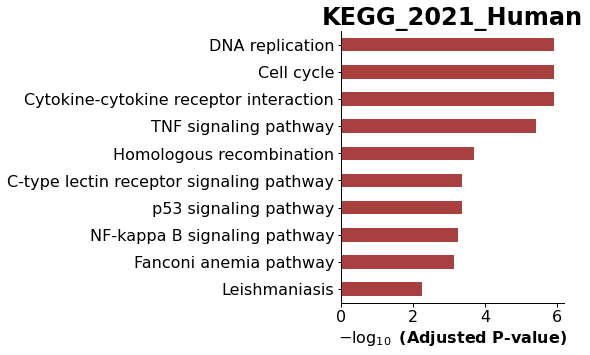

In [269]:
# to save your figure, make sure that ``ofname`` is not None
ax = barplot(enr.res2d,title='KEGG_2021_Human', figsize=(4, 5), color='darkred')


In [219]:
os.listdir(PPIDir)

['string_interactions_autophage.tsv',
 'inflammatory_response.tsv.sif',
 'PPI_inflammatory_response.pdf',
 'PPI_inflammatory_response_Anno_2.pdf',
 'PPI_inflammatory_response_Anno.pdf',
 'string_interactions_short_Inflammatory.tsv',
 'inflammatory_response.tsv',
 'string_interactions_short_ImmuneProcess.tsv',
 'Inflammatory.pdf']

In [220]:
PPI = pd.read_table(PPIDir + '/string_interactions_autophage.tsv')
PPI
    

,#node1,node2,node1_string_id,node2_string_id,neighborhood_on_chromosome,gene_fusion,phylogenetic_cooccurrence,homology,coexpression,experimentally_determined_interaction,database_annotated,automated_textmining,combined_score
0,Atf3,Ddit3,10090.ENSMUSP00000027941,10090.ENSMUSP00000026475,0,0,0.000,0.000,0.253,0.655,0.72,0.623,0.969
1,Atf3,Ppp1r15a,10090.ENSMUSP00000027941,10090.ENSMUSP00000128497,0,0,0.000,0.000,0.290,0.000,0.00,0.604,0.706
2,Atg12,Map1lc3a,10090.ENSMUSP00000038489,10090.ENSMUSP00000029128,0,0,0.000,0.000,0.114,0.245,0.50,0.871,0.951
3,Atg12,Pink1,10090.ENSMUSP00000038489,10090.ENSMUSP00000030536,0,0,0.000,0.000,0.054,0.000,0.00,0.777,0.780
4,Atg12,Bnip3,10090.ENSMUSP00000038489,10090.ENSMUSP00000101718,0,0,0.000,0.000,0.058,0.000,0.00,0.734,0.738
5,Atg12,Bcl2l1,10090.ENSMUSP00000038489,10090.ENSMUSP00000105445,0,0,0.000,0.000,0.058,0.061,0.00,0.733,0.743
6,Atg12,Wipi1,10090.ENSMUSP00000038489,10090.ENSMUSP00000099349,0,0,0.000,0.000,0.044,0.501,0.00,0.872,0.933
7,Atg12,Nbr1,10090.ENSMUSP00000038489,10090.ENSMUSP00000099388,0,0,0.000,0.000,0.069,0.000,0.00,0.932,0.934
8,Atg12,Nod2,10090.ENSMUSP00000038489,10090.ENSMUSP00000113773,0,0,0.000,0.000,0.000,0.000,0.90,0.432,0.940
9,Atg12,Ulk1,10090.ENSMUSP00000038489,10090.ENSMUSP00000143536,0,0,0.000,0.000,0.053,0.804,0.00,0.812,0.962


In [221]:
srtedPPI = PPI.sort_values('combined_score', ascending=False).reset_index(drop=True)
srtedPPI.head(5)

,#node1,node2,node1_string_id,node2_string_id,neighborhood_on_chromosome,gene_fusion,phylogenetic_cooccurrence,homology,coexpression,experimentally_determined_interaction,database_annotated,automated_textmining,combined_score
0,Bcl2,Bnip3,10090.ENSMUSP00000108371,10090.ENSMUSP00000101718,0,0,0.0,0.000,0.000,0.464,0.9,0.996,0.999
1,Bcl2,Bcl2l1,10090.ENSMUSP00000108371,10090.ENSMUSP00000105445,0,0,0.0,0.888,0.000,0.645,0.9,0.984,0.999
2,Atg14,Ulk1,10090.ENSMUSP00000153718,10090.ENSMUSP00000143536,0,0,0.0,0.000,0.147,0.942,0.9,0.788,0.998
3,Bcl2,Bmf,10090.ENSMUSP00000108371,10090.ENSMUSP00000087686,0,0,0.0,0.000,0.000,0.168,0.5,0.992,0.996
4,Bcl2l1,Bnip3,10090.ENSMUSP00000105445,10090.ENSMUSP00000101718,0,0,0.0,0.000,0.000,0.095,0.9,0.934,0.993


In [229]:
allNodes = list(set(PPI['node2'].tolist() + PPI['#node1'].to_list()))
len(allNodes)

21

In [731]:
allNodesDEGs = DEGsFilter[DEGsFilter['Geneid'].isin(allNodes)].sort_values('log2FoldChange', ascending=False).reset_index(drop=True)
allNodesDEGs

,Geneid,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,status
0,Tnfsf9,6348.880935,-2.518949,0.117253,-21.482989,2.245797e-102,2.711328e-100,down
1,Nlrp3,12865.011226,-2.603961,0.336893,-7.729346,1.081001e-14,8.849414e-14,down
2,Cdca8,925.927741,-2.716287,0.152194,-17.847590,3.017804e-71,1.978883e-69,down
3,Mcm2,867.558731,-2.803098,0.176835,-15.851531,1.371980e-56,6.329728e-55,down
4,Ccrl2,1654.330641,-2.807103,0.607581,-4.620128,3.835029e-06,1.386923e-05,down
5,Smc2,3478.472298,-2.834414,0.141943,-19.968747,1.030048e-88,9.642149e-87,down
6,Prim1,397.567252,-2.844005,0.221958,-12.813232,1.382533e-37,3.550610e-36,down
7,Traf1,8290.044864,-2.862356,0.430024,-6.656274,2.808563e-11,1.720295e-10,down
8,Cln3,1775.259846,-2.884021,0.142675,-20.213919,7.384565e-91,7.226804e-89,down
9,Ikbke,6658.131353,-2.909005,0.290114,-10.027095,1.158754e-23,1.627042e-22,down


In [781]:
gene = 'Erf'

DEGsAtf = DEGsFilter[DEGsFilter['Geneid'].str.contains(gene, flags=re.IGNORECASE)].reset_index(drop=True)
DEGsAtf.index +=1
DEGsAtf

,Geneid,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,status


In [782]:
HDAC = fpkm[fpkm['Geneid'].str.contains(gene, flags=re.IGNORECASE)].reset_index(drop=True)
HDAC.index += 1
HDAC

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
1,Erf,12.09,12.56,6.21,5.84,4.53,4.95,7.41,7.22
2,Mterf1a,6.50,8.18,7.69,6.39,6.05,8.71,8.65,8.08
3,Mterf1b,4.29,3.71,4.20,3.67,5.05,5.30,5.50,7.79
4,Mterf2,1.96,1.69,1.30,1.12,0.72,1.33,1.35,1.46
5,Mterf3,19.75,25.96,22.49,20.96,49.92,52.79,52.86,53.49
6,Mterf4,13.24,10.61,9.59,9.52,16.66,17.31,16.89,15.51
7,Serf1,17.16,12.77,10.50,6.82,12.80,9.64,15.92,15.11
8,Serf2,5.94,5.08,2.92,2.82,5.32,5.42,6.89,8.44
9,Terf1,21.03,20.70,13.86,13.80,16.89,18.77,18.69,19.50
10,Terf2,15.83,15.20,7.62,6.77,7.89,9.50,14.52,13.34


In [787]:
peak = pd.read_csv('/Users/fenn/Documents/PhDProjects/MCB/ATAC-seq/Peaks/DE_Peaks.csv')
peak

,Geneid,DMSO,LPS-MCB,LPS,MCB
0,14,0,13,331,18
1,26,0,12,359,12
2,27,0,2,300,4
3,28,0,1,285,2
4,32,0,0,166,3
...,...,...,...,...,...
9146,119614,20,26,26,0
9147,119615,31,14,67,0
9148,119616,27,10,74,0
9149,119617,19,14,38,0


In [783]:
help(heatmapPlot)

Help on function heatmapPlot in module __main__:

heatmapPlot(exp, length, outDir, fileName)



[0.5 1.5 2.5 3.5 4.5]


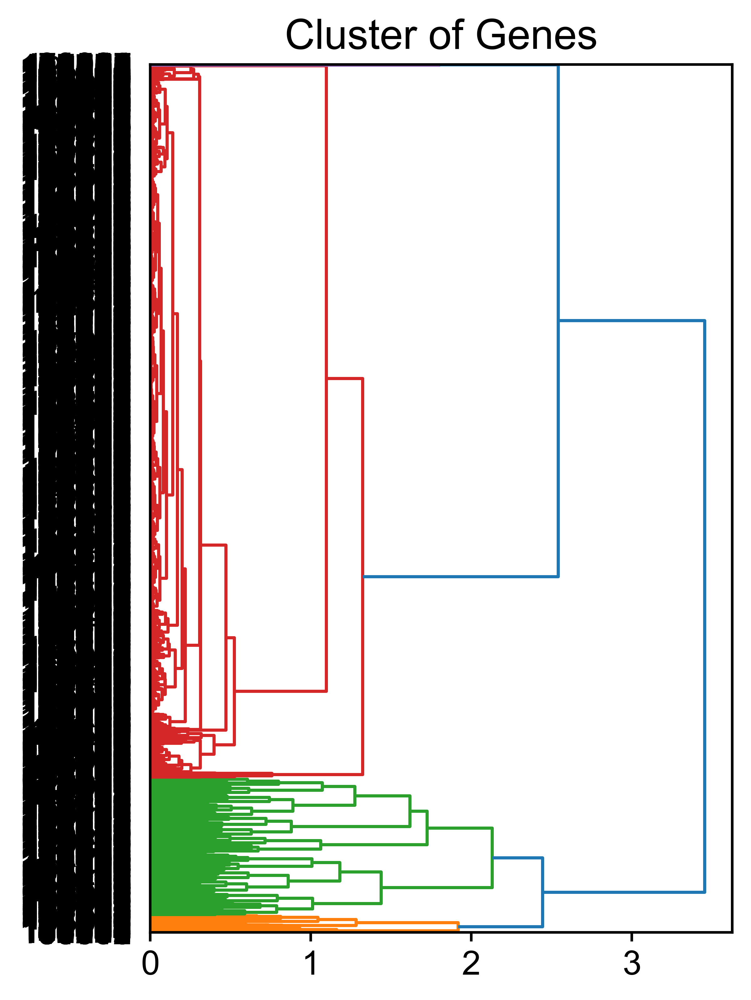

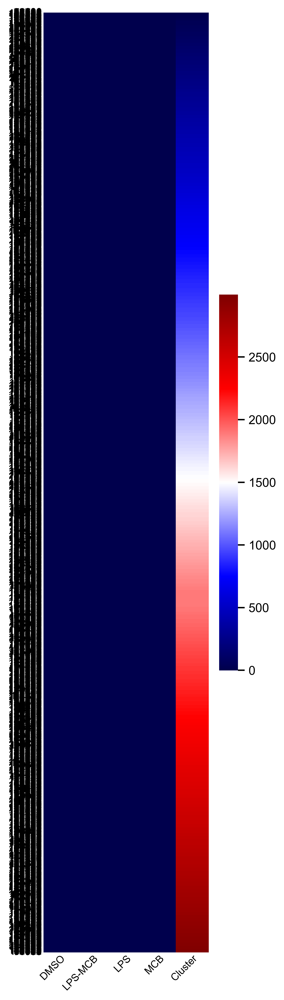

In [789]:
# #直接聚类，不适用归一化
# kinaseDEGsExp = clusterSample(peak)
# # kinaseDEGsExp.to_csv(kinaseDir + 'mmAllKinases.csv')
# kinaseDEGsExp
#归一化后再聚类
normClusterFPKM = clusterSample(normMatrix(peak.set_index('Geneid'),1).reset_index())
#使用归一化后的结果进行热图绘制
heatmapPlot(normClusterFPKM.loc[:,:], length=15, outDir=PPIDir, fileName='Peaks_9151_L6')


In [236]:
allNodesFPKM = fpkm[fpkm['Geneid'].isin(allNodesDEGs['Geneid'].to_list())].reset_index(drop=True)
allNodesFPKM

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
0,Atf3,17.85,5.29,325.88,336.37,24.87,47.33,3.02,3.24
1,Atg12,17.40,16.75,11.54,9.15,66.16,60.61,58.91,61.39
2,Atg14,5.28,4.48,1.64,1.76,13.93,12.99,20.37,22.10
3,Bcl2,2.02,2.27,0.82,0.70,3.69,3.82,2.50,2.33
4,Bcl2a1a,3.04,2.40,86.60,82.69,7.55,14.34,0.71,0.25
5,Bcl2l1,6.52,8.44,95.54,91.85,9.56,10.75,6.04,5.18
6,Bcl6,12.11,13.57,20.77,21.47,3.36,4.47,7.75,7.88
7,Bcl6b,0.30,0.28,4.62,3.68,1.14,1.07,0.33,0.24
8,Bmf,4.61,5.44,0.25,0.20,0.99,1.34,10.56,10.16
9,Bnip3,134.57,141.13,93.08,94.54,11.13,12.35,21.56,24.80


In [238]:
# 将值的列表转换为Categorical类型，并按照指定顺序排序
allNodesFPKM['rank'] = pd.Categorical(allNodesFPKM['Geneid'], categories=allNodesDEGs['Geneid'].to_list(), ordered=True)
SrtedallNodesFPKM = allNodesFPKM.sort_values('rank').reset_index(drop=True)
SrtedallNodesFPKM

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2,rank
0,Prnp,1.56,1.21,0.43,0.51,37.46,41.74,9.01,8.80,Prnp
1,Ulk1,2.76,4.56,0.65,0.78,10.28,9.16,15.53,14.95,Ulk1
2,Atg14,5.28,4.48,1.64,1.76,13.93,12.99,20.37,22.10,Atg14
3,Wipi1,2.26,2.46,1.37,0.94,7.05,10.24,10.04,12.50,Wipi1
4,Map1lc3a,3.03,2.45,2.20,2.07,13.67,15.63,10.84,9.48,Map1lc3a
5,Atg12,17.40,16.75,11.54,9.15,66.16,60.61,58.91,61.39,Atg12
6,Ddit3,25.19,8.35,8.64,10.27,26.22,84.42,20.70,19.82,Ddit3
7,Ctsh,0.72,0.65,0.47,0.65,3.28,2.91,3.40,2.37,Ctsh
8,Bmf,4.61,5.44,0.25,0.20,0.99,1.34,10.56,10.16,Bmf
9,Pink1,4.59,5.10,1.32,1.64,7.78,7.06,15.04,14.33,Pink1


In [196]:
len(set(PPI['node2'].drop_duplicates() + PPI['#node1'].drop_duplicates()))
len(set(PPI['node2'].drop_duplicates() + PPI['#node1'].drop_duplicates()))

20

In [643]:
# PPIDir = '/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/PPI_Network/metabalism'
# PPIDir = '/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/PPI_Network/Up/DNA_replication'
# PPIDir = '/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/PPI_Network/Up/immuneresponse'
# PPIDir = '/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/PPI_Network/Up/lipid_metabolism'
# PPIDir = '/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/PPI_Network/Up/cellCycle'
###读取nodes数据
PPIDir = '/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/PPI_Network/Up/mitophagy/'
os.listdir(PPIDir)

['DNA_replication_38.tsv',
 'kulin_family_31.tsv',
 'Heatmap_Mitophagy-16_genes_L6.pdf',
 'string_lipid_metabolism_domain.tsv',
 'immune_38.tsv',
 'Heatmap_JakStat-13_genes_L6.pdf',
 'Heatmap_InnateImmune-24_genes_L6.pdf',
 'Heatmap_Mitophagy-21_genes_L6.pdf',
 'mitophagy_12_domain.tsv',
 'innateImmune.tsv',
 'TranscriptRegulation.tsv',
 'Heatmap_InnateImmune-21_genes_L6.pdf',
 'immune_2_13.tsv',
 'mitiphagy_16_domain.tsv',
 'immune_25.tsv',
 'fpkm_mitophagy_12_domain.tsv',
 'Jak_stat_nodes.tsv',
 'autophagy_21.tsv',
 'immuneResponse_12.tsv',
 'Heatmap_DNA-38_genes_L6.pdf']

In [644]:
mitophagy = pd.read_table(PPIDir + '/immune_38.tsv')
allNodes = list(set(mitophagy['node2'].tolist() + mitophagy['#node1'].to_list()))
print(len(allNodes))
mitophagy.head()

38


,#node1,node2,node1_string_id,node2_string_id,neighborhood_on_chromosome,gene_fusion,phylogenetic_cooccurrence,homology,coexpression,experimentally_determined_interaction,database_annotated,automated_textmining,combined_score
0,Acod1,Ccl3,10090.ENSMUSP00000022722,10090.ENSMUSP00000001008,0,0,0.0,0.0,0.562,0.0,0.0,0.298,0.679
1,Acod1,Ccl4,10090.ENSMUSP00000022722,10090.ENSMUSP00000019074,0,0,0.0,0.0,0.471,0.0,0.0,0.277,0.601
2,Acod1,Tnfaip3,10090.ENSMUSP00000022722,10090.ENSMUSP00000019997,0,0,0.0,0.0,0.171,0.0,0.0,0.447,0.522
3,Acod1,Isg15,10090.ENSMUSP00000022722,10090.ENSMUSP00000082548,0,0,0.0,0.0,0.127,0.0,0.0,0.385,0.441
4,Acod1,Ifit1,10090.ENSMUSP00000022722,10090.ENSMUSP00000099888,0,0,0.0,0.0,0.179,0.0,0.0,0.420,0.504


In [664]:
DEGsFilter = pd.read_csv(DEGsDir + 'DEGsSig_851_all.csv')


,Geneid,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,status
0,Rhbdd2,344.778510,-2.000858,0.222861,-8.978050,2.756071e-19,3.074503e-18,down
1,Fancb,183.173534,-2.005601,0.271928,-7.375484,1.637487e-13,1.217092e-12,down
2,Eno1b,6433.765868,-2.008963,0.122975,-16.336318,5.444257e-60,2.757996e-58,down
3,Gemin6,248.826079,-2.011772,0.237937,-8.455066,2.789301e-17,2.711226e-16,down
4,Ska2,257.692818,-2.016067,0.754084,-2.673532,7.505711e-03,1.598615e-02,down
...,...,...,...,...,...,...,...,...
490,1110002J07Rik,305.883223,-6.533460,0.439248,-14.874189,4.848209e-50,1.869527e-48,down
491,Cxcl11,2812.173528,-6.676780,0.172500,-38.705893,0.000000e+00,0.000000e+00,down
492,Il6,180.099397,-7.000070,0.641771,-10.907423,1.062252e-27,1.819917e-26,down
493,Csf3,3549.125337,-7.489687,0.637487,-11.748767,7.165649e-32,1.517473e-30,down


In [675]:
Down = DEGsFilter[(DEGsFilter['log2FoldChange'] < -2.5) & (DEGsFilter['baseMean'] > 100)].reset_index(drop=True)
Down.to_csv('/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/enrichmentRes/GO_PPI/Down_DEGs_250.csv',index=None)

In [713]:
Down = Down.sort_values('log2FoldChange', ascending=True).reset_index(drop=True)
Down

,Geneid,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,status
0,Lta,377.542990,-9.662288,1.037277,-9.315055,1.218889e-20,1.456578e-19,down
1,Csf3,3549.125337,-7.489687,0.637487,-11.748767,7.165649e-32,1.517473e-30,down
2,Il6,180.099397,-7.000070,0.641771,-10.907423,1.062252e-27,1.819917e-26,down
3,Cxcl11,2812.173528,-6.676780,0.172500,-38.705893,0.000000e+00,0.000000e+00,down
4,1110002J07Rik,305.883223,-6.533460,0.439248,-14.874189,4.848209e-50,1.869527e-48,down
...,...,...,...,...,...,...,...,...
248,Ebi3,1222.288869,-2.514418,0.158603,-15.853519,1.329244e-56,6.154544e-55,down
249,Ptgs2,49657.092353,-2.510732,0.399990,-6.276980,3.452128e-10,1.911470e-09,down
250,Uhrf1,863.140472,-2.509885,0.151176,-16.602414,6.694398e-62,3.473021e-60,down
251,Fam133b,6837.891166,-2.509877,0.098071,-25.592457,1.850960e-144,3.985118e-142,down


In [718]:
GOPPIDir = '/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/enrichmentRes/GO_PPI/'

In [791]:
DEGs_genes = pd.read_csv('/Users/fenn/Documents/PhDProjects/MCB/ATAC-seq/Peaks/peakAnnotation/DEGs_Genes_LPS_MCB.csv')
DEGs_genes
DEGs_genes_ATAC = set(DEGs_genes['SYMBOL'])
len(DEGs_genes_ATAC)

897

In [839]:
DE_Genes = set(DEGsFilter['Geneid'].to_list())
len(DE_Genes)

851

In [842]:
DEGsATAC = DEGs_genes_ATAC | DEGs_genes_ATAC_down
len(DEGsATAC)

1191

In [844]:
851-358

493

In [846]:
1191-358

833

In [854]:
pd.set_option('display.max_rows', 100)

In [857]:
pd.Series(list(mergeRNA_ATAC)).head(50)

0             Vma21
1             Olfm1
2              Tpm4
3             Gstp3
4             Arl10
5             Ddias
6             Cdca8
7              Gas7
8     2500002B13Rik
9           B4galt1
10           Glcci1
11           Zscan2
12           Slc2a6
13          Pitpnc1
14            Ssbp4
15             Bcl3
16            Dnmt1
17            Chst3
18          Mir7213
19           Cxcl14
20           Nipal3
21             Flna
22          Irf2bpl
23             Sgk1
24          Akap17b
25             Eno1
26            Acod1
27           Tgfbr1
28             Ajm1
29            Cenpv
30           Mllt11
31           Slc7a7
32          Aldh4a1
33             Actb
34            Cebpd
35            Zfp30
36             Mcm3
37          St3gal5
38              Tnf
39           Pmepa1
40            Tafa3
41           Ptchd1
42            Nol4l
43          Nfkbil1
44              Fyb
45         Atp6v1g2
46          Tmem218
47            Tiam1
dtype: object

In [807]:
mergeRNA_ATAC = DE_Genes & DEGs_genes_ATAC
mergeRNA_ATAC


{'2500002B13Rik',
 'Acod1',
 'Actb',
 'Ajm1',
 'Akap17b',
 'Aldh4a1',
 'Arl10',
 'Atp6v1g2',
 'B4galt1',
 'Bcl3',
 'Cdca8',
 'Cebpd',
 'Cenpv',
 'Chst3',
 'Cxcl14',
 'Ddias',
 'Dnmt1',
 'Eno1',
 'Flna',
 'Fyb',
 'Gas7',
 'Glcci1',
 'Gstp3',
 'Irf2bpl',
 'Mcm3',
 'Mir7213',
 'Mllt11',
 'Nfkbil1',
 'Nipal3',
 'Nol4l',
 'Olfm1',
 'Pitpnc1',
 'Pmepa1',
 'Ptchd1',
 'Sgk1',
 'Slc2a6',
 'Slc7a7',
 'Ssbp4',
 'St3gal5',
 'Tafa3',
 'Tgfbr1',
 'Tiam1',
 'Tmem218',
 'Tnf',
 'Tpm4',
 'Vma21',
 'Zfp30',
 'Zscan2'}

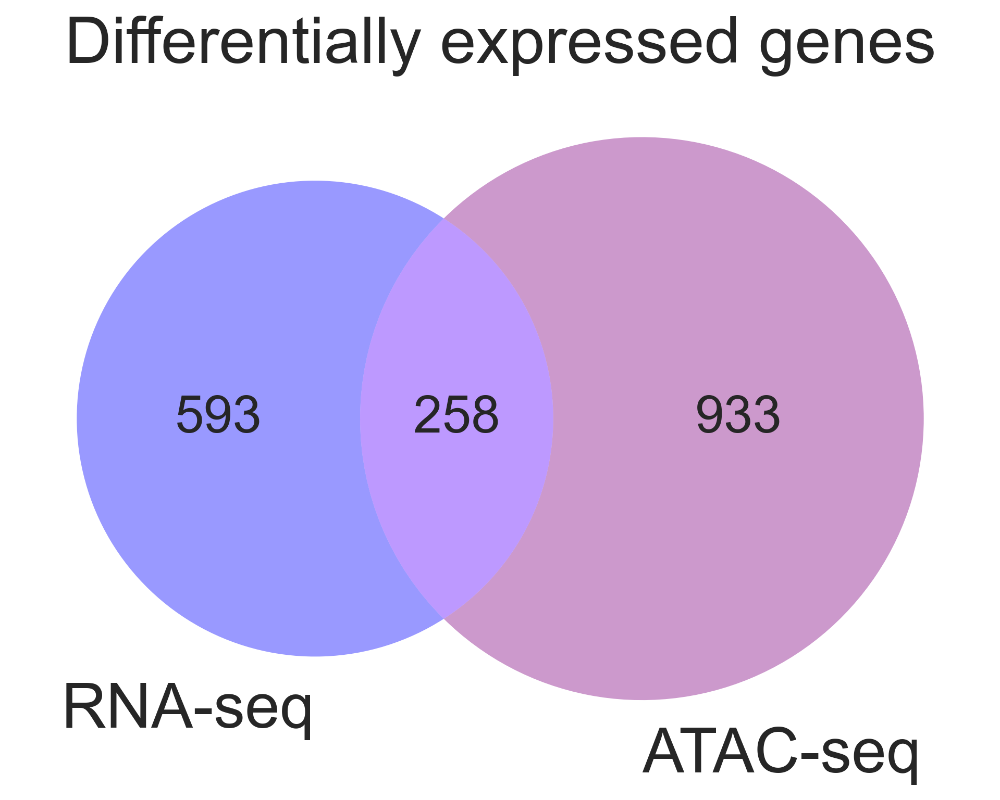

In [850]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn2
from matplotlib_venn import venn3
import seaborn as sns
import os

outDir_Peaks='/Users/fenn/Documents/PhDProjects/MCB/ATAC-seq/Peaks/DE_Peaks/'

plt.figure(figsize=(8,9), dpi=300)
sns.set_theme(context='notebook', style='ticks', font_scale=2, color_codes=False, rc=None)
# Use the venn2 function
#'skyblue' font='Times New Roman',
v=venn2(subsets = [593, 933, 258], set_labels = ('RNA-seq', 'ATAC-seq'), set_colors=('blue', 'purple'), alpha = 0.4)
#v = venn3(subsets = [set_1,set_0, set_all], set_labels = ('C1', 'C2','ASPCs'), set_colors=('blue', 'purple','green'), alpha = 0.4)
#v.get_label_by_id('A').set_text('Up-regulation')
plt.title("Differentially expressed genes", fontsize=30)
plt.savefig(outDir_Peaks + 'Venn_LPS-MCB_All_DEGs.pdf', dpi=700, bbox_inches='tight')
plt.show()

In [858]:
mergeRNA_ATAC

{'2500002B13Rik',
 'Acod1',
 'Actb',
 'Ajm1',
 'Akap17b',
 'Aldh4a1',
 'Arl10',
 'Atp6v1g2',
 'B4galt1',
 'Bcl3',
 'Cdca8',
 'Cebpd',
 'Cenpv',
 'Chst3',
 'Cxcl14',
 'Ddias',
 'Dnmt1',
 'Eno1',
 'Flna',
 'Fyb',
 'Gas7',
 'Glcci1',
 'Gstp3',
 'Irf2bpl',
 'Mcm3',
 'Mir7213',
 'Mllt11',
 'Nfkbil1',
 'Nipal3',
 'Nol4l',
 'Olfm1',
 'Pitpnc1',
 'Pmepa1',
 'Ptchd1',
 'Sgk1',
 'Slc2a6',
 'Slc7a7',
 'Ssbp4',
 'St3gal5',
 'Tafa3',
 'Tgfbr1',
 'Tiam1',
 'Tmem218',
 'Tnf',
 'Tpm4',
 'Vma21',
 'Zfp30',
 'Zscan2'}

In [837]:
DEGs_genes_ATAC_down = pd.read_csv('/Users/fenn/Documents/PhDProjects/MCB/ATAC-seq/Peaks/DE_Peaks/LPS_LPS-MCB_DE_Peaks-DowninLPS_1171-Annotation_GeneList_down_304.csv')
DEGs_genes_ATAC_down = set(DEGs_genes_ATAC_down['SYMBOL'])
len(DEGs_genes_ATAC_down)

304

In [860]:
DEGs_genes_ATAC_down

{'0610038B21Rik',
 '1700012I11Rik',
 '1700020D14Rik',
 '3110004A20Rik',
 '4930405O22Rik',
 '4930406D18Rik',
 '4930425O10Rik',
 '4930503E24Rik',
 '4930503O07Rik',
 '4930539C22Rik',
 '4930564D02Rik',
 '4930598N05Rik',
 '9130230L23Rik',
 '9530057J20Rik',
 'A130010J15Rik',
 'A430090L17Rik',
 'A730004F24Rik',
 'A930015D03Rik',
 'Adgrv1',
 'Agmo',
 'Aim2',
 'Akap7',
 'Aldh9a1',
 'Ankrd17',
 'Apbb1ip',
 'App',
 'Arpc2',
 'Atg10',
 'Atp2b1',
 'Atp6ap1l',
 'Bbs9',
 'Bend4',
 'Btbd10',
 'C330018D20Rik',
 'Cacna1e',
 'Cacnb2',
 'Ccdc181',
 'Cep128',
 'Chchd3',
 'Chl1',
 'Chst2',
 'Clip2',
 'Cnot6l',
 'Cntn5',
 'Cntnap5c',
 'Col19a1',
 'Commd9',
 'Crh',
 'Crhbp',
 'Ctla2b',
 'Cxcl13',
 'Cxcl5',
 'D130020L05Rik',
 'D230030E09Rik',
 'D6Ertd474e',
 'Dcdc2a',
 'Dicer1',
 'Dkk2',
 'Dock9',
 'Dph6',
 'Dpyd',
 'Dync2i1',
 'Edil3',
 'Eif4enif1',
 'Elapor2',
 'Emc7',
 'Eps15',
 'Ergic2',
 'Exoc4',
 'Eya1',
 'Faah',
 'Fah',
 'Fam13a',
 'Fam76b',
 'Fbxo15',
 'Fbxo32',
 'Fgg',
 'Flrt3',
 'Fmo9',
 'Focad',
 'F

In [864]:
DEGs_down_list = set(UpDEGs['Geneid'])
DEGs_down_list

{'1700030J22Rik',
 '1700109K24Rik',
 '2810029C07Rik',
 '2810047C21Rik1',
 '3110009E18Rik',
 '3110056K07Rik',
 '4930473A02Rik',
 '4930562C15Rik',
 '4930590J08Rik',
 '4931403E22Rik',
 '4931403G20Rik',
 '4933417D19Rik',
 '5430431A17Rik',
 '6720489N17Rik',
 '9430060I03Rik',
 '9930111J21Rik1',
 'A3galt2',
 'A830035O19Rik',
 'Aamdc',
 'Abcb9',
 'Abcd2',
 'Abcg1',
 'Abcg4',
 'Abhd2',
 'Abhd3',
 'Abtb1',
 'Acp4',
 'Acp5',
 'Acpp',
 'Acrbp',
 'Adam30',
 'Adarb1',
 'Adgre5',
 'Ager',
 'Agfg2',
 'Ajm1',
 'Akap17b',
 'Aldh4a1',
 'Alpk3',
 'Angel1',
 'Angptl2',
 'Ankrd13d',
 'Ankrd35',
 'Ankrd63',
 'Ankrd7',
 'Aoc2',
 'Aph1b',
 'Aph1c',
 'Arhgap24',
 'Arhgap26',
 'Arid5a',
 'Arl4c',
 'Arl4d',
 'Arrdc4',
 'Asap3',
 'Atg12',
 'Atg14',
 'Atp6v0d2',
 'B4galt1',
 'Baiap2',
 'Bcl2',
 'Bdh2',
 'Bmf',
 'Bspry',
 'Btd',
 'C1s2',
 'C2cd2l',
 'Cadm4',
 'Cage1',
 'Caprin2',
 'Car14',
 'Car15',
 'Car5a',
 'Card14',
 'Carhsp1',
 'Casp6',
 'Castor2',
 'Cbfa2t3',
 'Cbr2',
 'Cbx8',
 'Ccdc157',
 'Ccl25',
 'Ccser2',


In [ ]:
DEGs_genes_ATAC_down

{'Ctla2b',
 'Faah',
 'Fbxo32',
 'Gxylt1',
 'Ifi202b',
 'Lpin2',
 'Mmp19',
 'Tspan13',
 'Zswim6'}

In [795]:
len(DEGs_genes_ATAC)

897

In [719]:
Down.loc[:,['Geneid','log2FoldChange']].to_csv(GOPPIDir + 'log2FC_DEGs_250.csv', index=None)
Down.shape

(253, 8)

In [703]:
KEGGTerms = ['PIF1, POLQ, MCM7, LIG1, PRIM1, MCM10, CHTF18, CDC45, CHAF1A, PCLAF, MCM3, MCM5, POLE, MCM2, CDC45, MCM7, PRIM1, MCM3, MCM5, MCM10, MCM2, SPN, CLN3, CSF1R, CDCA8, BIRC5, IQGAP3, TNF, AURKB, NUSAP1, NCAPG, NCAPD2, SMC2, NCAPG, NCAPD2, SMC2, CSF1R, IL1RL1, IL6, TSLP, LPL, TNF, IL6, TSLP, NOS2, LPL, TNFSF9, TNF, CSF1R, IL6, TSLP, TNF, IL6, LPL, NLRP3, TNF, MALT1, NLRP3, TRAF1, TNF, MALT1, CX3CR1, CSF3, TNF, CXCL10, IL6, CXCL11, CCL4, CCRL2, LTA, TNFSF9, LTB, CLEC4E, IKBKE, CX3CR1, CXCL10, CXCL11, CCRL2, CCL4, CX3CR1, CXCL10, CXCL11, CCRL2, CCL4, HMGB2, CX3CR1, FGR, CSF1R, IL6, CSF3, PDGFB, TNF, IL6, PDGFB, IQGAP3, TNF']

In [705]:
# KEGGTerms = ['HCAR2, CX3CR1, CXCL10, ADORA2A, RGS16, GPR183, CCRL2, CCL4, GPR84']
allNodes = [x.split(', ') for x in KEGGTerms]
allNodes = [x.title() for x in list(*allNodes)]
print(len(allNodes))
allNodes = list(set(allNodes))
print(len(allNodes))
sorted(allNodes)

96
48


['Aurkb',
 'Birc5',
 'Ccl4',
 'Ccrl2',
 'Cdc45',
 'Cdca8',
 'Chaf1A',
 'Chtf18',
 'Clec4E',
 'Cln3',
 'Csf1R',
 'Csf3',
 'Cx3Cr1',
 'Cxcl10',
 'Cxcl11',
 'Fgr',
 'Hmgb2',
 'Ikbke',
 'Il1Rl1',
 'Il6',
 'Iqgap3',
 'Lig1',
 'Lpl',
 'Lta',
 'Ltb',
 'Malt1',
 'Mcm10',
 'Mcm2',
 'Mcm3',
 'Mcm5',
 'Mcm7',
 'Ncapd2',
 'Ncapg',
 'Nlrp3',
 'Nos2',
 'Nusap1',
 'Pclaf',
 'Pdgfb',
 'Pif1',
 'Pole',
 'Polq',
 'Prim1',
 'Smc2',
 'Spn',
 'Tnf',
 'Tnfsf9',
 'Traf1',
 'Tslp']

In [706]:
allNodesDEGs = DEGsFilter[DEGsFilter['Geneid'].isin(allNodes)].sort_values('log2FoldChange', ascending=False)
allNodesDEGs = allNodesDEGs[allNodesDEGs['log2FoldChange'].abs()>0.5].reset_index(drop=True)
allNodesDEGs

,Geneid,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,status
0,Tnfsf9,6348.880935,-2.518949,0.117253,-21.482989,2.245797e-102,2.711328e-100,down
1,Nlrp3,12865.011226,-2.603961,0.336893,-7.729346,1.081001e-14,8.849414e-14,down
2,Cdca8,925.927741,-2.716287,0.152194,-17.847590,3.017804e-71,1.978883e-69,down
3,Mcm2,867.558731,-2.803098,0.176835,-15.851531,1.371980e-56,6.329728e-55,down
4,Ccrl2,1654.330641,-2.807103,0.607581,-4.620128,3.835029e-06,1.386923e-05,down
5,Smc2,3478.472298,-2.834414,0.141943,-19.968747,1.030048e-88,9.642149e-87,down
6,Prim1,397.567252,-2.844005,0.221958,-12.813232,1.382533e-37,3.550610e-36,down
7,Traf1,8290.044864,-2.862356,0.430024,-6.656274,2.808563e-11,1.720295e-10,down
8,Cln3,1775.259846,-2.884021,0.142675,-20.213919,7.384565e-91,7.226804e-89,down
9,Ikbke,6658.131353,-2.909005,0.290114,-10.027095,1.158754e-23,1.627042e-22,down


In [707]:
allPPIFPKM = fpkm[fpkm['Geneid'].isin(allNodesDEGs['Geneid'].to_list())].reset_index(drop=True)
allPPIFPKM

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
0,Aurkb,86.90,82.99,31.97,37.43,3.26,5.68,9.41,8.06
1,Birc5,40.99,40.05,14.88,16.61,1.03,1.61,1.67,1.22
2,Ccl4,11.08,5.42,3370.24,3479.21,222.91,182.30,4.37,3.78
3,Ccrl2,0.66,0.13,65.78,71.13,6.85,16.88,1.31,1.38
4,Cdc45,26.38,28.96,21.58,23.13,2.18,3.75,3.75,3.68
5,Cdca8,97.49,94.14,51.57,53.55,8.89,10.47,10.58,7.63
6,Chtf18,10.35,10.34,3.49,3.59,0.27,0.59,0.27,0.20
7,Cln3,11.86,11.32,48.22,51.25,6.98,9.34,10.89,10.33
8,Csf3,0.00,0.12,280.53,270.28,1.00,2.73,0.08,0.20
9,Cxcl10,3.60,4.06,3774.72,3876.88,53.48,81.35,0.75,0.55


In [709]:
allPPIFPKM['Geneid'].to_clipboard(index=None)

In [700]:
sorted(allNodes)

['Adora2A',
 'Ccl4',
 'Ccrl2',
 'Cx3Cr1',
 'Cxcl10',
 'Gpr183',
 'Gpr84',
 'Hcar2',
 'Rgs16']

In [647]:
# 将值的列表转换为Categorical类型，并按照指定顺序排序
allPPIFPKM['rank'] = pd.Categorical(allPPIFPKM['Geneid'], categories=allNodesDEGs['Geneid'].to_list(), ordered=True)
SrtedallNodesPPIFPKM = allPPIFPKM.sort_values('rank').reset_index(drop=True)
SrtedallNodesPPIFPKM.index += 1
SrtedallNodesPPIFPKM = SrtedallNodesPPIFPKM.drop('rank', axis=1)
####change the file names###
SrtedallNodesPPIFPKM.to_csv(OUTPUT_PATH + '/fpkm-Innate-25_DEGs.csv', index=None)
SrtedallNodesPPIFPKM

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
1,Bcl3,1.22,1.33,15.74,14.79,4.42,4.67,1.38,0.92
2,Hck,7.30,6.49,54.84,60.40,11.46,22.91,7.36,5.77
3,Ccl3,76.95,35.91,9778.67,11127.73,2835.11,2825.21,28.17,28.93
4,Nod2,1.15,0.61,10.75,12.72,2.88,3.41,1.68,1.34
5,Tnfaip3,4.41,3.53,115.55,118.18,26.23,36.11,2.78,2.76
6,Spi1,129.02,125.16,240.75,259.26,66.02,65.88,47.08,39.25
7,Il1b,0.00,0.09,163.97,176.04,32.25,57.03,0.00,0.15
8,Fas,0.21,0.36,25.53,24.80,5.16,7.63,1.00,0.82
9,Clec4d,49.58,39.92,90.21,92.25,20.53,21.95,13.19,11.71
10,Cybb,217.63,215.98,853.86,826.18,166.11,219.46,155.15,154.88


In [482]:
# SrtedallNodesPPIFPKM.loc[5,'LPS-MCB_2'] = 5.3
SrtedallNodesPPIFPKM.loc[1,'LPS-MCB_2'] = 3.3
# SrtedallNodesPPIFPKM.loc[7,'DMSO_1'] = 4.23
SrtedallNodesPPIFPKM

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
1,Fcgr3,3.31,2.52,0.09,0.11,3.94,3.30,19.07,17.09
2,Cst7,11.91,7.83,4.20,3.47,30.18,32.11,39.28,33.78
3,Gp1ba,0.57,0.54,0.36,0.41,1.80,1.91,3.02,2.94
4,Itgb7,3.17,2.31,3.24,3.74,10.02,8.14,9.61,8.88
5,Pld3,14.55,12.34,22.48,26.12,40.52,40.33,35.42,36.89
6,Cnr2,0.85,0.86,0.06,0.12,0.42,0.64,2.79,2.41
7,Ext1,0.74,1.02,0.79,0.74,3.40,3.26,2.75,2.88
8,Itga7,0.94,0.94,0.63,0.87,5.20,6.42,2.36,2.16
9,Cfh,19.96,20.29,15.28,14.37,41.53,31.22,52.85,51.65
10,Lpin1,9.84,3.23,0.17,0.27,1.89,1.46,9.47,10.85


In [649]:
PPI_MCB = '/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/DEGs/DMSO_MCB/PPI/'
os.makedirs(PPI_MCB + 'inflammatory')
os.listdir(PPI_MCB)

['immuneResponse',
 '.DS_Store',
 'inflammatory',
 'mitophagy',
 'Mitophagy_21_last',
 'Transcription_7',
 'InnateImmune',
 'lipidMetabolism',
 'mitophagy_16']

In [650]:
immuneDir = PPI_MCB + 'inflammatory'
immuneDir

'/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/DEGs/DMSO_MCB/PPI/inflammatory'

In [867]:
fpkm.head()

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
0,0610009B22Rik,24.26,25.77,14.60,12.51,5.06,9.60,15.55,13.06
1,0610010F05Rik,10.35,11.60,12.66,13.09,3.28,3.91,7.54,7.49
2,0610010K14Rik,24.80,24.35,20.26,20.03,25.08,24.24,19.29,16.10
3,0610012G03Rik,10.14,7.26,3.59,2.86,6.62,5.89,8.28,10.00
4,0610030E20Rik,13.98,17.73,15.26,16.05,24.47,23.12,33.09,34.03


In [900]:
markers = '''APOBEC3
CCR5
GSDMA
HDAC4
IFITM3
IFNAR2
JAK2
NOD1
OAS1E
OAS2
OAS3
RIPK3
TRIM56'''
markerlist = [s.title() for s in markers.split('\n')]
markerlist

['Apobec3',
 'Ccr5',
 'Gsdma',
 'Hdac4',
 'Ifitm3',
 'Ifnar2',
 'Jak2',
 'Nod1',
 'Oas1E',
 'Oas2',
 'Oas3',
 'Ripk3',
 'Trim56']

In [915]:
allDEGs = set(DEGsFilter['Geneid'])
allDEGs

{'0610010F05Rik',
 '1110002J07Rik',
 '1110002L01Rik',
 '1700007L15Rik',
 '1700028K03Rik',
 '1700109H08Rik',
 '1700109K24Rik',
 '1810014B01Rik',
 '2310043L19Rik',
 '2500002B13Rik',
 '2510009E07Rik',
 '2700099C18Rik',
 '2810002D19Rik',
 '2810429I04Rik',
 '2900005J15Rik',
 '3000002C10Rik',
 '3110009E18Rik',
 '3110056K07Rik',
 '4632427E13Rik',
 '4930432K21Rik',
 '4930473A02Rik',
 '4933404O12Rik',
 '4933432I03Rik',
 '5430431A17Rik',
 '5430437J10Rik',
 '5830408C22Rik',
 '5830428M24Rik',
 '6530402F18Rik',
 '9330159M07Rik',
 '9930014A18Rik',
 'A230028O05Rik',
 'A830035O19Rik',
 'A930024E05Rik',
 'AI839979',
 'Aamdc',
 'Abcb9',
 'Abcd2',
 'Abcg1',
 'Abhd2',
 'Abr',
 'Abtb1',
 'Acod1',
 'Acp5',
 'Acrbp',
 'Acta1',
 'Actb',
 'Actg1',
 'Adarb1',
 'Adgre5',
 'Adhfe1',
 'Adm',
 'Adora2a',
 'Ager',
 'Agfg2',
 'Ajm1',
 'Akap17b',
 'Aldh3b1',
 'Aldh4a1',
 'Alg8',
 'Ambp',
 'Anapc15',
 'Angel1',
 'Angptl2',
 'Ankle1',
 'Ankrd13d',
 'Ankrd37',
 'Anln',
 'Aoc2',
 'Ap5b1',
 'Aph1b',
 'Aph1c',
 'Apobr',
 'A

In [920]:
DEmarkersList = set(markerList) & allDEGs
DEmarkersList

{'Birc5', 'Egr3', 'Tiam1', 'Traf1'}

In [963]:
DEGs_65 = pd.read_csv('/Users/fenn/Documents/PhDProjects/MCB/ChIP-seq/peakAnnotation/FPKM_heatmap/LPS_Up_MCB_List_50.csv')
DEGs_65 = DEGs_65['Genes'].to_list()
DEGs_65 = [s.title() for s in DEGs_65]
DEGs_65

['Actr3B',
 'Adcy9',
 'Alox12E',
 'Ambra1',
 'Atp2B1',
 'Birc5',
 'C4A',
 'Castor1',
 'Cbr1',
 'Ccr5',
 'Cd247',
 'Col6A4',
 'Ctss',
 'Cul4A',
 'Dapk3',
 'Dnah2',
 'Fgf9',
 'Fgr',
 'Foxo3',
 'Hdac4',
 'Jak2',
 'Jun',
 'Limk1',
 'Lin9',
 'Mapk13',
 'Mapk14',
 'Mcu',
 'Ncor2',
 'Nod1',
 'Oas3',
 'P2Rx7',
 'Padi4',
 'Pard3',
 'Pecam1',
 'Pik3Cb',
 'Plcb3',
 'Polb',
 'Prkag1',
 'Ptk2',
 'Rps27Rt',
 'Rps6Ka1',
 'Rps6Ka2',
 'Sh2B2',
 'Smad2',
 'Sphk1',
 'Tab1',
 'Tcirg1',
 'Traf1',
 'Xpo1',
 'Ywhaz']

In [964]:
# markerList = ['Vma21', 'Acod1', 'Atf3', 'Gxylt1', 'Ctla2b']
markerList = ['Egr1','Egr2','Egr3','Cxcl10','Isg15','Cxcl11'] + markerlist + DEGs_65
print(len(markerList))
markerList

69


['Egr1',
 'Egr2',
 'Egr3',
 'Cxcl10',
 'Isg15',
 'Cxcl11',
 'Apobec3',
 'Ccr5',
 'Gsdma',
 'Hdac4',
 'Ifitm3',
 'Ifnar2',
 'Jak2',
 'Nod1',
 'Oas1E',
 'Oas2',
 'Oas3',
 'Ripk3',
 'Trim56',
 'Actr3B',
 'Adcy9',
 'Alox12E',
 'Ambra1',
 'Atp2B1',
 'Birc5',
 'C4A',
 'Castor1',
 'Cbr1',
 'Ccr5',
 'Cd247',
 'Col6A4',
 'Ctss',
 'Cul4A',
 'Dapk3',
 'Dnah2',
 'Fgf9',
 'Fgr',
 'Foxo3',
 'Hdac4',
 'Jak2',
 'Jun',
 'Limk1',
 'Lin9',
 'Mapk13',
 'Mapk14',
 'Mcu',
 'Ncor2',
 'Nod1',
 'Oas3',
 'P2Rx7',
 'Padi4',
 'Pard3',
 'Pecam1',
 'Pik3Cb',
 'Plcb3',
 'Polb',
 'Prkag1',
 'Ptk2',
 'Rps27Rt',
 'Rps6Ka1',
 'Rps6Ka2',
 'Sh2B2',
 'Smad2',
 'Sphk1',
 'Tab1',
 'Tcirg1',
 'Traf1',
 'Xpo1',
 'Ywhaz']

In [965]:
MarkerExp = fpkm[fpkm['Geneid'].isin(markerList)].reset_index(drop=True)
MarkerExp

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
0,Adcy9,1.67,1.89,0.34,0.48,1.51,1.13,2.91,3.17
1,Ambra1,13.21,13.94,18.82,18.52,22.47,19.10,19.32,21.11
2,Apobec3,12.38,12.43,6.29,6.96,5.42,5.84,8.41,7.93
3,Birc5,40.99,40.05,14.88,16.61,1.03,1.61,1.67,1.22
4,Castor1,3.49,3.31,1.62,1.76,4.75,3.49,5.56,5.74
5,Cbr1,18.44,14.21,5.55,4.69,11.17,12.66,21.11,16.15
6,Ctss,357.07,334.06,289.87,273.53,606.47,564.16,651.25,621.47
7,Cxcl10,3.60,4.06,3774.72,3876.88,53.48,81.35,0.75,0.55
8,Cxcl11,0.06,0.10,188.73,180.58,1.98,2.40,0.03,0.04
9,Dapk3,9.04,9.03,7.83,8.21,11.68,11.82,10.36,8.83


,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2,Cluster
Geneid,,,,,,,,,
Ywhaz,-0.139343,1.058725,1.210457,0.957862,-0.407725,0.230777,-1.352322,-1.558431,3
Oas2,-0.890022,-0.770433,1.046408,1.750147,0.062095,0.747435,-0.949817,-0.995813,1
Jak2,-1.381593,-1.244040,1.128042,1.060269,0.587055,1.043826,-0.611217,-0.582343,1
Oas3,-1.179277,-1.407246,1.084290,1.224756,0.232286,1.134950,-0.638140,-0.451620,1
Tcirg1,-0.404518,-1.503447,1.434698,1.528803,-0.496531,0.457059,-0.184941,-0.831124,2
Egr3,-0.269645,-0.217540,1.512356,1.866672,-0.785487,-0.629171,-0.785487,-0.691698,2
Trim56,-0.490745,-0.499161,1.600576,1.819386,-0.928365,-0.625397,-0.461290,-0.415003,2
Fgr,-0.501043,-0.512974,1.677535,1.782084,-0.620035,-0.589894,-0.616895,-0.618779,2
Cxcl10,-0.589568,-0.589288,1.700580,1.762621,-0.559276,-0.542351,-0.591298,-0.591420,2


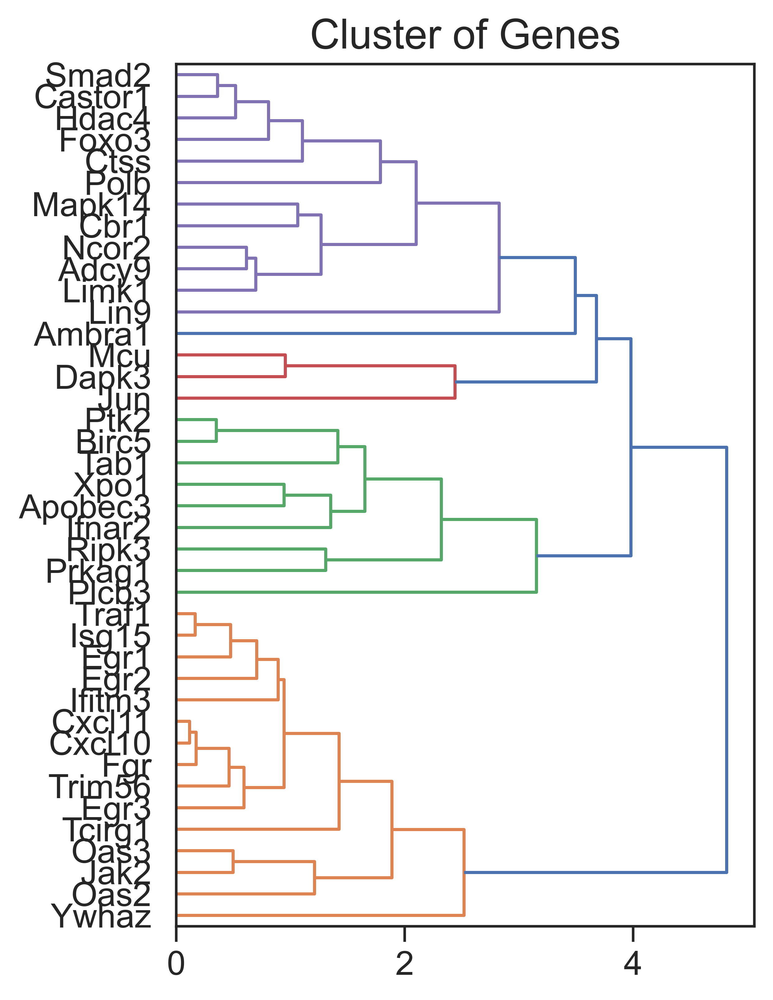

In [991]:
normSignal = normMatrix(MarkerExp.set_index('Geneid'),1)
# normSignal
clusterSignal = clusterSample(normSignal.reset_index())
clusterSignal = clusterSignal[~clusterSignal['Cluster'].isin([6])]
clusterSignal

In [992]:
clusterSignal = clusterSignal.drop(['Jun','Cbr1', 'Ripk3', 'Xpo1', 'Plcb3', 'Ywhaz','Lin9'], axis=0)
len(clusterSignal)

30

[0.5 1.5 2.5 3.5 4.5 5.5 6.5 7.5]


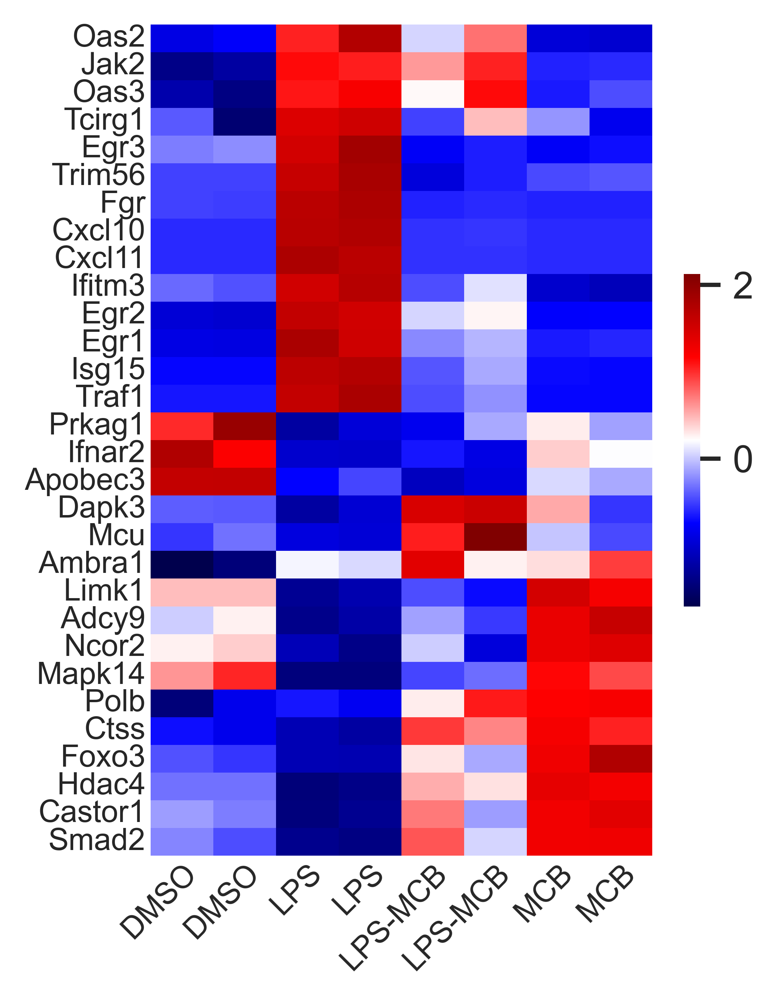

In [996]:
heatmapDir='/Users/fenn/Documents/PhDProjects/MCB/ChIP-seq/peakAnnotation/FPKM_heatmap'
#使用归一化后的结果进行热图绘制
heatmapPlot(clusterSignal.loc[:,:'MCB_2'], length=4.4, outDir=heatmapDir, fileName='ISGs_Uniq_genes_34_L6')

In [890]:
fpkm = pd.read_csv('/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/last_datas/FPKM_LPS_MCB.csv')
fpkm

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
0,0610009B22Rik,24.26,25.77,14.60,12.51,5.06,9.60,15.55,13.06
1,0610010F05Rik,10.35,11.60,12.66,13.09,3.28,3.91,7.54,7.49
2,0610010K14Rik,24.80,24.35,20.26,20.03,25.08,24.24,19.29,16.10
3,0610012G03Rik,10.14,7.26,3.59,2.86,6.62,5.89,8.28,10.00
4,0610030E20Rik,13.98,17.73,15.26,16.05,24.47,23.12,33.09,34.03
...,...,...,...,...,...,...,...,...,...
10524,Zxdc,3.07,3.49,2.37,2.16,3.99,4.64,7.07,8.18
10525,Zyg11b,9.26,9.77,6.33,6.23,17.83,18.63,23.46,24.58
10526,Zyx,1.98,1.91,8.40,8.07,4.56,5.23,2.57,2.34
10527,Zzef1,7.16,7.87,4.82,5.17,6.98,5.66,8.47,8.65


In [885]:
MarkerExp.loc[0,['LPS_1','LPS_2','LPS-MCB_1','LPS-MCB_2', 'MCB_1', 'MCB_2']] = [34.46, 31.12, 9.15, 11.12, 3.92, 4.42]
MarkerExp

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
0,Egr1,0.99,0.74,34.46,31.12,9.15,11.12,3.92,4.42
1,Egr2,0.24,0.15,9.32,8.95,3.82,4.54,0.98,1.06
2,Egr3,1.33,1.43,4.75,5.43,0.34,0.64,0.34,0.52


3
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMSO vs. LPS: t-test independent samples, P_val:2.740e-03 t=-1.906e+01
LPS vs. LPS-MCB: t-test independent samples, P_val:7.245e-03 t=1.168e+01
LPS vs. MCB: t-test independent samples, P_val:3.463e-03 t=1.695e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMSO vs. LPS: t-test independent samples, P_val:4.532e-04 t=-4.696e+01
LPS vs. LPS-MCB: t-test independent samples, P_val:6.607e-03 t=1.224e+01
LPS vs. MCB: t-test independent samples, P_val:5.436e-04 t=4.287e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-

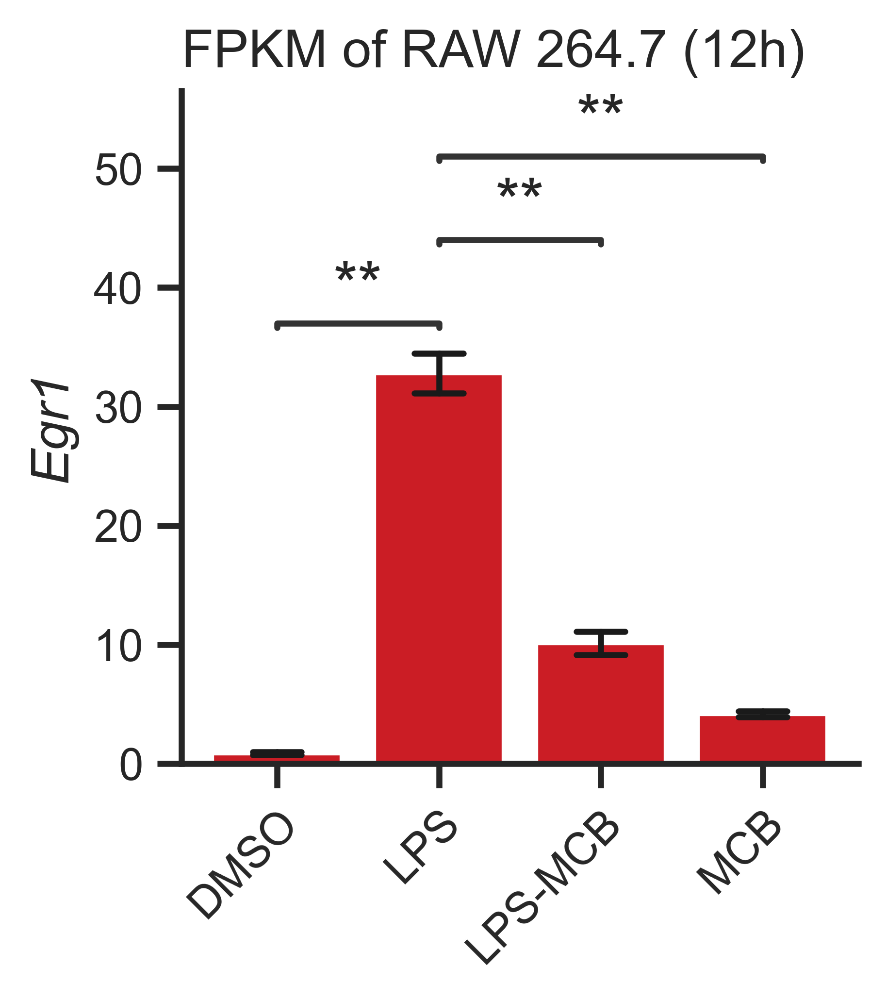

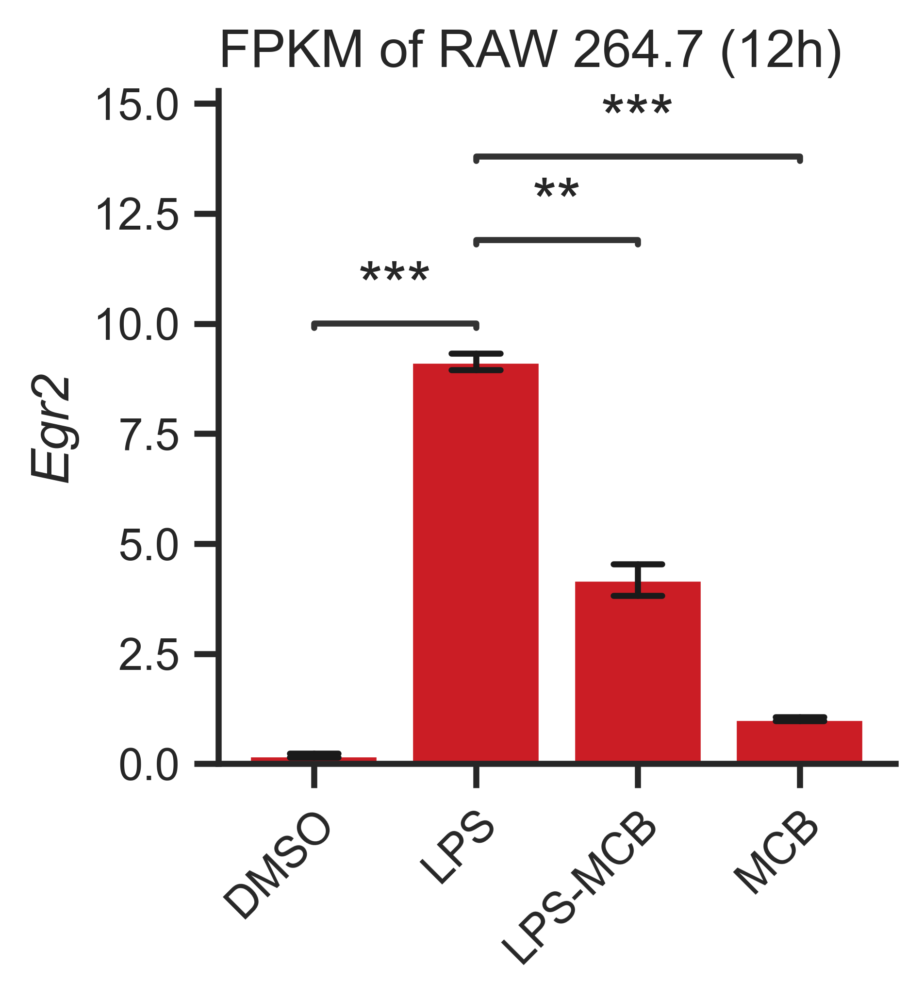

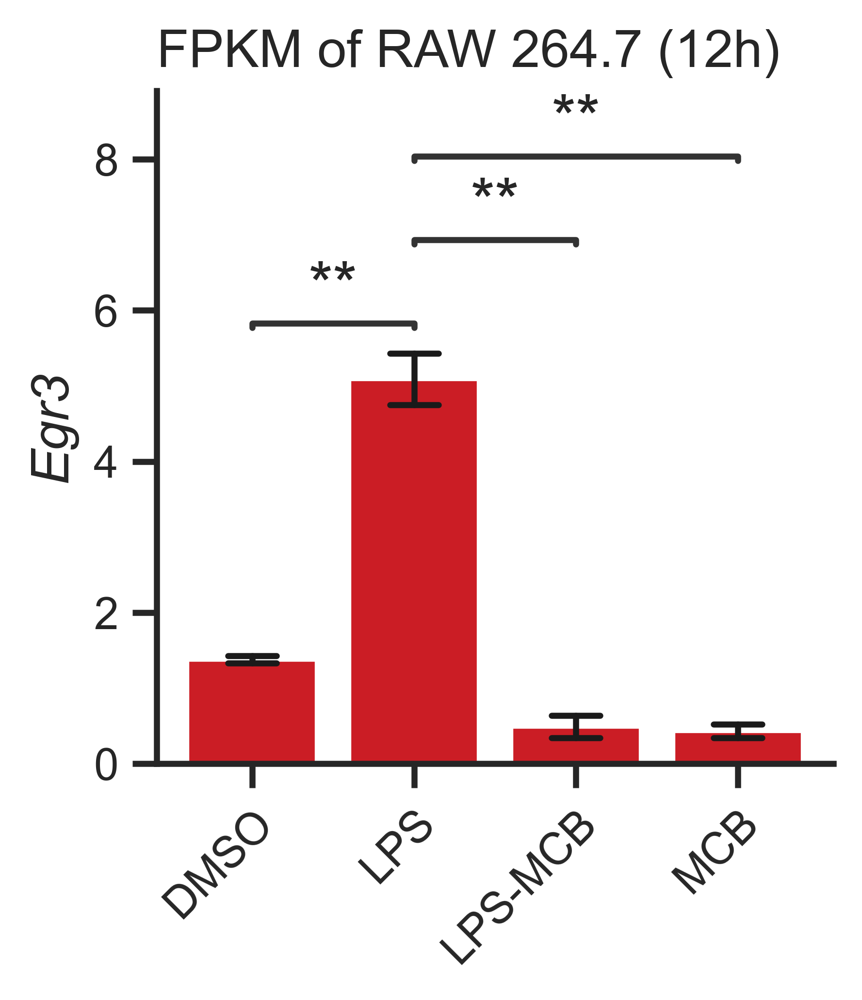

In [886]:
#绘制barplot
outDirIGV = '/Users/fenn/Documents/PhDProjects/MCB/ChIP-seq/Egr1/barPlot'
barPlotKegg(MarkerExp, outDirIGV)

In [725]:
SrtedallNodesPPIFPKM = HDAC
SrtedallNodesPPIFPKM

,Geneid,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2
1,Hdac1,17.61,19.69,18.93,18.00,13.00,13.79,11.42,9.58
2,Hdac10,8.18,8.73,3.02,2.69,2.70,2.45,6.53,6.11
3,Hdac2,102.13,100.50,95.62,92.09,74.52,80.12,85.23,84.48
4,Hdac3,45.00,46.95,31.14,34.73,48.42,49.19,41.62,37.16
5,Hdac4,3.38,3.38,1.91,2.02,4.45,4.20,5.52,5.39
6,Hdac5,14.57,12.92,2.12,1.99,4.29,4.76,11.80,12.93
7,Hdac6,7.87,8.19,4.96,4.11,6.95,6.62,9.17,8.71
8,Hdac8,4.24,3.57,1.87,1.80,1.92,2.56,4.54,3.78
9,Hdac9,7.59,5.03,2.83,3.01,3.11,1.57,2.14,3.00


,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2,Cluster
Geneid,,,,,,,,,
Hdac2,102.13,100.50,95.62,92.09,74.52,80.12,85.23,84.48,1
Hdac3,45.00,46.95,31.14,34.73,48.42,49.19,41.62,37.16,1
Hdac1,17.61,19.69,18.93,18.00,13.00,13.79,11.42,9.58,1
Hdac5,14.57,12.92,2.12,1.99,4.29,4.76,11.80,12.93,1
Hdac6,7.87,8.19,4.96,4.11,6.95,6.62,9.17,8.71,1
Hdac10,8.18,8.73,3.02,2.69,2.70,2.45,6.53,6.11,1
Hdac9,7.59,5.03,2.83,3.01,3.11,1.57,2.14,3.00,1
Hdac4,3.38,3.38,1.91,2.02,4.45,4.20,5.52,5.39,1
Hdac8,4.24,3.57,1.87,1.80,1.92,2.56,4.54,3.78,1


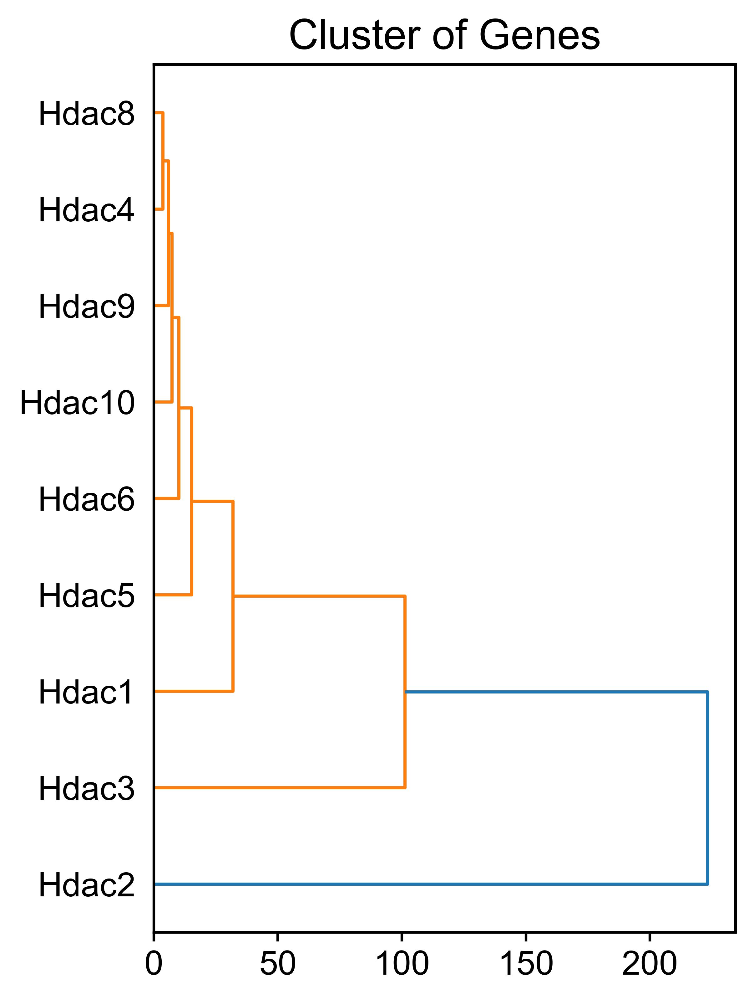

In [726]:
#直接聚类，不适用归一化
kinaseDEGsExp = clusterSample(SrtedallNodesPPIFPKM.loc[:,:'MCB_2'])
# kinaseDEGsExp.to_csv(kinaseDir + 'mmAllKinases.csv')
kinaseDEGsExp
#归一化后再聚类
normClusterFPKM = clusterSample(normMatrix(SrtedallNodesPPIFPKM.set_index('Geneid'),1).reset_index())

In [657]:
normClusterFPKM.index

Index(['Cfp', 'Csf1r', 'Cx3cr1', 'Bcl6', 'Lcp1', 'Spn', 'Spi1', 'Clec4d',
       'Tslp', 'Adm', 'Cybb', 'Lta', 'Fgr', 'Ccl4', 'Myc', 'Il27', 'Il6',
       'Nos2', 'Cxcl10', 'Bcl3', 'Ccl9', 'Ccl3', 'Il1b', 'Tnfaip3', 'Fas',
       'Malt1', 'Acod1', 'Ifit1', 'Tnf', 'C3ar1', 'Clec4e', 'Ikbke', 'Ccrl2',
       'Nlrp3', 'Isg15', 'Hck', 'Nod2'],
      dtype='object', name='Geneid')

In [658]:
# 删除特定的基因
normClusterFPKM = normClusterFPKM.drop(['Cfp', 'Csf1r', 'Cx3cr1'], axis=0)
normClusterFPKM

,DMSO_1,DMSO_2,LPS_1,LPS_2,LPS-MCB_1,LPS-MCB_2,MCB_1,MCB_2,Cluster
Geneid,,,,,,,,,
Bcl6,0.106594,0.332961,1.449290,1.557822,-1.250056,-1.077955,-0.569405,-0.549249,2
Lcp1,0.547102,0.335981,1.425769,1.432294,-0.984187,-0.948178,-0.906041,-0.902739,2
Spn,0.194735,-0.045075,1.574978,1.630045,-0.889741,-0.822239,-0.768948,-0.873754,2
Spi1,0.092852,0.044856,1.482126,1.712283,-0.690502,-0.692243,-0.926006,-1.023366,2
Clec4d,0.233613,-0.081459,1.558807,1.625344,-0.713886,-0.667571,-0.953288,-1.001560,2
Tslp,-0.720045,-0.853168,2.003437,1.343367,-0.714498,-0.523133,-0.206965,-0.328995,9
Adm,-0.434002,-0.482587,1.547179,1.894421,-0.609359,-0.606092,-0.657944,-0.651616,3
Cybb,-0.470988,-0.476808,1.773190,1.675554,-0.652715,-0.464533,-0.691374,-0.692326,3
Lta,-0.574206,-0.582182,1.812352,1.648835,-0.582182,-0.575003,-0.573408,-0.574206,3


In [659]:
normClusterFPKM.shape

(34, 9)

In [654]:
PPIDir

'/Users/fenn/Documents/PhDProjects/MCB/RNA-seq/PPI_Network/Up/mitophagy/'

[0.5 1.5 2.5 3.5 4.5 5.5 6.5 7.5]


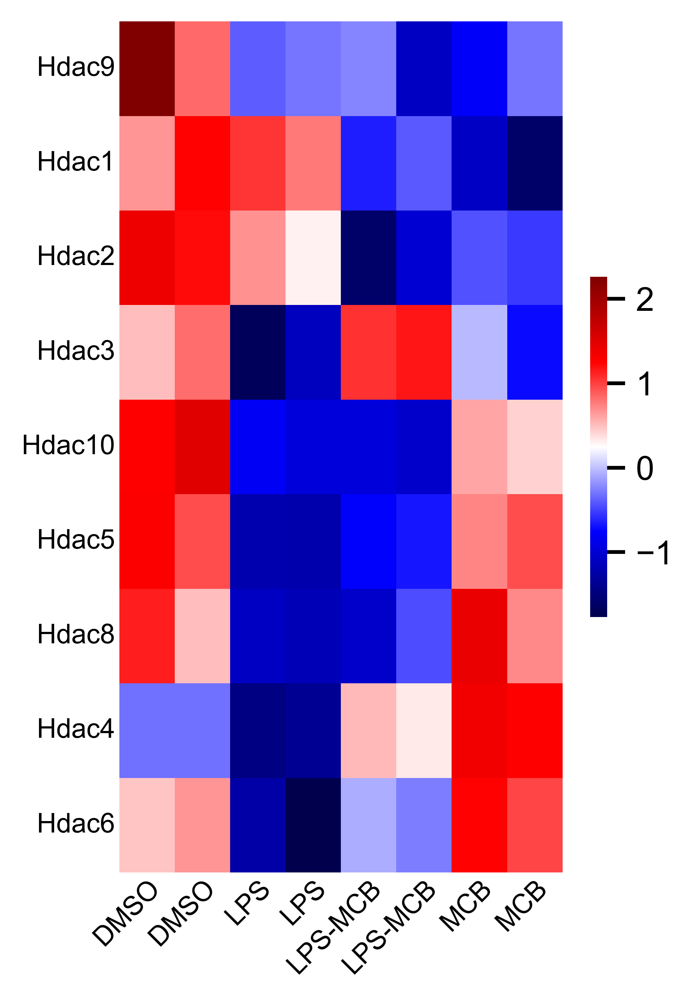

In [728]:
#使用归一化后的结果进行热图绘制
heatmapPlot(normClusterFPKM.loc[:,:'MCB_2'], length=5.1, outDir=PPIDir, fileName='HDACs-37_genes_L6')
